<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/hccho2/DL-UPMTP/blob/master/DL-TF-TORCH-CH9-Audio.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />구글 코랩에서 실행하기</a>
  </td>
</table>

In [ ]:
# sox 설치
!apt-get install sox
!pip install sox==1.4.1 -qq
!apt install tree

In [ ]:
!pip install simpleaudio==1.0.4

# 9.1 Audio Data 다루기

In [ ]:
import sox

In [ ]:
filename = 'kss_1_0000.wav'  # 'LJ001-0001.wav'
print(f'sampling rate: {sox.file_info.sample_rate(filename)}') # 22050, 44100, ...
print(f'bit depth: {sox.file_info.bitdepth(filename)}') # 16
print(f'channels: {sox.file_info.channels(filename)}') # 1 또는 2
print(f'bit rate: {sox.file_info.bitrate(filename)}')

sr = sox.file_info.sample_rate(filename);
bit_depth = sox.file_info.bitdepth(filename)
n_channels = sox.file_info.channels(filename)
print(f'bit rate(manual): {n_channels*bit_depth*sr}')

sampling rate: 44100.0
bit depth: 16
channels: 2
bit rate: 1410000.0
bit rate(manual): 1411200.0


## 9.1.1 Audio File Loading


In [ ]:
import librosa
import librosa.display
import soundfile
import scipy.io.wavfile
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
print(f'librosa version: {librosa.__version__}')  # 2023-03-11현재 0.8.1

librosa version: 0.10.1


wav 파일 정보 확인

In [ ]:
audio_filename = 'kss_1_0000.wav'  # 16-bit
y, sr = librosa.load(audio_filename,sr=22050, mono=True) # sr=22050(default), mono=True(default)
print(f'librosa: sr = {sr}, shape={y.shape}')
y, sr = soundfile.read(audio_filename)
print(f'soundfile: sr = {sr}, shape={y.shape}')
sr, y = scipy.io.wavfile.read(audio_filename)
print(f'scipy.io.wavfile: sr = {sr}, shape={y.shape}')

librosa: sr = 22050, shape=(77760,)
soundfile: sr = 44100, shape=(155520, 2)
scipy.io.wavfile: sr = 44100, shape=(155520, 2)


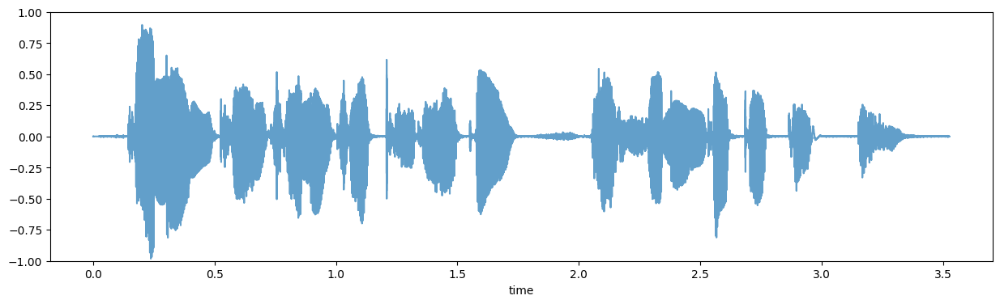

In [ ]:
sr, y = scipy.io.wavfile.read(audio_filename)

plt.figure(figsize=(15,4))
t = np.arange(len(y)) / sr
max_value = 32767  # 16-bit integer PCM
plt.plot(t, y[:,0]/max_value,alpha=0.7)
plt.ylim([-1,1])
plt.xlabel('time')
plt.savefig('waveform.png')

librosa.display.waveshow()

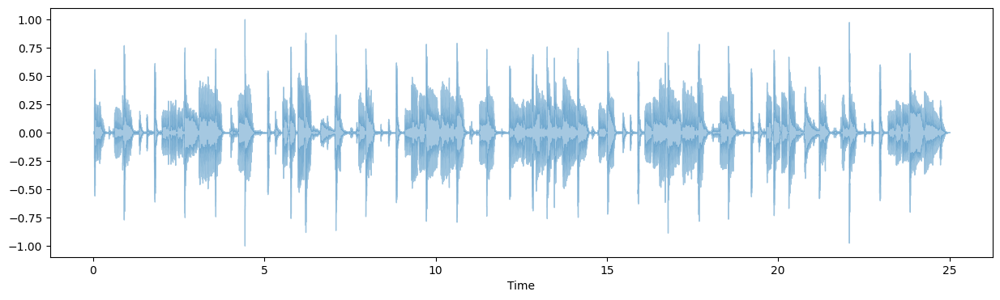

In [ ]:
audio_filename = librosa.ex('choice') # choice: Admiral Bob - Choice, A short drum and bass loop.
y, sr = librosa.load(audio_filename,sr=22050)
y = librosa.effects.trim(y)[0]
y = librosa.util.normalize(y)  # 입력되는 y값은 -1~1사이 값이어야 한다. default norm=inf
plt.figure(figsize=(15,4))
librosa.display.waveshow(y,sr=sr, alpha=0.4)  # waveplot(하위버전) -> waveshow
plt.savefig('waveshow.png')

In [ ]:
ipd.Audio(y,rate=sr)

In [ ]:
audio_filename = 'doremi-c4.wav'  # 16-bit
y, sr = librosa.load(audio_filename,sr=22050)
yt = librosa.effects.trim(y)[0]   # 오디오의 앞, 뒤 침묵 구간을 잘라낸다
y.shape, yt.shape  # 길이가 줄었다.

((280099,), (279552,))

## 9.1.3 Discrete Fourier Transform

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

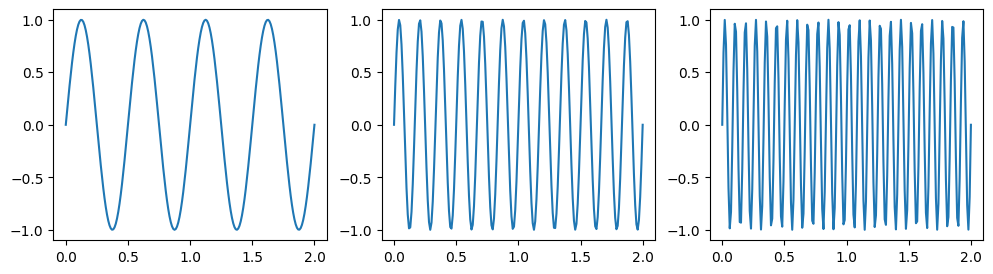

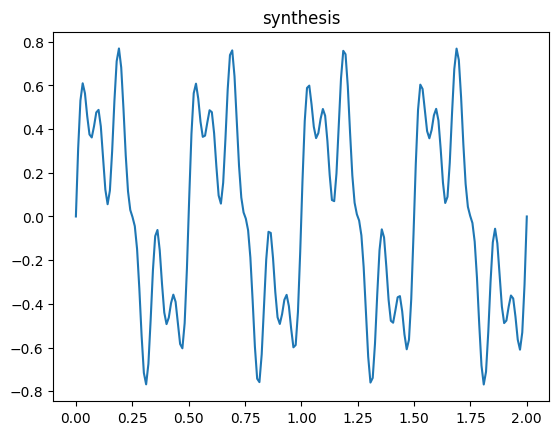

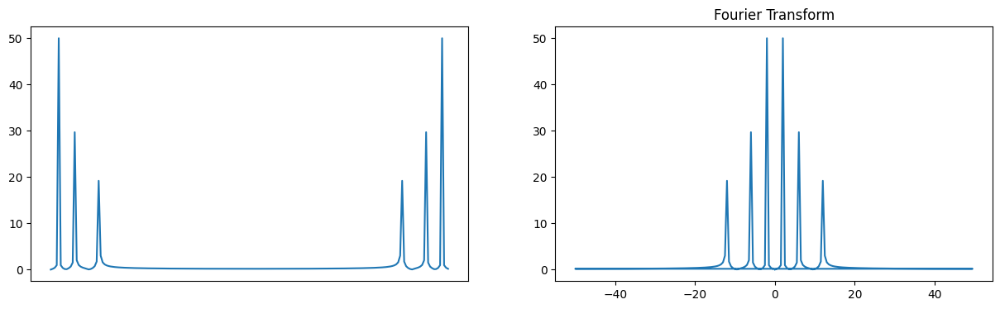

In [ ]:
N = 200
T_max = 2.0
x = np.linspace(0.0, T_max, N)
y1 = np.sin(2*2.0*np.pi*x)
y2 = np.sin(6*2.0*np.pi*x)
y3 = np.sin(12*2.0*np.pi*x)

plt.figure(figsize=(12,3))
plt.subplot(1,3,1)
plt.plot(x,y1)

plt.subplot(1,3,2)
plt.plot(x,y2)

plt.subplot(1,3,3)
plt.plot(x,y3)
plt.show()
############
y = 0.5*y1 + 0.3*y2 + 0.2*y3
plt.plot(x,y)
plt.title('synthesis')
plt.show()
############
yf = np.fft.fft(y)
plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
plt.plot(np.abs(yf))
plt.xticks([])
plt.subplot(1,2,2)
freq = np.fft.fftfreq(N,T_max/N) # (N,)
plt.plot(freq,np.abs(yf))
plt.title('Fourier Transform')
plt.savefig('x.png')
plt.show()

In [ ]:
from matplotlib.ticker import AutoMinorLocator

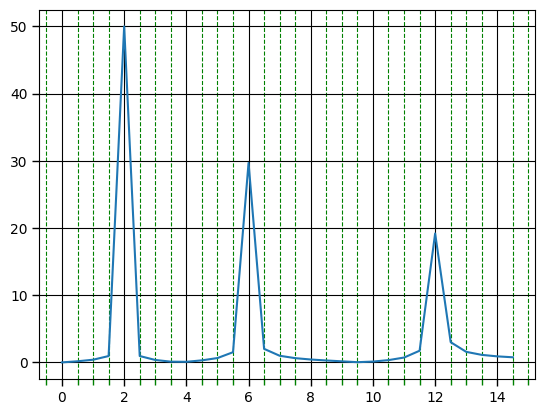

In [ ]:
yf = np.fft.rfft(y)
freq = np.fft.rfftfreq(N,T_max/N) # (N//2+1,) --> [0,...,sr/2]
fig, ax = plt.subplots()
ax.plot(freq[:30], np.abs(yf)[:30])
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which='both', width=1)
ax.tick_params(which='major', length=5)
ax.tick_params(which='minor', length=4, color='g')
ax.grid(visible=True, which='major', color='k', linestyle='-')
ax.grid(visible=True, which='minor', color='g', linestyle='--')
plt.savefig('yy.png')
plt.show()

## 9.1.4 Short Time Fourier Transform
- STFT의 결과를 Spectrogram이라 부른다.
- $(\frac{n\_fft}{2}+1,int(\frac{T}{hop\_length})+1)$

In [ ]:
import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt

In [ ]:
audio_filename= 'LJ001-0001.wav' # 'doremi-c4.wav', 'LJ001-0001.wav'
sr = 22050
y, sr = librosa.load(audio_filename,sr=sr, mono=True)
n_fft = 512; hop_length=128
#n_fft = 2048; hop_length=512

stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
# t = len(y)/( sr *  stft.shape[1]) * np.arange(stft.shape[1])
t = librosa.frames_to_time(np.arange(stft.shape[1]),hop_length=hop_length,sr=sr,n_fft=n_fft)
stft.shape

(257, 1664)

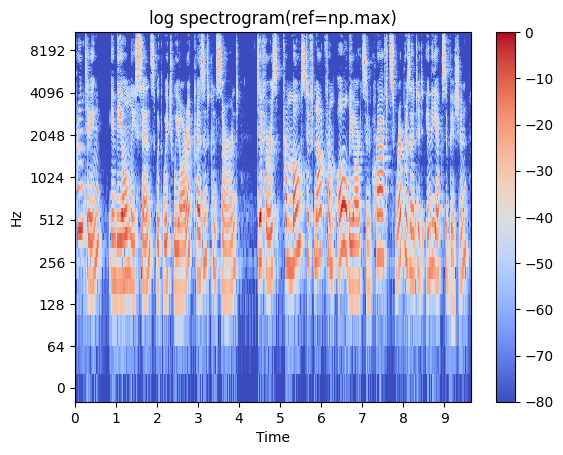

In [ ]:
power = 2 # 1 or 2
mag_spectrogram = librosa.magphase(stft,power=power)[0]  # (magnitude,phsase)[0]
if power==1:
    log_spectrogram = librosa.amplitude_to_db(mag_spectrogram,ref=np.max)
else:
    log_spectrogram = librosa.power_to_db(mag_spectrogram,ref=np.max)
librosa.display.specshow(log_spectrogram,y_axis='log',x_axis='time',sr=sr,hop_length=hop_length,cmap = 'coolwarm')
plt.colorbar()
plt.title('log spectrogram(ref=np.max)')
plt.savefig('stft.png')
plt.show()

plt.pcolormesh()로 그려볼 수 있다.

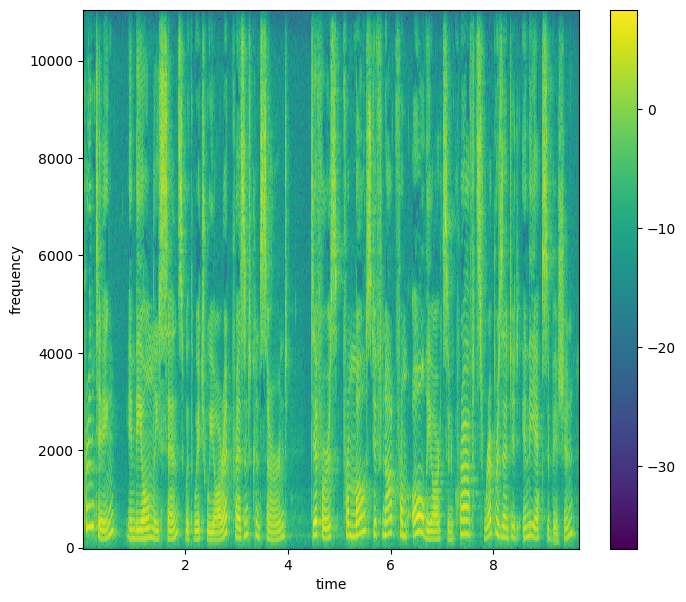

In [ ]:
plt.figure(figsize=(8,7))
plt.pcolormesh(t, freqs, np.log(np.abs(stft)**2))
plt.xlabel('time')
plt.ylabel('frequency')
plt.colorbar()
plt.savefig('stft.png')

## 9.1.5 Hann Window, Hamming Window

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

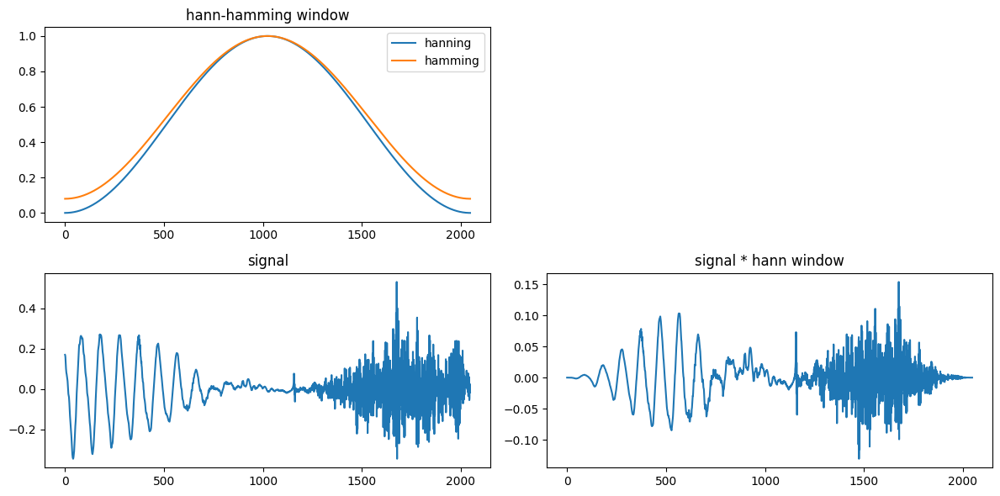

In [ ]:
audio_filename = 'kss_1_0000.wav'
y, sr = librosa.load(audio_filename,sr=22050, mono=True) # sr=22050(default), mono=True(default)

win_length = 2048
window = y[15000:15000+win_length]
hann_window = np.hanning(win_length)
hamming_window = np.hamming(win_length)
plt.figure(figsize=(12,6))

plt.subplot(2,2,1)
plt.plot(hann_window,label='hanning')
plt.plot(hamming_window,label='hamming')
plt.legend()
plt.title('hann-hamming window')

plt.subplot(2,2,3)
plt.plot(window)
plt.title('signal')

plt.subplot(2,2,4)
plt.plot(window*hann_window)
plt.title('signal * hann window')

plt.tight_layout()
plt.savefig('hann_window.png')

## 9.1.6 Mel Spectrogram

In [ ]:
import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import tensorflow as tf

### Mel Filter Bank

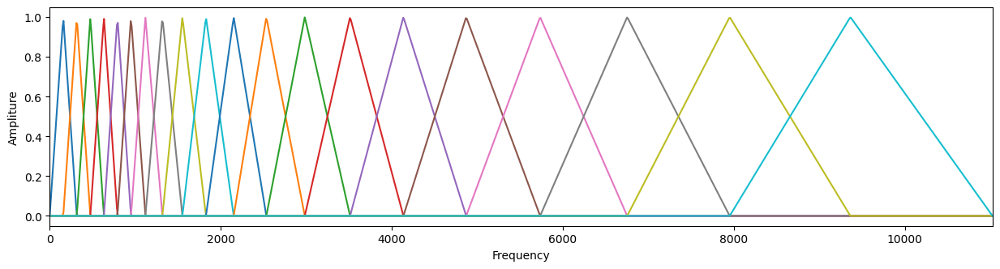

In [ ]:
sample_rate = 22050
n_mels = 20 # n_mels
n_fft = 2048
mel_filter = librosa.filters.mel(n_fft=n_fft, sr=sample_rate, n_mels=n_mels,norm=None,htk=False) # default norm=1(staney), (n_mels,n_fft/2+1)
x_coords = librosa.fft_frequencies(sr=sample_rate, n_fft=n_fft)
plt.figure(figsize=(15,3.5))
plt.plot(x_coords,mel_filter.T)

plt.xlim(0,sample_rate/2)
plt.xlabel('Frequency')
plt.ylabel('Ampliture')
plt.savefig('mel_filter_bank.png')

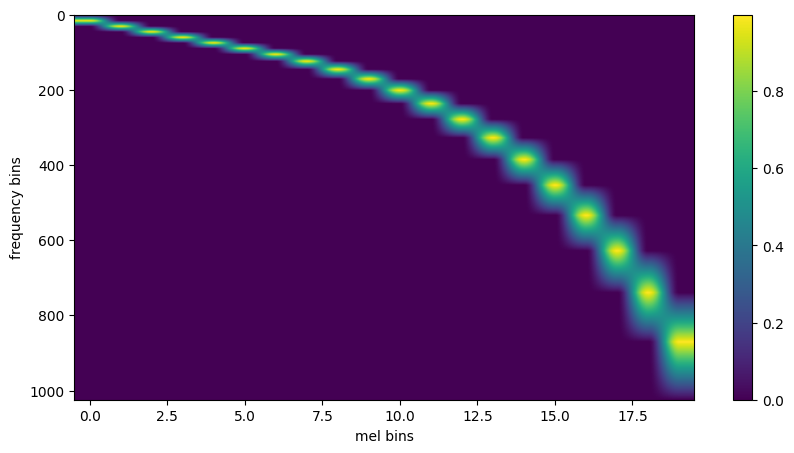

In [ ]:
plt.figure(figsize=(10,5))
plt.imshow(mel_filter.T,aspect='auto')
plt.xlabel('mel bins')
plt.ylabel('frequency bins')
plt.colorbar()

(0.0, 1000.0)

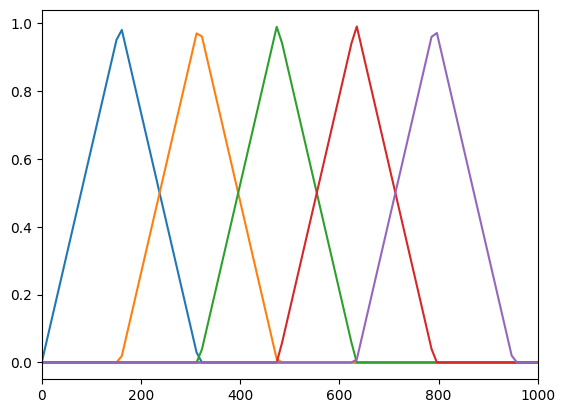

In [ ]:
plt.plot(x_coords,mel_filter[:5].T)
plt.xlim(0,1000)

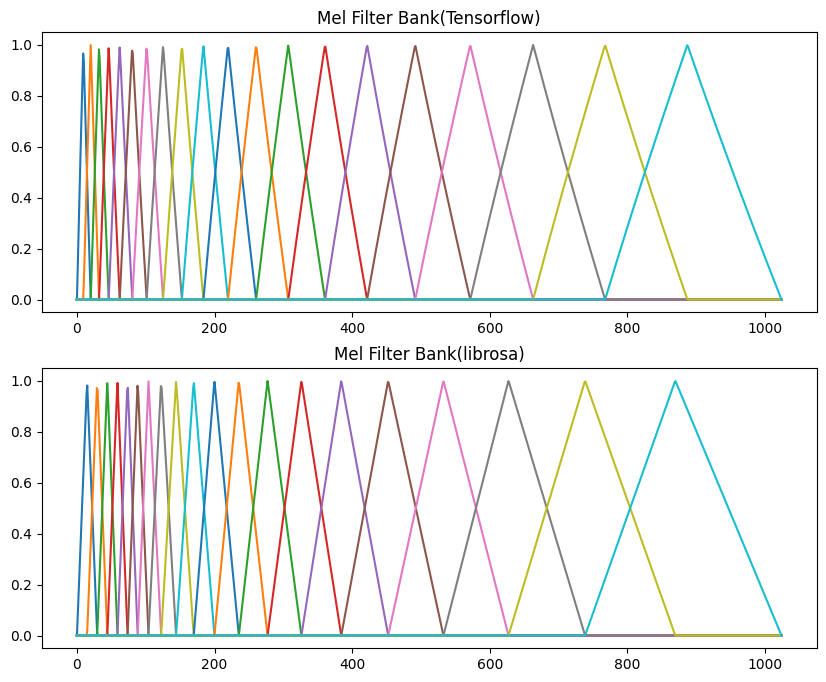

In [ ]:
# Tensorflow, libroas API값과 비교.
sample_rate = 22050
nfilt = 20 # n_mels
n_fft = 2048

num_spectrogram_bins = n_fft//2 + 1
lower_edge_hertz = 0
upper_edge_hertz = sample_rate/2  # 가장 높은 값
mel_filter = tf.signal.linear_to_mel_weight_matrix(num_mel_bins=nfilt, num_spectrogram_bins=num_spectrogram_bins,
                    sample_rate=sample_rate,lower_edge_hertz=lower_edge_hertz,upper_edge_hertz = upper_edge_hertz)

plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
mel_filter = mel_filter.numpy() # (n_fft/2+1, nfilt)
plt.plot(mel_filter)

plt.title('Mel Filter Bank(Tensorflow)')

mel_filter2 = librosa.filters.mel(n_fft=n_fft, sr=22050, n_mels=nfilt,norm=None) # default norm=1(staney)
plt.subplot(2,1,2)
plt.plot(mel_filter2.T) # (nfilt, n_fft/2+1) --> (n_fft/2+1, nfilt)

plt.title('Mel Filter Bank(librosa)')
plt.show()

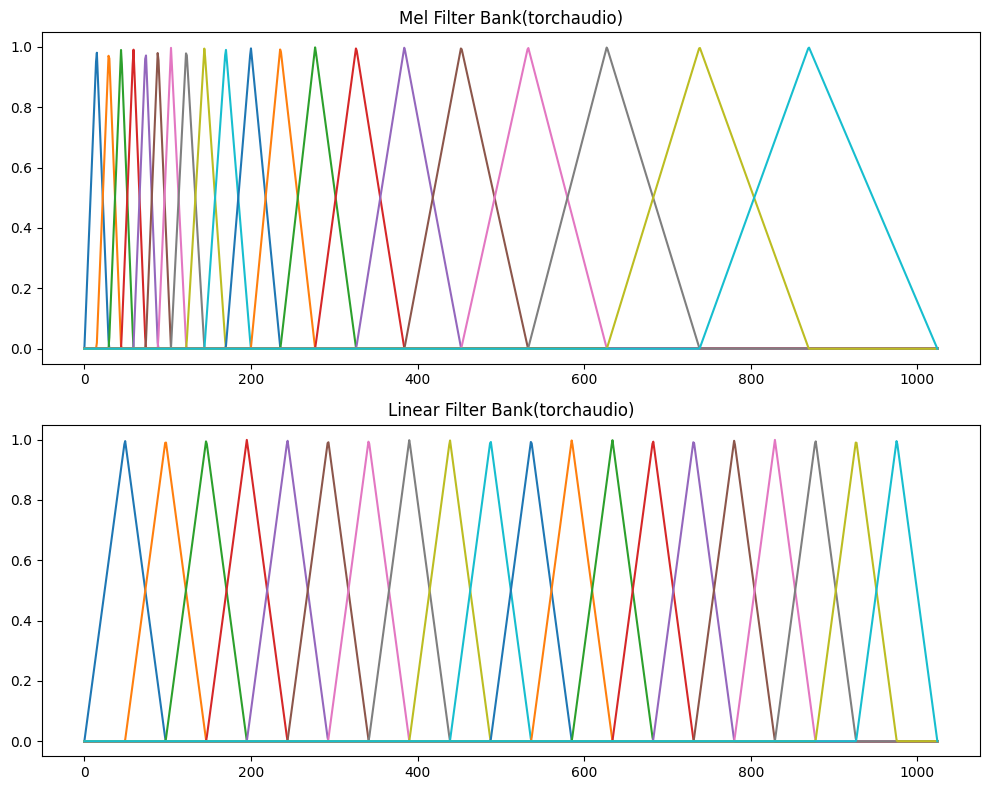

In [ ]:
import torchaudio.functional as F

sample_rate = 22050; nfilt = 20; n_fft = 2048

mel_filter3 = F.melscale_fbanks(
    n_freqs=int(n_fft // 2 + 1),
    n_mels=nfilt,
    f_min=0.0,
    f_max=sample_rate / 2.0,
    sample_rate=sample_rate,
    norm=None, # "slaney"
    mel_scale = 'slaney'  # default = 'htk'
)

linear_filter = F.linear_fbanks(
    n_freqs=int(n_fft // 2 + 1),
    f_min=0.0,
    f_max=sample_rate / 2.0,
    n_filter=nfilt,
    sample_rate=sample_rate,
)

plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
plt.plot(mel_filter3.numpy())
plt.title('Mel Filter Bank(torchaudio)')

plt.subplot(2,1,2)
plt.plot(linear_filter.numpy())
plt.title('Linear Filter Bank(torchaudio)')

plt.tight_layout()
plt.savefig('torchaudio-filter-bank.png')
plt.show()

### Mel Spectrogram

In [ ]:
# melspectrogram를 한번에 구하는 것과, mel filter bank를 거쳐서 구한 것의 결과가 동일하다.

n_mels = 90; hop_length = 256; n_fft = 1024
power = 1  # 1 or 2

audio_filename= 'doremi-c4.wav' # 'doremi-c4.wav', 'LJ001-0001.wav'

y, sr = librosa.load(audio_filename)
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels,power=power) # (n_mels,n_frames)

# mel basis를 계산하여 행렬곱으로 계산
stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)  # (n_fft//2+1,n_frames)
filter_banks = librosa.filters.mel(n_fft=n_fft, sr=sr, n_mels=n_mels)  # mel bais
mag_spectrogram = librosa.magphase(stft,power=power)[0]  # (magnitude,phase)[0]
mel_spectrogram2 = np.matmul(filter_banks,mag_spectrogram)  # (n_mels,n_frames)

# spectrogram을 넘겨 구하기
mel_spectrogram3 = librosa.feature.melspectrogram(S=mag_spectrogram, sr=sr, n_mels=n_mels)  # power는 S에 이미 반영되어 있다.

print(np.allclose(mel_spectrogram,mel_spectrogram2))  # True
print(np.allclose(mel_spectrogram,mel_spectrogram3))  # True

True
True


In [ ]:
def plot_spectrogram(wav_filename,sr=22050,n_fft=2048,hop_length=512,power=2,n_mels=90,ref=1):
    cmap = 'coolwarm'
    y, sr = librosa.load(wav_filename,sr=sr)

    print(f'waveform max: {np.max(y)}, min: {np.min(y)}')
    stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    mag_spectrogram = librosa.magphase(stft,power=power)[0]  # (magnitude,phsase)[0]

    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft,hop_length=hop_length, n_mels=n_mels,power=power)
    if power ==1:
        log_spectrogram = librosa.amplitude_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.amplitude_to_db(mel_spectrogram,ref=ref)
    else:
        log_spectrogram = librosa.power_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=ref)

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)

    y_coords = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    librosa.display.specshow(log_spectrogram,y_axis='log',x_axis='time',cmap=cmap,sr=sr, hop_length=hop_length,y_coords=y_coords)
    plt.title('log spectrogram')
    plt.colorbar()

    plt.subplot(1,2,2)
    librosa.display.specshow(log_mel_spectrogram,y_axis='mel',x_axis='time',cmap=cmap,sr=sr, hop_length=hop_length)
    plt.title('log mel spectrogram')
    plt.colorbar()
    plt.savefig('spectrogram.png')
    plt.show()

def get_log_spectrogram(wav_filename,sr=22050,n_fft=2048,hop_length=512,power=2,n_mels=90,ref=1):
    y, sr = librosa.load(wav_filename,sr=sr)

    stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    mag_spectrogram = librosa.magphase(stft,power=power)[0]  # (magnitude,phsase)[0]
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft,hop_length=hop_length, n_mels=n_mels,power=power)
    if power==1:
        log_spectrogram = librosa.amplitude_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.amplitude_to_db(mel_spectrogram,ref=ref)
    else:
        log_spectrogram = librosa.power_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=ref)
    y_coords = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    return log_spectrogram, log_mel_spectrogram, y_coords

waveform max: 0.35559558868408203, min: -0.37025338411331177


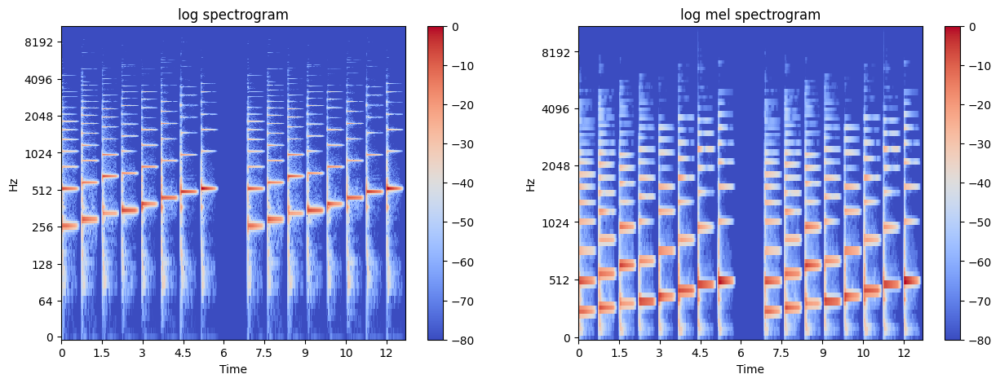

In [ ]:
plot_spectrogram('doremi-c4.wav',sr=22050,n_fft=2048,hop_length=512,power=2,n_mels=90,ref=np.max)

waveform max: 0.35559558868408203, min: -0.37025338411331177


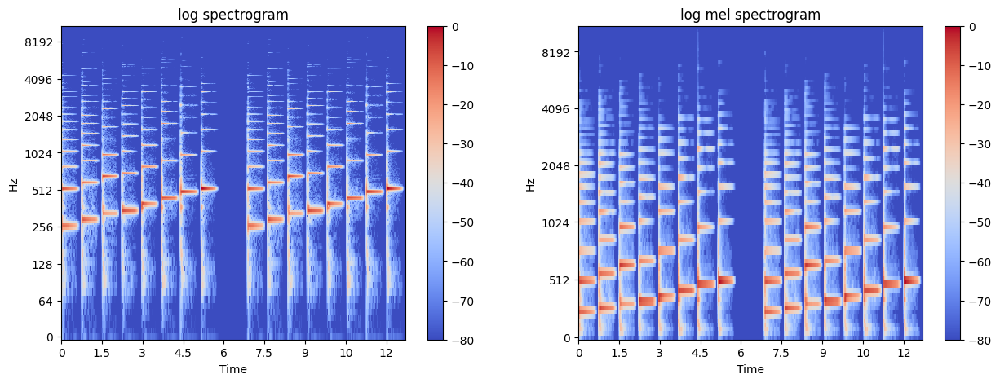

In [ ]:
plot_spectrogram('doremi-c4.wav',sr=22050,n_fft=2048,hop_length=512,power=1,n_mels=90,ref=np.max)

waveform max: 0.9997910261154175, min: -1.0019937753677368


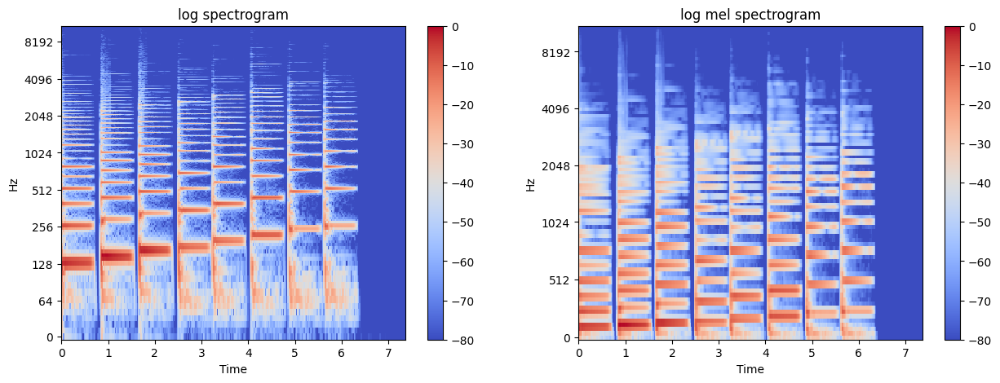

In [ ]:
plot_spectrogram('doremi-c3.wav',sr=22050,n_fft=2048,hop_length=512,power=2,n_mels=90,ref=np.max)

waveform max: 0.86492919921875, min: -0.67919921875


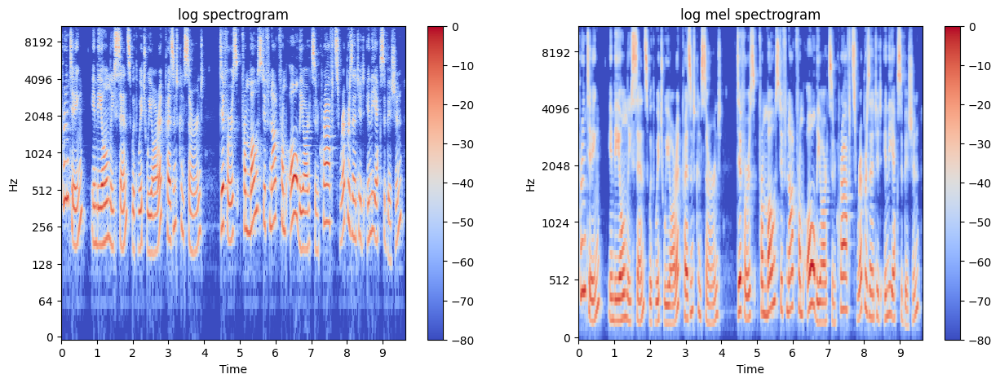

In [ ]:
plot_spectrogram('LJ001-0001.wav',sr=22050,n_fft=2048,hop_length=512,power=2,n_mels=90,ref=np.max)

waveform max: 0.8859750628471375, min: -0.98103266954422


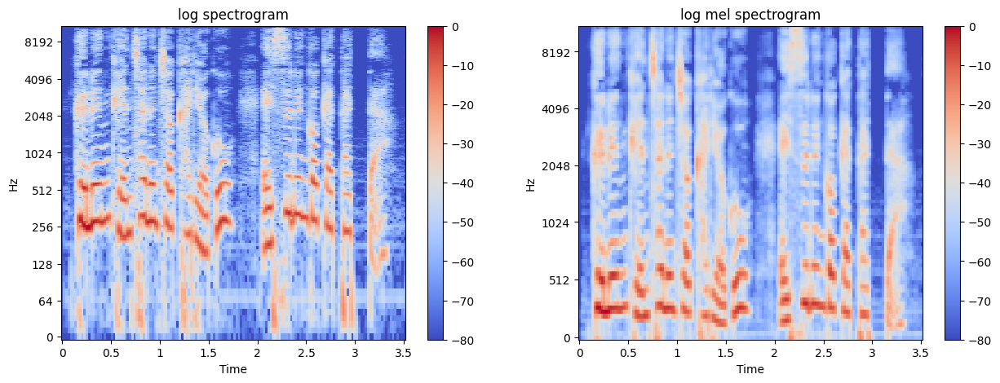

In [ ]:
plot_spectrogram('kss_1_0000.wav',sr=22050,n_fft=2048,hop_length=512,power=2,n_mels=90,ref=np.max)

## 9.1.7 Fundamental Frequency

In [ ]:
import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt
import tensorflow as tf

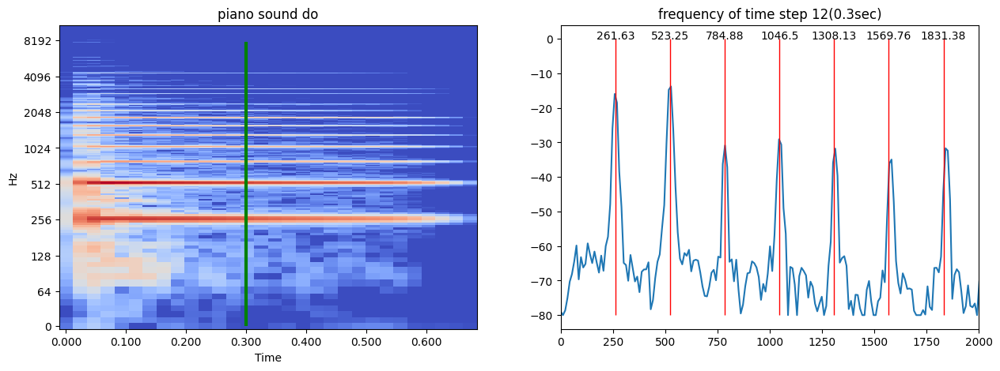

In [ ]:
sr=22050; n_fft=2048; hop_length=512;
log_spectrogram, log_mel_spectrogram, y_coords = get_log_spectrogram('doremi-c4.wav',sr=sr,n_fft=n_fft,hop_length=hop_length,power=2,n_mels=90,ref=np.max)

max_time = 0.7; target_time = 0.3
max_time_index = int(max_time*sr/hop_length)
target_time_index = int(target_time*sr/hop_length)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
librosa.display.specshow(log_spectrogram[:,:max_time_index],y_axis='log',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length,y_coords=y_coords)
plt.vlines(target_time, 0, 8000, color='g', linestyle='solid', linewidth=3)
plt.title('piano sound do')
plt.subplot(1,2,2)
plt.plot(y_coords,log_spectrogram[:,target_time_index])
c4 = 261.626  # C4의 주파수
for i in range(7):
    plt.vlines(c4*(i+1), -80, 0, color='r', linestyle='solid', linewidth=1)
    plt.text(c4*(i+1),0,str(round(c4*(i+1),2)),horizontalalignment='center')
plt.xlim(0,2000)
plt.title(f'frequency of time step {target_time_index}({target_time}sec)')
plt.savefig('harmonic.png')
plt.show()

### librosa fundamental frequency
- librosa.pyin()

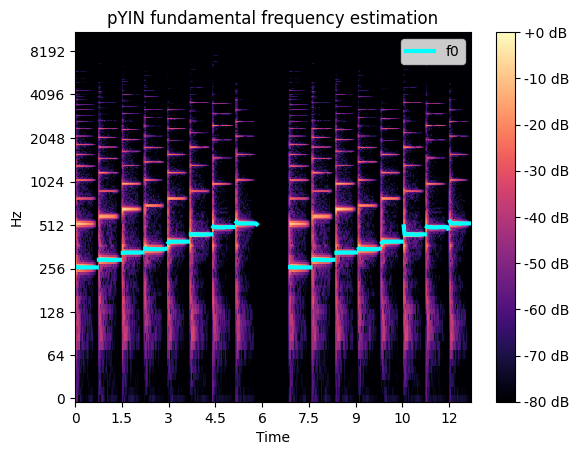

In [ ]:
y, sr = librosa.load('doremi-c4.wav')  # kss_1_0000.wav, doremi.wav, son.wav, train-effect.wav
f0, voiced_flag, voiced_probs = librosa.pyin(y,fmin=librosa.note_to_hz('C2'),fmax=librosa.note_to_hz('C7'))
times = librosa.times_like(f0)

D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
fig, ax = plt.subplots()
img = librosa.display.specshow(D, x_axis='time', y_axis='log', ax=ax)
ax.set(title='pYIN fundamental frequency estimation')
fig.colorbar(img, ax=ax, format="%+2.f dB")
ax.plot(times, f0, label='f0', color='cyan', linewidth=3)
ax.legend(loc='upper right')
plt.savefig('librosa-pyin.png')

## fundamental frequency(음성)

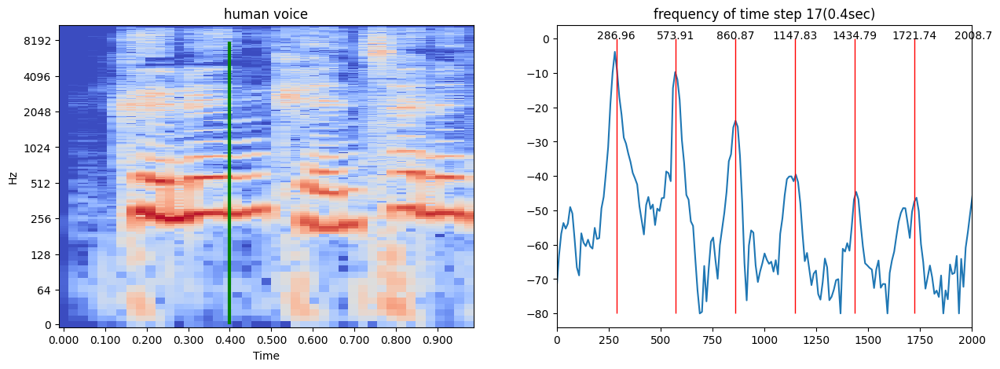

In [ ]:
audio_filename= 'kss_1_0000.wav'
sr=22050; n_fft=2048; hop_length=512;
y, sr = librosa.load(audio_filename)
log_spectrogram, log_mel_spectrogram, y_coords = get_log_spectrogram(audio_filename,sr=sr,n_fft=n_fft,hop_length=hop_length,power=2,n_mels=90,ref=np.max)
fundamental_frequency, voiced_flag, _ = librosa.pyin(y,sr=sr, frame_length=n_fft, fmin=librosa.note_to_hz('C2'),fmax=librosa.note_to_hz('C7'))


max_time = 1; target_time = 0.4
max_time_index = int(max_time*sr/hop_length)
target_time_index = int(target_time*sr/hop_length)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
librosa.display.specshow(log_spectrogram[:,:max_time_index],y_axis='log',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length,y_coords=y_coords)
plt.vlines(target_time, 0, 8000, color='g', linestyle='solid', linewidth=3)
plt.title('human voice')

if voiced_flag[target_time_index]:
    plt.subplot(1,2,2)
    plt.plot(y_coords,log_spectrogram[:,target_time_index])
    f0 = fundamental_frequency[target_time_index]
    for i in range(7):
        plt.vlines(f0*(i+1), -80, 0, color='r', linestyle='solid', linewidth=1)
        plt.text(f0*(i+1),0,str(round(f0*(i+1),2)),horizontalalignment='center')
    plt.xlim(0,2000)
    plt.title(f'frequency of time step {target_time_index}({target_time}sec)')
    plt.savefig('human-harmonic.png')
    plt.show()
else:
    print(f'human voice not detected at target time {target_time}.')

## 9.1.8 MFCC

In [ ]:
from scipy.fftpack import dct

In [ ]:
y, sr = librosa.load('LJ001-0001.wav')

n_mfcc = 20

mfcc = librosa.feature.mfcc(y=y,sr=sr,n_mfcc=n_mfcc) # hop_length=512,n_fft=2048, n_mels(default=128) ~크기로 생성후, 앞쪽 return~
mfcc_ = librosa.feature.mfcc(y=y,sr=sr,n_mfcc=80,hop_length=512,n_fft=2048)     # n_mels(default=128) ~크기로 생성후, 앞쪽 80개 return~

mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr) # default: n_fft=2048, hop_length=512, n_mels=128, power=2
print(f'mel spectrogram: {mel_spectrogram.shape}')
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

mfcc2 = librosa.feature.mfcc(S=log_mel_spectrogram,sr=sr,n_mfcc=n_mfcc)  # output shape, min(n_mels, n_mfcc)

print(mfcc.shape,mfcc2.shape)
print("2가지 mfcc 결과 비교: ", np.allclose(mfcc,mfcc2))   # True

mfcc3 = dct(log_mel_spectrogram, type=2, axis=0, norm='ortho')[:n_mfcc, :]
print(mfcc3.shape)
print("직접 구한 결과와 비교: ", np.allclose(mfcc,mfcc3))   # True

mel spectrogram: (128, 416)
(20, 416) (20, 416)
2가지 mfcc 결과 비교:  True
(20, 416)
직접 구한 결과와 비교:  True


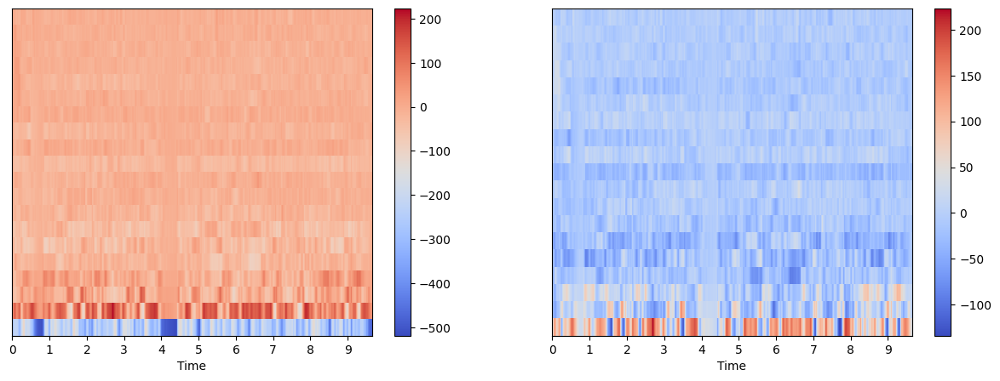

In [ ]:
y, sr = librosa.load('LJ001-0001.wav')

hop_length=512;
n_mfcc = 20

mfcc = librosa.feature.mfcc(y=y,n_mfcc=n_mfcc) # hop_length=512,n_fft=2048, n_mels(default=128) 크기로 생성후, 앞쪽 return

plt.figure(figsize=(15,5))
plt.subplot(121)
librosa.display.specshow(mfcc,x_axis='time',cmap='coolwarm')
plt.colorbar()

plt.subplot(122)
librosa.display.specshow(mfcc[1:],x_axis='time',cmap='coolwarm')
plt.colorbar()

plt.savefig('mfcc.png')

### STFT, Mel-Spectrogram, MFCC 순차적으로 구하기
- stft -> mag_spectrogram -> mel_spectrogram -> mfcc
- 하지만, 처리 속도에는 별 효과가 없다

In [ ]:
# get_spectrogram() <---- filter_banks를 구해서 직접 곱하는 방식으로 mel-spectrogram을 구한다.  <--- 더 빠르다.
# get_spectrogram2() <----- librosa.feature.melspectrogram() API를 이용하는 방식


def get_spectrogram(wav_filename,sr=22050,n_fft=2048,win_length=None,hop_length=512,power=2,n_mels=90,n_mfcc=40,ref=1,plot_flag=False,filter_banks=None):
    if win_length is None:
        win_length = n_fft
    y, sr = librosa.load(wav_filename,sr=sr)
    stft = librosa.stft(y, n_fft=n_fft,win_length=win_length, hop_length=hop_length)  # (n_fft//2+1,n_frames)
    mag_spectrogram = librosa.magphase(stft,power=power)[0]  # (magnitude,phase)[0]

    if filter_banks is None:
        filter_banks = librosa.filters.mel(n_fft=n_fft, sr=sr, n_mels=n_mels)  # mel bais
    mel_spectrogram = np.matmul(filter_banks,mag_spectrogram)  # (n_mels,n_frames)
    #mel_spectrogram = librosa.feature.melspectrogram(S=mag_spectrogram, sr=sr, n_fft=n_fft, n_mels=n_mels)

    if power==1:
        log_spectrogram = librosa.amplitude_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.amplitude_to_db(mel_spectrogram,ref=ref)
    else:
        log_spectrogram = librosa.power_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=ref)
    if n_mels==128 and power==2 and ref==1:  # librosa의 mfcc 내부 파라메터와 일치하는 경우에만.
        mfcc = librosa.feature.mfcc(S=log_mel_spectrogram,sr=sr,n_mfcc=n_mfcc)
    else:
        mfcc = None
    ##############################
    if plot_flag:
        cmap = 'coolwarm'
        plt.figure(figsize=(16,4))
        plt.subplot(1,3,1)
        librosa.display.specshow(log_spectrogram,y_axis='log',x_axis='time',cmap=cmap,sr=sr, hop_length=hop_length)
        plt.title('log spectrogram')
        plt.colorbar()

        plt.subplot(1,3,2)
        librosa.display.specshow(log_mel_spectrogram,y_axis='mel',x_axis='time',cmap=cmap,sr=sr, hop_length=hop_length)
        plt.title('log mel spectrogram')
        plt.colorbar()

        if mfcc is not None:
            plt.subplot(1,3,3)
            librosa.display.specshow(mfcc[1:],x_axis='time',cmap=cmap)
            plt.title('log mel spectrogram')
            plt.colorbar()

    return log_spectrogram, log_mel_spectrogram, mfcc

def get_spectrogram2(wav_filename,sr=22050,n_fft=2048,win_length=None,hop_length=512,power=2,n_mels=90,n_mfcc=40,ref=1):
    if win_length is None:
        win_length = n_fft
    y, sr = librosa.load(wav_filename,sr=sr)
    stft = librosa.stft(y, n_fft=n_fft,win_length=win_length, hop_length=hop_length)  # (n_fft//2+1,n_frames)
    mag_spectrogram = librosa.magphase(stft,power=power)[0]  # (magnitude,phase)[0]

    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft,win_length=win_length, hop_length=hop_length, n_mels=n_mels,power=power)

    if power==1:
        log_spectrogram = librosa.amplitude_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.amplitude_to_db(mel_spectrogram,ref=ref)
    else:
        log_spectrogram = librosa.power_to_db(mag_spectrogram,ref=ref)
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=ref)

    mfcc = librosa.feature.mfcc(y=y,sr=sr,n_mfcc=n_mfcc,hop_length=hop_length,n_fft=n_fft,win_length=win_length)
    return log_spectrogram, log_mel_spectrogram, mfcc

In [ ]:
n_fft=1024; win_length = 1024; sr=22050; n_mels=128
ref = 1; power=2
wav_filename = 'doremi-c4.wav'
filter_banks = librosa.filters.mel(n_fft=n_fft, sr=sr, n_mels=n_mels)

log_spectrogram, log_mel_spectrogram, mfcc = get_spectrogram(wav_filename,n_fft=n_fft,win_length=win_length,
                                                             power=power,ref=ref,n_mels=n_mels,plot_flag=False,filter_banks=filter_banks)
log_spectrogram2, log_mel_spectrogram2, mfcc2 = get_spectrogram2(wav_filename,n_fft=n_fft,win_length=win_length, power=power,ref=ref,n_mels=n_mels)

In [ ]:
print(log_spectrogram.shape, log_mel_spectrogram.shape, mfcc.shape)
print(log_spectrogram2.shape, log_mel_spectrogram2.shape, mfcc2.shape)

(513, 548) (128, 548) (40, 548)
(513, 548) (128, 548) (40, 548)


In [ ]:
np.allclose(log_spectrogram,log_spectrogram2), np.allclose(log_mel_spectrogram,log_mel_spectrogram2), np.allclose(mfcc,mfcc2)

(True, True, True)

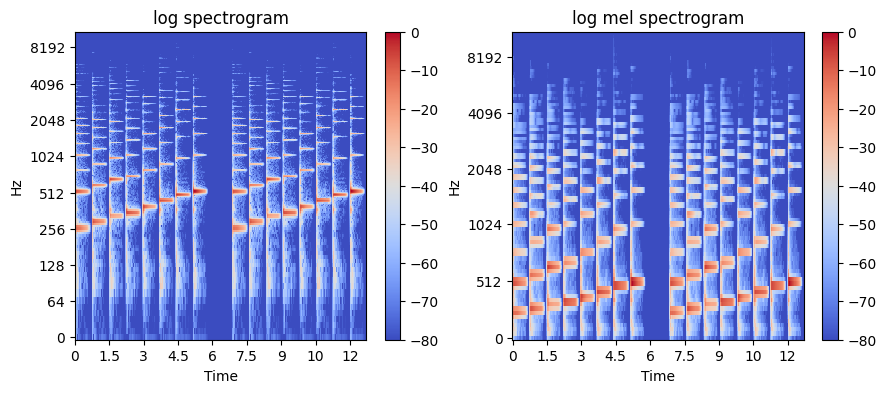

In [ ]:
log_spectrogram, log_mel_spectrogram, _ = get_spectrogram('doremi-c4.wav',power=2,ref=np.max,n_mels=90,plot_flag=True)

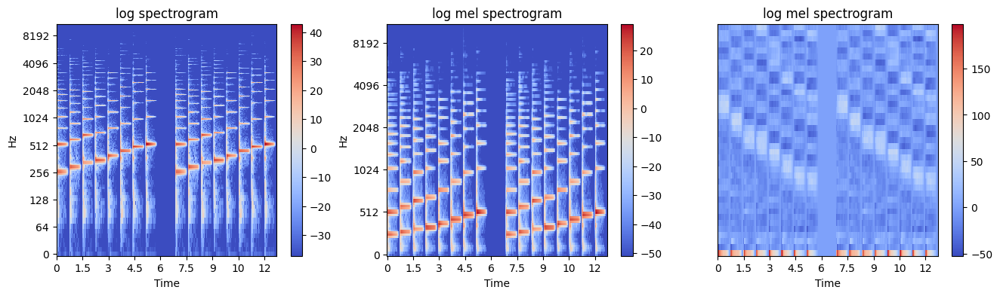

In [ ]:
log_spectrogram, log_mel_spectrogram, mfcc = get_spectrogram('doremi-c4.wav',power=2,ref=1,n_mels=128,plot_flag=True)

In [ ]:
# 속도 테스트
import time
n_fft=1024; win_length = 1024; sr=22050; n_mels=128
ref = 1; power=2
wav_filename = 'doremi-c4.wav'
filter_banks = librosa.filters.mel(n_fft=n_fft, sr=sr, n_mels=n_mels)

s_time = time.time()
for i in range(100):
    log_spectrogram, log_mel_spectrogram, mfcc = get_spectrogram(wav_filename,n_fft=n_fft,win_length=win_length,
                                                             power=power,ref=ref,n_mels=n_mels,plot_flag=False,filter_banks=filter_banks)
print(f'elapsed: {time.time()-s_time} sec')

s_time = time.time()
for i in range(100):
    log_spectrogram2, log_mel_spectrogram2, mfcc2 = get_spectrogram2(wav_filename,n_fft=n_fft,win_length=win_length, power=power,ref=ref,n_mels=n_mels)
print(f'elapsed: {time.time()-s_time} sec')

elapsed: 7.774888277053833 sec
elapsed: 12.800379514694214 sec


## 9.1.9 Formant

In [ ]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

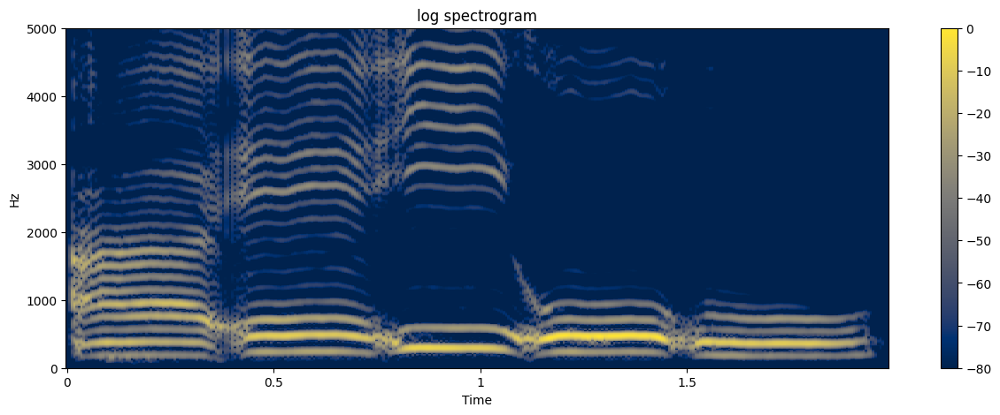

In [ ]:
y,sr = librosa.load('aeiou-kor-female.wav')
n_fft = 2048; win_length = 512; hop_length = 128

stft = librosa.stft(y,n_fft=n_fft,win_length=win_length,hop_length=hop_length)

mag_spectrogram = librosa.magphase(stft,power=2)[0]
log_spectrogram = librosa.amplitude_to_db(mag_spectrogram,ref=np.max)

plt.figure(figsize=(15, 5))
y_coords = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
librosa.display.specshow(log_spectrogram,y_axis='linear',x_axis='time',sr=sr,hop_length=hop_length,y_coords=y_coords,cmap='cividis')
plt.title('log spectrogram')
plt.colorbar()
plt.ylim((0,5000))
plt.savefig('aeiou-log-spectrogram')

F1, F2 직접 구해보기
- 책에 없는 내용으로 건너뛰어도 무방하다.

In [ ]:
# https://stackoverflow.com/questions/61519826/how-to-decide-filter-order-in-linear-prediction-coefficients-lpc-while-calcu
# https://kr.mathworks.com/help/signal/ug/formant-estimation-with-lpc-coefficients.html

y,sr = librosa.load('aeiou-kor-female.wav',sr=22050)

#for i in range(10):

A = librosa.core.lpc(y[1000:7000], 15)  # n차 다항식의 계수(고차부터)  --> (n+1)개
rts = np.roots(A)
rts = rts[np.imag(rts) >= 0]  # 켤레 복소수 --> 1개만 선택
angz = np.arctan2(np.imag(rts), np.real(rts))
frqs = angz * sr / (2 *  np.pi)
frqs.sort()
print(frqs)

[   0.       823.05524 1683.4128  3292.9673  4490.373   6068.952
 8706.027   9302.609  ]


# 9.2 Audio Feature & Librosa API

다른 API로 Spectrogram 추출

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import scipy

(1025, 412) (1025,) (412,)
(1025,) (412,) (1025, 412)


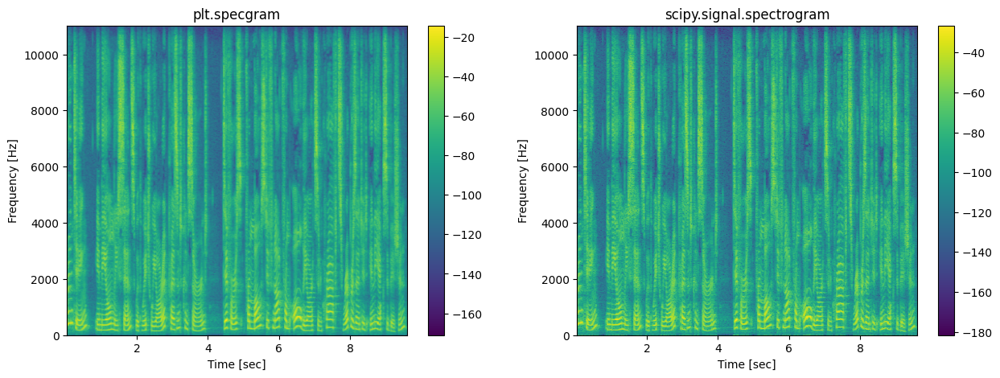

In [ ]:
y, sr = librosa.load('LJ001-0001.wav')
nfft = 2048; hop_length = 512; sr=22050 # sampling rate
plt.figure(figsize=(15,5))
plt.subplot(121)
noverlap = nfft - hop_length
spectrum, freqs, t, im = plt.specgram(y, NFFT=nfft, Fs=sr, Fc=0,noverlap=noverlap, sides='default', mode='magnitude', scale='dB')
plt.colorbar()
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('plt.specgram')

print(spectrum.shape,freqs.shape,t.shape) # (1025, 412) (1025,) (412,)

# nperseg=win_length, noerlap = win_length - hop_size
f, t, spec = scipy.signal.spectrogram(y, fs=sr, window='hann', nperseg=nfft,noverlap=noverlap,mode='magnitude',return_onesided=True)
print(f.shape, t.shape,spec.shape) # (1025,) (412,) (1025, 412)
plt.subplot(122)
plt.pcolormesh(t, f, 20*np.log10(spec))
plt.colorbar()
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('scipy.signal.spectrogram')
plt.savefig('spectrogram-etc.png')
plt.show()

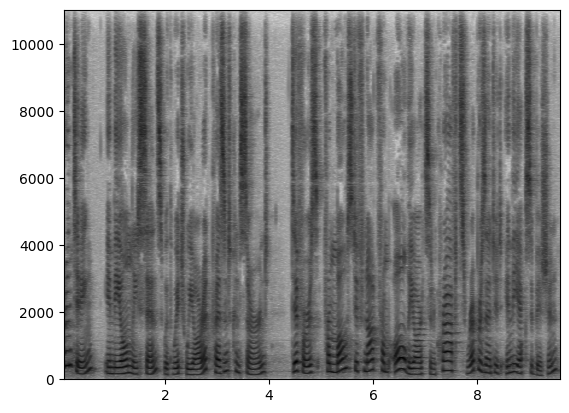

In [ ]:
plt.pcolormesh(t, f, 20*np.log10(spec),cmap='gray_r',shading='gouraud')

## 9.2.1 Time-Domain Audio Features

In [ ]:
import librosa
import librosa.display
import soundfile
import scipy.io.wavfile
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

### Amplitude Envelope

amplitude envelope: (416,)


Text(0.5, 1.0, 'Amplitude Envelope')

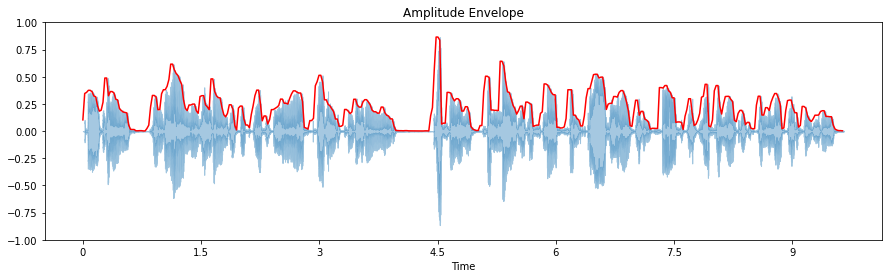

In [ ]:
y, sr = librosa.load('LJ001-0001.wav') # LJ001-0001.wav
win_length=1024; hop_length=512

amplitude_envelope = np.array([max(y[i:i+win_length]) for i in range(0,len(y),hop_length)])
print(f'amplitude envelope: {amplitude_envelope.shape}')
plt.figure(figsize=(15,4))
librosa.display.waveshow(y, sr=22050,alpha=0.4)

t = librosa.frames_to_time(np.arange(len(amplitude_envelope)),hop_length=hop_length,sr=sr)
plt.plot(t,amplitude_envelope,c='r')
plt.ylim((-1, 1))
plt.title('Amplitude Envelope')

### RMS(Root Mean Square) Energy

(416,)


Text(0.5, 1.0, 'RMS Energy')

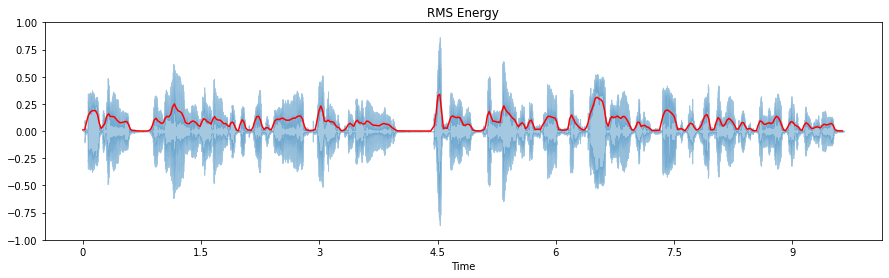

In [ ]:
y, sr = librosa.load('LJ001-0001.wav') # LJ001-0001.wav
win_length=1024; hop_length=512
rms = librosa.feature.rms(y, frame_length=win_length, hop_length=hop_length)[0]
print(rms.shape)

plt.figure(figsize=(15,4))
librosa.display.waveshow(y, sr=22050,alpha=0.4)
t = librosa.frames_to_time(np.arange(len(amplitude_envelope)),hop_length=hop_length,sr=sr)
plt.plot(t,rms,c='r')
plt.ylim((-1, 1))
plt.title('RMS Energy')

### Zero Crossing Rate

[False False  True False  True False  True  True]


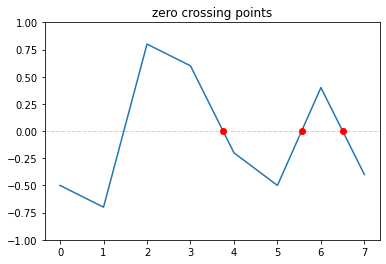

In [ ]:
signal=np.array([-0.5,-0.7,0.8,0.6,-0.2,-0.5,0.4,-0.4])
result = librosa.zero_crossings(signal,pad=False) # zero_crossing_rate()에서 pad=False 사용

#plt.axhline(0, 0, len(signal), color='lightgray', linestyle='--', linewidth=1,zorder=0)
plt.axhline(0, color='lightgray', linestyle='--', linewidth=1,zorder=0)
plt.plot(signal,zorder=1)
k = np.where(result==True)[0]
zeros = [(i-signal[i]/(signal[i]-signal[i-1]),0) for i in k[1:]]
plt.scatter(*zip(*zeros),c='r',zorder=2)
plt.ylim([-1,1])
plt.title('zero crossing points')
plt.savefig('zero_crossings.png')
print(result)

## 9.2.2 Frequency-Domain Audio Features

In [ ]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import scipy

### delta

In [ ]:
y, sr = librosa.load('LJ001-0001.wav')
n_mfcc = 20

mfcc = librosa.feature.mfcc(y=y,n_mfcc=n_mfcc,hop_length=512,n_fft=2048) # hop_length=512,n_fft=2048, n_mels(default=128) ~크기로 생성후, 앞쪽 return~
mfcc_delta = librosa.feature.delta(mfcc, order=1)
mfcc.shape, mfcc_delta.shape  # ((20, 416), (20, 416))

((20, 416), (20, 416))

### Constant Q Transform

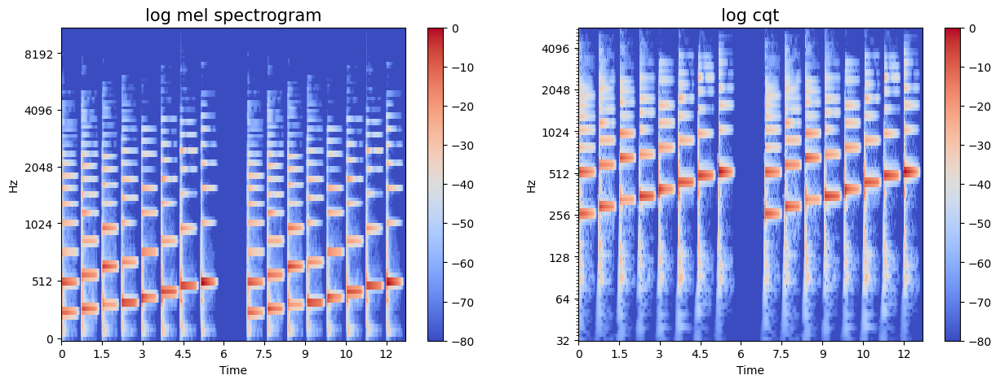

In [ ]:
audio_filename= 'doremi-c4.wav' # 'doremi.wav', 'LJ001-0001.wav'

y, sr = librosa.load(audio_filename)

hop_length=512; n_fft = 2048; n_mels = 90; n_bins = 90

mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels,power=2) # (n_mels,n_frames)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=np.max)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
librosa.display.specshow(log_mel_spectrogram,y_axis='mel',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length)
plt.title('log mel spectrogram',fontsize=15)
plt.colorbar()

cqt = librosa.cqt(y, sr=sr, hop_length=hop_length, n_bins=n_bins)
log_cqt = librosa.amplitude_to_db(np.abs(cqt),ref=np.max)
plt.subplot(1,2,2)
librosa.display.specshow(log_cqt,y_axis='cqt_hz',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length) # n_bins에 따라 y축의 주파수 범위가 달라진다.
plt.title('log cqt',fontsize=15)
plt.colorbar()
plt.savefig('cqt.png')

In [ ]:
log_mel_spectrogram.shape, cqt.shape

((90, 548), (90, 548))

### Croma Shift, Croma CQT

(153088,) 22050
chroma-shift: (12, 300), chroma-cqt: (12, 300)


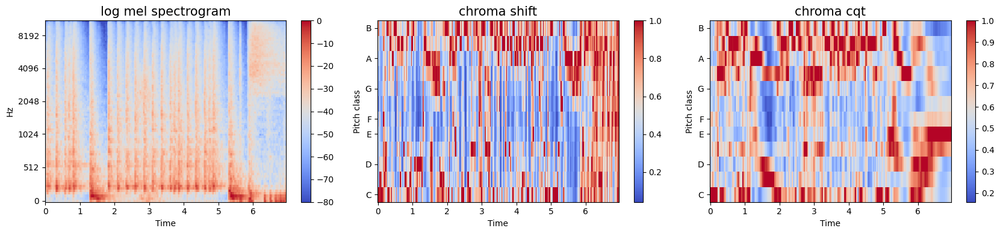

In [ ]:
audio_filename = "doremi-c3-c4.wav"
#audio_filename = "drum-effect.wav"

y, sr = librosa.load(audio_filename)
print(y.shape,sr)
hop_length=512; n_fft = 2048;

chroma_shift = librosa.feature.chroma_stft(y=y,sr=sr,n_chroma=12,n_fft=n_fft, hop_length=hop_length)   # power spectrogram ==> Chromagram
chroma_cqt = librosa.feature.chroma_cqt(y=y,sr=sr,n_chroma=12, hop_length=hop_length)

print(f'chroma-shift: {chroma_shift.shape}, chroma-cqt: {chroma_cqt.shape}')
hop_length=512; n_fft = 2048; n_mels = 90;
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels,power=2) # (n_mels,n_frames)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=np.max)

plt.figure(figsize=(17,4))
plt.subplot(1,3,1)
librosa.display.specshow(log_mel_spectrogram,y_axis='mel',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length)
plt.title('log mel spectrogram',fontsize=15)
plt.colorbar()

plt.subplot(1,3,2)
librosa.display.specshow(chroma_shift,x_axis='time', y_axis="chroma",cmap='coolwarm')
plt.title('chroma shift',fontsize=15)
plt.colorbar()

plt.subplot(1,3,3)
librosa.display.specshow(chroma_cqt,x_axis='time', y_axis="chroma",cmap='coolwarm')
plt.title('chroma cqt',fontsize=15)
plt.colorbar()

plt.tight_layout()
plt.savefig('croma-shift-cqt.png')

### Spectral Centroid
- 가중 평균 주파수

In [ ]:
import sklearn
from sklearn import preprocessing

(152,)


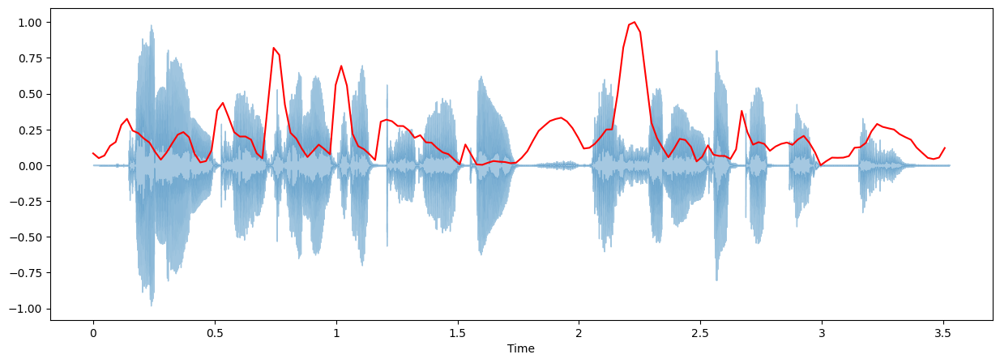

In [ ]:
audio_filename = "kss_1_0000.wav"
y, sr = librosa.load(audio_filename)
n_fft=2048; hop_length=512

# 계산의 안정성을 위해 0.01을 더해 주었다.
centroid = librosa.feature.spectral_centroid(y=y+0.01,sr=sr,n_fft=n_fft, hop_length=hop_length)[0]
print(centroid.shape)  # frame: 97

t = librosa.frames_to_time(range(len(centroid)),hop_length=hop_length,sr=sr)
normed_centroid = sklearn.preprocessing.minmax_scale(centroid, axis=0)

plt.figure(figsize=(15,5))
librosa.display.waveshow(y,sr=sr,alpha=0.4)

plt.plot(t, normed_centroid, color='r')
plt.savefig('spectral-centroid.png')

### Spectral Bandwidth
- 주파수 성분의 분산

(152,)


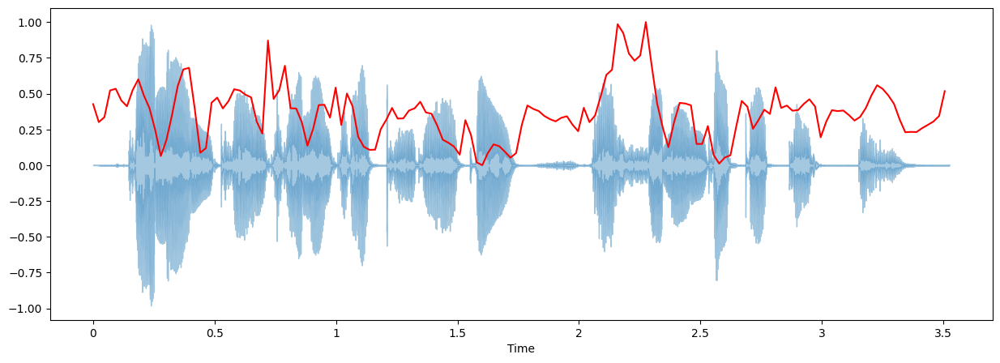

In [ ]:
audio_filename = "kss_1_0000.wav"
y, sr = librosa.load(audio_filename)
n_fft=2048; hop_length=512

# 계산의 안정성을 위해 0.01을 더해 주었다.
bandwidth = librosa.feature.spectral_bandwidth(y=y+0.01,sr=sr,n_fft=n_fft, hop_length=hop_length)[0]
print(bandwidth.shape)  # frame: 97

t = librosa.frames_to_time(range(len(centroid)),hop_length=hop_length,sr=sr)
normed_bandwidth = sklearn.preprocessing.minmax_scale(bandwidth, axis=0)

plt.figure(figsize=(15,5))
librosa.display.waveshow(y,sr=sr,alpha=0.4)

plt.plot(t, normed_bandwidth, color='r')
plt.savefig('spectral-bandwidth.png')

### Rolloff

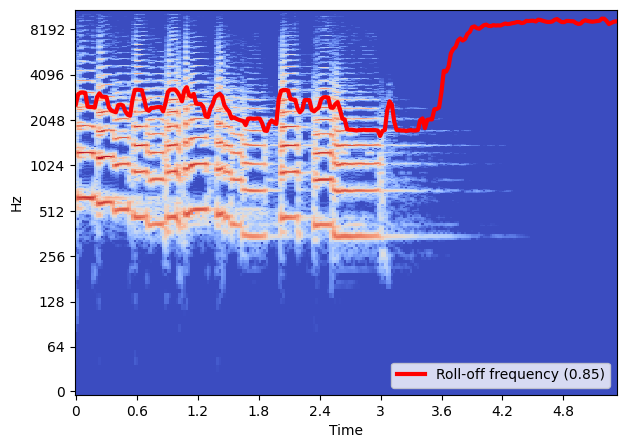

In [ ]:
y, sr = librosa.load(librosa.ex('trumpet'))
n_fft=2048; hop_length=512
rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, roll_percent=0.85)[0]
stft = librosa.stft(y,n_fft=n_fft, hop_length=hop_length)
mag_spectrogram = librosa.magphase(stft,power=1)[0]
plt.figure(figsize=(7,5))
librosa.display.specshow(librosa.amplitude_to_db(mag_spectrogram, ref=np.max), y_axis='log', x_axis='time', sr=sr,cmap='coolwarm')
t = librosa.times_like(rolloff,sr=sr, hop_length=512) # librosa.frames_to_time(np.arange(len(rolloff)),hop_length=hop_length,sr=sr)와 같다.
plt.plot(t, rolloff, label='Roll-off frequency (0.85)', c='r',linewidth=3)
plt.legend(loc='lower right')
plt.savefig('spectrogram-rolloff.png')

### hpss

In [ ]:
audio_filename = "trumpet.wav" # trumpet.wav: librosa.load(librosa.ex('trumpet'), duration=3)

y, sr = librosa.load(audio_filename)
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [ ]:
print(audio_filename)
ipd.display(ipd.Audio(y,rate=sr))
print('harmonic')
ipd.display(ipd.Audio(y_harmonic,rate=sr))
print('percussive')
ipd.display(ipd.Audio(y_percussive,rate=sr))

trumpet.wav


harmonic


percussive


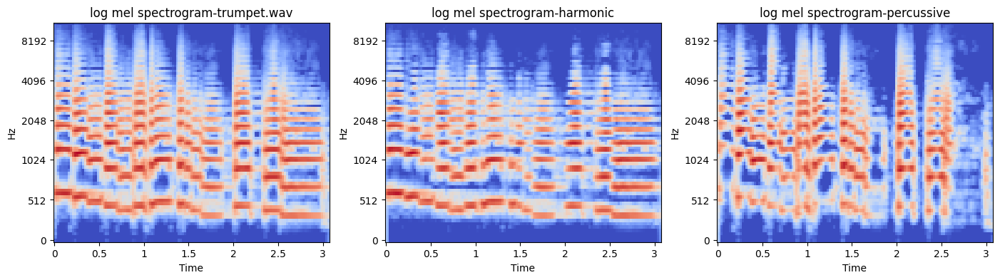

In [ ]:
n_fft=2048; hop_length=512; n_mels = 80

mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels,power=2) # (n_mels,n_frames)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=np.max)

mel_spectrogram_h = librosa.feature.melspectrogram(y=y_harmonic, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels,power=2) # (n_mels,n_frames)
log_mel_spectrogram_h = librosa.power_to_db(mel_spectrogram_h,ref=np.max)

mel_spectrogram_p = librosa.feature.melspectrogram(y=y_percussive, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels,power=2) # (n_mels,n_frames)
log_mel_spectrogram_p = librosa.power_to_db(mel_spectrogram_p,ref=np.max)

plt.figure(figsize=(17,4))
plt.subplot(1,3,1)
librosa.display.specshow(log_mel_spectrogram,y_axis='mel',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length)
plt.title(f'log mel spectrogram-{audio_filename}')

plt.subplot(1,3,2)
librosa.display.specshow(log_mel_spectrogram_h,y_axis='mel',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length)
plt.title('log mel spectrogram-harmonic')

plt.subplot(1,3,3)
librosa.display.specshow(log_mel_spectrogram_p,y_axis='mel',x_axis='time',cmap='coolwarm',sr=sr, hop_length=hop_length)
plt.title('log mel spectrogram-percussive')
plt.savefig('hpss.png')

### beat & tempo
- onset: 음의 시작점
- 박(beat), 박자(meter), 리듬(rhythm): https://www.youtube.com/watch?v=CMaS7cfonjM

tempo: 135.99917763157896, beat_frames shape: (20,)


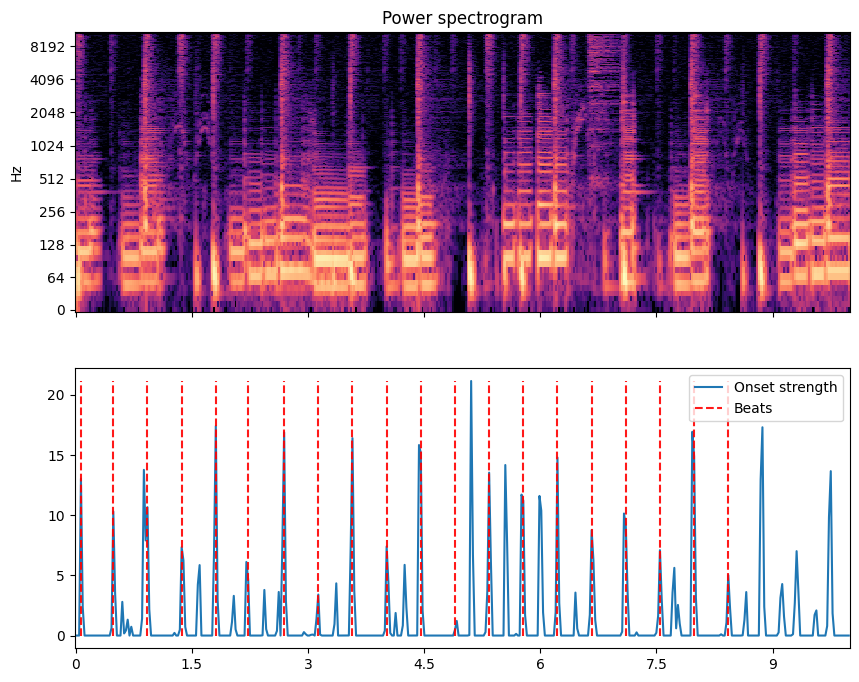

In [ ]:
y, sr = librosa.load(librosa.ex('choice'), duration=10)

o_env = librosa.onset.onset_strength(y=y, sr=sr,aggregate=np.median) # (230,)
times = librosa.times_like(o_env, sr=sr)
tempo, beat_frames = librosa.beat.beat_track(onset_envelope=o_env, sr=sr) # beat가 관측된 frame index
print(f'tempo: {tempo}, beat_frames shape: {beat_frames.shape}')
D = np.abs(librosa.stft(y))
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10, 8))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),x_axis='time', y_axis='log', ax=ax[0])
ax[0].set(title='Power spectrogram')
ax[0].label_outer()
ax[1].plot(times, o_env, label='Onset strength')
ax[1].vlines(times[beat_frames], 0, o_env.max(), color='r', alpha=0.9,linestyle='--', label='Beats')
ax[1].legend()
plt.savefig('beats.png')

# 9.3 음악 장르 분류
 - GTZAN Dataset: https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification
 - ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']
 - jazz.00054.wav 파일에 오류가 있다.
 - 이곳에서 파일을 다운로드 받아 대체할 수 있다. https://drive.google.com/file/d/1_uPw77ZwFK1IXjFSp2S6BMTit5KJ1RA4/view?usp=sharing


### kaggle.json 파일 만들기

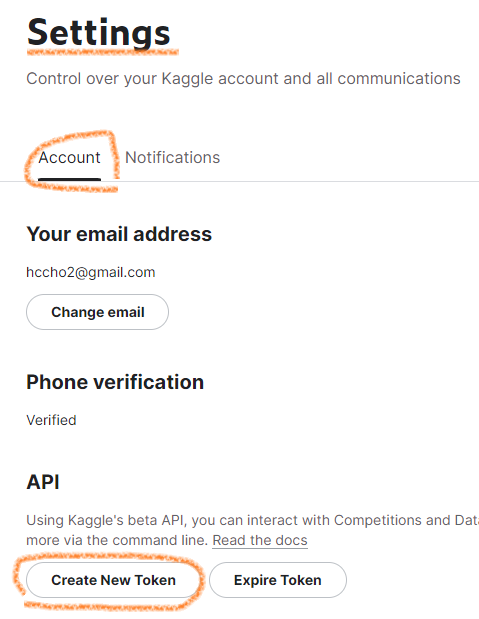

## Data Download
- kaggle.json 파일을 생성하기 위해, username, key를 지정해야 한다.

In [ ]:
! pip install kaggle -qq

In [ ]:
# kggle.json 파일에 있는 key를 사용하면 된다.
!mkdir /root/.kaggle
!echo '{"username":"my_id","key":"XXXXXX"}' > /root/.kaggle/kaggle.json

In [ ]:
# 'gtzan' 키워드로 검색  ---> "andradaolteanu/gtzan-dataset-music-genre-classification"
!kaggle datasets list -s gtzan

ref                                                      title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
andradaolteanu/gtzan-dataset-music-genre-classification  GTZAN Dataset - Music Genre Classification       1GB  2020-03-24 14:05:33          47079        653  0.88235295       
carlthome/gtzan-genre-collection                         GTZAN Genre Collection                           1GB  2019-10-30 07:38:06           4721         62  0.8125           
lnicalo/gtzan-musicspeech-collection                     GTZAN music/speech collection                  283MB  2017-10-24 12:52:44           1936         39  0.625            
mantasu/gtzan-stems                                      GTZAN Stems                                     13GB  2021-09-0

In [ ]:
!kaggle datasets download -d andradaolteanu/gtzan-dataset-music-genre-classification

 98% 1.19G/1.21G [00:15<00:00, 43.4MB/s]
100% 1.21G/1.21G [00:16<00:00, 80.9MB/s]


In [ ]:
! unzip -qq gtzan-dataset-music-genre-classification.zip

https://drive.google.com/file/d/1_uPw77ZwFK1IXjFSp2S6BMTit5KJ1RA4/view?usp=sharing
여기서 jazz.00054.wav 파일을 다운받아 대체한다.

In [ ]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1_uPw77ZwFK1IXjFSp2S6BMTit5KJ1RA4' -O jazz.00054.wav
!mv -f jazz.00054.wav ./Data/genres_original/jazz/jazz.00054.wav

--2023-09-27 03:16:30--  https://docs.google.com/uc?export=download&id=1_uPw77ZwFK1IXjFSp2S6BMTit5KJ1RA4
Resolving docs.google.com (docs.google.com)... 74.125.26.101, 74.125.26.139, 74.125.26.138, ...
Connecting to docs.google.com (docs.google.com)|74.125.26.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-c8-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/fjfnjp2vv8k7h3ftbeeooi3mek12nrho/1695784575000/09029903719518076034/*/1_uPw77ZwFK1IXjFSp2S6BMTit5KJ1RA4?e=download&uuid=84a5650a-23c7-4054-9a27-eda1e266caaa [following]
--2023-09-27 03:16:31--  https://doc-00-c8-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/fjfnjp2vv8k7h3ftbeeooi3mek12nrho/1695784575000/09029903719518076034/*/1_uPw77ZwFK1IXjFSp2S6BMTit5KJ1RA4?e=download&uuid=84a5650a-23c7-4054-9a27-eda1e266caaa
Resolving doc-00-c8-docs.googleusercontent.com (doc-00-c8-docs.googleusercontent.com)... 173.194.210.132, 2607:f8b0:400

파일 길이 check

In [ ]:
import glob
import os
import collections
import librosa

In [ ]:
# 길이 확인
data_path = 'Data/genres_original'
all_filenames = glob.glob(os.path.join(data_path, '*/*.wav'))
print("# of files: ", len(all_filenames))

lengths = []
for i, f in enumerate(all_filenames):
    try:
        y, sr = librosa.load(f,sr=22050, mono=True)
    except:
        print(f'Error: {f}')
    lengths.append(len(y))
    #if i>=200: break

counter = collections.Counter(lengths)
counter = dict(sorted(counter.items(), key=lambda item: item[0])) # 길이순 정렬
print(counter)

# of files:  1000
{660000: 1, 661100: 1, 661344: 2, 661408: 5, 661500: 1, 661504: 295, 661676: 4, 661760: 4, 661794: 640, 661980: 1, 662112: 1, 663080: 1, 663300: 2, 663520: 2, 663740: 1, 664180: 1, 664400: 1, 665060: 1, 665280: 3, 665940: 1, 666160: 1, 666820: 2, 667480: 1, 667700: 1, 667920: 3, 668140: 2, 668800: 1, 669240: 3, 669460: 1, 669680: 3, 670120: 1, 670340: 1, 672100: 1, 672282: 1, 675808: 10}


## 9.3.1 Dataset 만들기
- tf.data.Dataset

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import collections
from sklearn.metrics import confusion_matrix, accuracy_score

sns.set_theme()

In [ ]:
def load_csv_data(csv_filename,start_col):
    data = pd.read_csv(csv_filename)
    X = data.values[:,start_col:-1].astype(np.float32) # 앞 부분과 제일 마지막 label 제외

    min_max_scaler = MinMaxScaler()
    X = min_max_scaler.fit_transform(X)

    le = LabelEncoder()
    Y = le.fit_transform(data['label'])  # 0,..,9로 변환.
    mapping_table = le.classes_

    return X, Y,mapping_table

In [ ]:
X,Y,mapping_table = load_csv_data('Data/features_3_sec.csv',start_col=2)
print(mapping_table)
x_train, x_val, y_train, y_val = train_test_split(X, Y, test_size=0.1,stratify=Y,random_state=123)
print(x_train.shape, y_train.shape, x_val.shape, y_val.shape)

np.random.seed(123); tf.random.set_seed(123)
batch_size = 128
train_dataset = tf.data.Dataset.from_tensor_slices((x_train,y_train)).shuffle(buffer_size=5000).batch(batch_size)
validation_dataset = tf.data.Dataset.from_tensor_slices((x_val,y_val)).batch(batch_size)

['blues' 'classical' 'country' 'disco' 'hiphop' 'jazz' 'metal' 'pop'
 'reggae' 'rock']
(8991, 57) (8991,) (999, 57) (999,)


In [ ]:
# stratify=Y   ==>   label 비율에 따라 배분되었음을 확인할 수 있다.
collections.Counter(y_val)

Counter({7: 100,
         0: 100,
         1: 100,
         6: 100,
         2: 99,
         8: 100,
         5: 100,
         9: 100,
         4: 100,
         3: 100})

## 9.3.2 MLP Model - Tensorflow

In [ ]:
np.random.seed(123); tf.keras.utils.set_random_seed(123)

drop_rate = 0.25
n_class = len(mapping_table)
model_mlp = tf.keras.Sequential([
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dropout(drop_rate),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dropout(drop_rate),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(drop_rate),
        tf.keras.layers.Dense(n_class, activation='softmax')
])
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model_mlp.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_mlp.build((None,57)) # (batch_size, input_dim)
model_mlp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               29696     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 64)                16448     
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 10)                6

In [ ]:
def plot_history(history,title=None,save_name=None):
    fig, axs = plt.subplots(1,2,figsize=(12, 5))

    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="val accuracy")
    axs[0].set_ylim([0,1])
    axs[0].set_ylabel("Accuracy")
    axs[0].set_xlabel("Epoch")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy",fontsize=15)

    axs[1].plot(history.history["loss"], label="train loss")
    axs[1].plot(history.history["val_loss"], label="val loss")
    axs[1].set_ylim([0,2])
    axs[1].set_ylabel("Loss")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Loss",fontsize=15)
    if title:
        plt.suptitle(title,fontsize=20)

    plt.tight_layout()
    if save_name:
        plt.savefig(save_name)
    plt.show()

In [ ]:
history = model_mlp.fit(train_dataset, epochs=300,verbose=1,validation_data=validation_dataset,validation_freq=1)

Epoch 1/300
71/71 [==============================] - 6s 29ms/step - loss: 1.9447 - accuracy: 0.3044 - val_loss: 1.4854 - val_accuracy: 0.4354
Epoch 2/300
71/71 [==============================] - 2s 23ms/step - loss: 1.4701 - accuracy: 0.4555 - val_loss: 1.2788 - val_accuracy: 0.5185
Epoch 3/300
71/71 [==============================] - 2s 23ms/step - loss: 1.3190 - accuracy: 0.5171 - val_loss: 1.1086 - val_accuracy: 0.6306
Epoch 4/300
71/71 [==============================] - 2s 24ms/step - loss: 1.2154 - accuracy: 0.5627 - val_loss: 1.0473 - val_accuracy: 0.6436
Epoch 5/300
71/71 [==============================] - 2s 28ms/step - loss: 1.1371 - accuracy: 0.5907 - val_loss: 1.0197 - val_accuracy: 0.6436
Epoch 6/300
71/71 [==============================] - 2s 22ms/step - loss: 1.0777 - accuracy: 0.6192 - val_loss: 0.9642 - val_accuracy: 0.6777
Epoch 7/300
71/71 [==============================] - 2s 22ms/step - loss: 1.0300 - accuracy: 0.6345 - val_loss: 0.9025 - val_accuracy: 0.6937
Epoch 

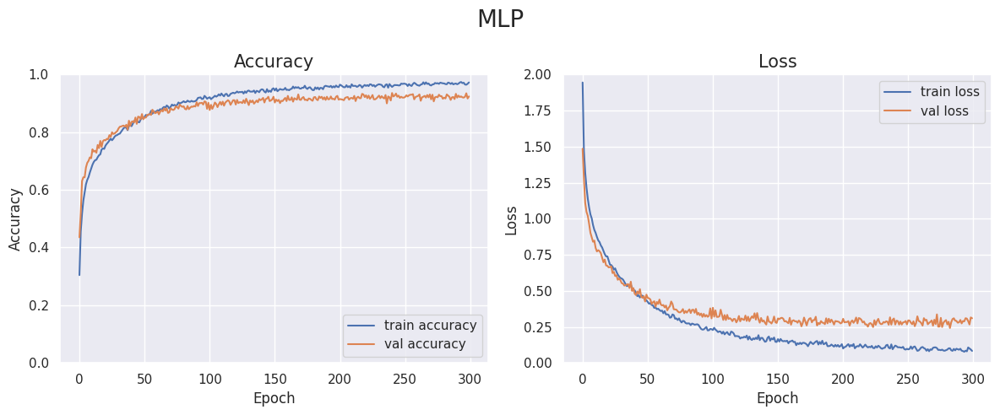

In [ ]:
plot_history(history,'MLP','music_genre_loss_acc.png')

In [ ]:
def plot_confusion_matrix(true_label,pred,label_names,model_name,save_fig):
    confusion_mtx = confusion_matrix(true_label, pred)
    ticklabels = label_names
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=1.0)
    sns.heatmap(confusion_mtx,
                xticklabels=ticklabels,
                yticklabels=ticklabels,
                annot=True, fmt='g')
    plt.xlabel('Prediction')
    plt.ylabel('Label')
    plt.title(model_name,fontsize=15)
    plt.tight_layout()
    plt.savefig(save_fig)
    plt.show()

32/32 [==============================] - 0s 2ms/step
MLP Val Accuracy: 0.92392


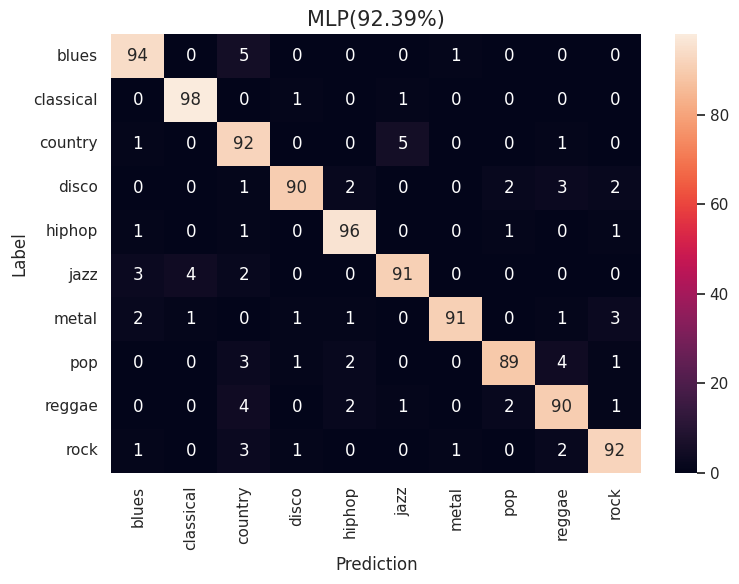

In [ ]:
mlp_pred = tf.argmax(model_mlp.predict(x_val),axis=-1)
mlp_acc = round(accuracy_score(y_val, mlp_pred), 5)
print(f'MLP Val Accuracy: {mlp_acc}')
plot_confusion_matrix(y_val,mlp_pred,mapping_table,f'MLP({mlp_acc:.2%})','music_genre_mlp_confusion.png')

## 9.3.3 XGBoost
XGBoost(Extreme Gradient Boosting)

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score

x_train, y_train은 "9.3.1"에서 생성.

In [ ]:
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.1, random_state=123)  # n_estimators: 결정 트리의 갯수(default=100)
xgb.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
xgb.score(x_val,y_val)

0.9229229229229229

XGBoost Val Accuracy: 0.92292


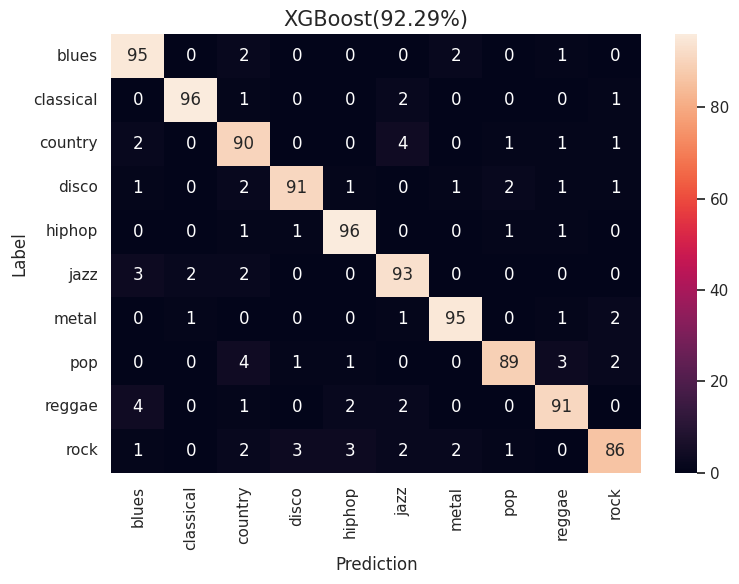

In [ ]:
# plot_confusion_matrix() --> 9.3.2에 정의되어 있다.
xgb_pred = xgb.predict(x_val)
xgb_acc = round(accuracy_score(y_val, xgb_pred), 5)
print(f'XGBoost Val Accuracy: {xgb_acc}')
plot_confusion_matrix(y_val,xgb_pred,mapping_table,f'XGBoost({xgb_acc:.2%})','music_genre_xgb_confusion.png')

## 9.3.4 Mel-Spectrogram, MFCC 데이터 생성

In [ ]:
import glob
import os
import librosa
import numpy as np
from sklearn.preprocessing import LabelEncoder
import pickle

In [ ]:
data_dir = r"Data/genres_original"
all_filenames = glob.glob(os.path.join(data_dir,'*/*.wav'))  # 1000개
print(len(all_filenames))

1000


In [ ]:
def make_audio_features(all_filenames,num_segment, feature='sepctrogram'):
    # feature: 'spectrogram', 'mel-spectrogram', 'mfcc'
    labels = []
    feature_all = []
    sr = 22050
    seg_length = 30*sr//num_segment
    for i, f in enumerate(all_filenames):
        base_name = os.path.basename(f)
        label = base_name.split('.')[0] # hiphop.00003.wav --> hiphop

        y, _ = librosa.load(f, mono=True, duration=30)
        if len(y) != sr*30:
            y = np.pad(y,(0,sr*30-len(y)))
        for k in range(num_segment):
            y_segment = y[k*seg_length:(k+1)*seg_length]

            stft = librosa.stft(y=y_segment,n_fft=2048)
            mag_spectrogram = librosa.magphase(stft,power=2)[0]
            log_spectrogram = librosa.power_to_db(mag_spectrogram,ref=np.max)

            if feature == 'spectrogram':
                feature_all.append(log_spectrogram.T)
            elif feature == 'mel-spectrogram':
                mel_spectrogram = librosa.feature.melspectrogram(S=mag_spectrogram, sr=sr,n_mels=80)
                log_mel_spectrogram = librosa.power_to_db(mel_spectrogram,ref=np.max)
                feature_all.append(log_mel_spectrogram.T)
            elif feature == 'mfcc':
                mfcc = librosa.feature.mfcc(y=y_segment, sr=sr,n_mfcc=40)
                feature_all.append(mfcc.T)
            labels.append(label)
        if i%100==0:
            print(f'{i}/{len(all_filenames)} done')
    le = LabelEncoder()
    labels = le.fit_transform(labels)
    label_names = le.classes_
    return {'features': np.array(feature_all), 'labels': np.array(labels), 'label-names': label_names}

# hop_length=512(default) ==> n_frames=130

#feature = 'spectrogram'; pickle_name = 'music_sepctrogram.pickle'
feature = 'mel-spectrogram'; pickle_name = 'music_mel_spectrogram.pickle'
#feature = 'mfcc'; pickle_name = 'music_mfcc.pickle'

if feature == 'mfcc':
    data = make_audio_features(all_filenames,num_segment=10, feature = 'mfcc')  # mfcc: 7분, 파일크기=203M
elif feature == 'spectrogram':
    data = make_audio_features(all_filenames,num_segment=10, feature = 'spectrogram') # n_fft=2048이면 메모리 부족  --> 5G 너무 크다.
elif feature == 'mel-spectrogram':
    data = make_audio_features(all_filenames,num_segment=10, feature = 'mel-spectrogram') # 6분, 파일크기=406M

with open(pickle_name, 'wb') as f:
    pickle.dump(data, f)

print(f'completed: {feature}')

0/1000 done
100/1000 done
200/1000 done
300/1000 done
400/1000 done
500/1000 done
600/1000 done
700/1000 done
800/1000 done
900/1000 done
completed: mel-spectrogram


## 9.3.5 CNN 모델
- "9.3.4"에서 생성한 데이터 사용하여 CNN 모델로 훈련
- 결론부터 말하면, "9.3.2"의 MLP + "feature_3_sec.csv"의 결과보다 못하다.

In [ ]:
import tensorflow as tf
import numpy as np
import pickle
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme()

In [ ]:
pickle_filename = 'music_mel_spectrogram.pickle'  # 'music_mel_spectrogram.pickle', 'music_mfcc.pickle'
with open(pickle_filename,'rb') as f:
    data=pickle.load(f)

if pickle_filename == 'music_mfcc.pickle':
    input_shape = (None,130,40,1)
elif pickle_filename == 'music_mel_spectrogram.pickle':
    input_shape = (None,130,80,1)

In [ ]:
x_train, x_val, y_train, y_val = train_test_split(data['features'][...,None], data['labels'], test_size=0.1,stratify=data['labels'],random_state=123)
print(x_train.shape, y_train.shape, x_val.shape, y_val.shape)

np.random.seed(123); tf.random.set_seed(123)
train_dataset = tf.data.Dataset.from_tensor_slices((x_train,y_train)).shuffle(buffer_size=300).batch(128)
validation_dataset = tf.data.Dataset.from_tensor_slices((x_val,y_val)).batch(128)

(9000, 130, 80, 1) (9000,) (1000, 130, 80, 1) (1000,)


#### 1-0. Simple CNN

In [ ]:
class SimpleCNN(tf.keras.Model):
    def __init__(self, n_class, flatten=False):
        super(SimpleCNN, self).__init__()
        self.drop_rate = 0.3

        self.L1 = tf.keras.models.Sequential()
        self.L1.add(tf.keras.layers.Conv2D(32, kernel_size=3, padding='same',activation='relu'))  # (28,28,32)
        self.L1.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))  # (14,14,32)
        self.L1.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L2 = tf.keras.models.Sequential()
        self.L2.add(tf.keras.layers.Conv2D(64, kernel_size=3, padding='same',activation='relu'))  #(14,14,64)
        self.L2.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))  # (7,7,64)
        self.L2.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L3 = tf.keras.models.Sequential()
        self.L3.add(tf.keras.layers.Conv2D(128, kernel_size=3, padding='same',activation='relu'))  # (7,7,128)
        self.L3.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2,padding='same'))  # (4,4,128)
        self.L3.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L4 = tf.keras.models.Sequential()
        if flatten:
            self.L4.add( tf.keras.layers.Flatten())
        else:
            self.L4.add(tf.keras.layers.GlobalAveragePooling2D()) # tf.keras.layers.Flatten()

        self.L4.add(tf.keras.layers.Dense(512,activation='relu'))
        self.L4.add(tf.keras.layers.Dropout(self.drop_rate))

        self.L5 = tf.keras.layers.Dense(n_class,activation=None)

    def call(self, x, training=None):
        # x: (N,28,28,1)
        out = self.L1(x,training)
        out = self.L2(out,training)
        out = self.L3(out,training)
        out = self.L4(out,training)
        out = self.L5(out)
        return out

#### 1-1. SimpleCNN - Mel-Spectrogram - Flatten(True)

In [ ]:
n_class = 10
model_cnn_large = SimpleCNN(n_class, flatten=True)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model_cnn_large.compile(optimizer=optimizer, loss=loss_fn, metrics=['accuracy'])

In [ ]:
model_cnn_large.build(input_shape)
model_cnn_large.summary()

Model: "simple_cnn_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_28 (Sequential)  (None, 65, 40, 32)        320       
                                                                 
 sequential_29 (Sequential)  (None, 32, 20, 64)        18496     
                                                                 
 sequential_30 (Sequential)  (None, 16, 10, 128)       73856     
                                                                 
 sequential_31 (Sequential)  (None, 512)               10486272  
                                                                 
 dense_15 (Dense)            multiple                  5130      
                                                                 
Total params: 10,584,074
Trainable params: 10,584,074
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history_cnn_large = model_cnn_large.fit(train_dataset, epochs=50,verbose=1,validation_data=validation_dataset,validation_freq=1)

Epoch 1/50
71/71 [==============================] - 6s 74ms/step - loss: 7.6928 - accuracy: 0.1117 - val_loss: 2.1809 - val_accuracy: 0.1570
Epoch 2/50
71/71 [==============================] - 5s 65ms/step - loss: 1.8851 - accuracy: 0.2986 - val_loss: 1.8302 - val_accuracy: 0.2970
Epoch 3/50
71/71 [==============================] - 4s 62ms/step - loss: 1.6798 - accuracy: 0.3704 - val_loss: 1.5571 - val_accuracy: 0.4370
Epoch 4/50
71/71 [==============================] - 5s 64ms/step - loss: 1.5091 - accuracy: 0.4472 - val_loss: 1.4725 - val_accuracy: 0.4520
Epoch 5/50
71/71 [==============================] - 4s 61ms/step - loss: 1.3869 - accuracy: 0.4863 - val_loss: 1.3471 - val_accuracy: 0.5150
Epoch 6/50
71/71 [==============================] - 4s 60ms/step - loss: 1.2882 - accuracy: 0.5294 - val_loss: 1.2591 - val_accuracy: 0.5430
Epoch 7/50
71/71 [==============================] - 4s 54ms/step - loss: 1.1877 - accuracy: 0.5703 - val_loss: 1.1517 - val_accuracy: 0.5920
Epoch 8/50
71

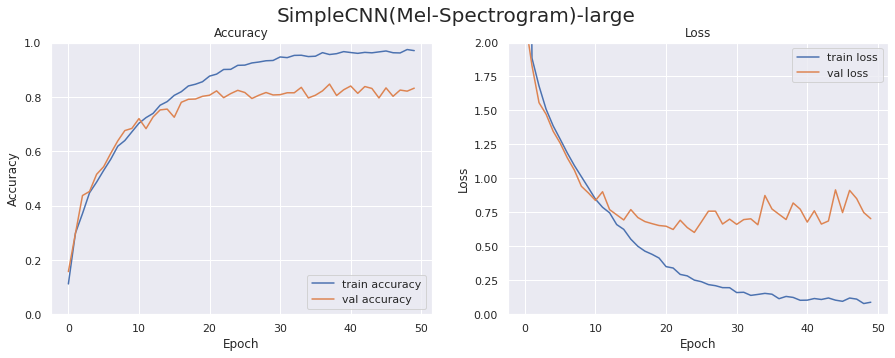

In [ ]:
plot_history(history_cnn_large,'SimpleCNN(Mel-Spectrogram)-large','simplecnn-mel-spectrogram-large.png')

#### 1-2. SimpleCNN - Mel-Spectrogram - Flatten(False)
- GlobalAvergePooling
- 더 작은 모델

In [ ]:
n_class = 10
model_cnn_small = SimpleCNN(n_class,flatten=False)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model_cnn_small.compile(optimizer=optimizer, loss=loss_fn, metrics=['accuracy'])

In [ ]:
model_cnn_small.build(input_shape)
model_cnn_small.summary()

Model: "simple_cnn_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_12 (Sequential)  (None, 65, 40, 32)        320       
                                                                 
 sequential_13 (Sequential)  (None, 32, 20, 64)        18496     
                                                                 
 sequential_14 (Sequential)  (None, 16, 10, 128)       73856     
                                                                 
 sequential_15 (Sequential)  (None, 512)               66048     
                                                                 
 dense_7 (Dense)             multiple                  5130      
                                                                 
Total params: 163850 (640.04 KB)
Trainable params: 163850 (640.04 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
history_cnn_small = model_cnn_small.fit(train_dataset, epochs=50,verbose=1,validation_data=validation_dataset,validation_freq=1)

Epoch 1/50
71/71 [==============================] - 5s 53ms/step - loss: 2.5540 - accuracy: 0.1073 - val_loss: 2.2639 - val_accuracy: 0.1500
Epoch 2/50
71/71 [==============================] - 4s 52ms/step - loss: 1.9949 - accuracy: 0.2518 - val_loss: 1.9561 - val_accuracy: 0.2530
Epoch 3/50
71/71 [==============================] - 4s 51ms/step - loss: 1.6562 - accuracy: 0.3643 - val_loss: 1.7144 - val_accuracy: 0.3390
Epoch 4/50
71/71 [==============================] - 4s 51ms/step - loss: 1.5507 - accuracy: 0.4103 - val_loss: 1.6293 - val_accuracy: 0.3530
Epoch 5/50
71/71 [==============================] - 4s 50ms/step - loss: 1.4524 - accuracy: 0.4533 - val_loss: 1.4998 - val_accuracy: 0.4360
Epoch 6/50
71/71 [==============================] - 4s 52ms/step - loss: 1.3590 - accuracy: 0.4971 - val_loss: 1.2694 - val_accuracy: 0.5370
Epoch 7/50
71/71 [==============================] - 4s 51ms/step - loss: 1.2734 - accuracy: 0.5308 - val_loss: 1.2154 - val_accuracy: 0.5670
Epoch 8/50
71

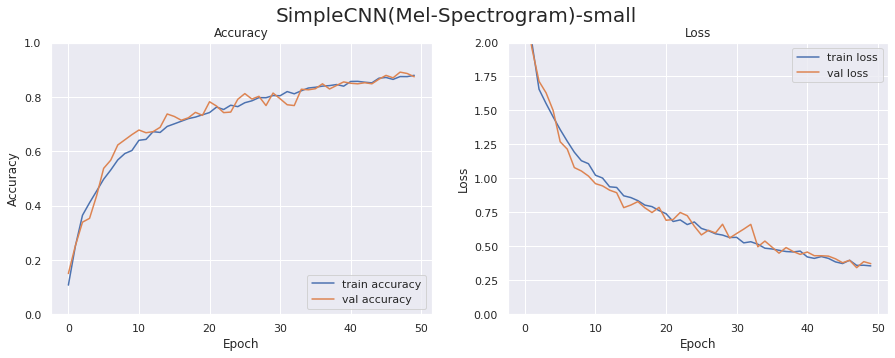

In [ ]:
plot_history(history_cnn_small,'SimpleCNN(Mel-Spectrogram)-small','simplecnn-mel-spectrogram-small.png')

## 9.3.6 Audio Feature 생성
- features_3_sec.csv에 있는 feature를 직접 만들기
- make_audio_features_advanced() --> 실행시간 약 5000초(colab), 2600초(PC)

In [ ]:
import os
import csv
import time
import librosa
import numpy as np
import glob

In [ ]:
def make_audio_features_advanced(DATASET_PATH, output_filename, num_segments):
    header = 'filename chroma_stft_mean chroma_stft_var rmse_mean rmse_var spectral_centroid_mean'
    header += ' spectral_centroid_var spectral_bandwidth_mean spectral_bandwidth_var rolloff_mean'
    header += ' rolloff_var zero_crossing_rate_mean zero_crossing_rate_var harmony_mean harmony_var'
    header += ' percussive_mean percussive_var tempo'

    n_mfcc=20

    for i in range(1, n_mfcc+1):
        header += f' mfcc{i}_mean mfcc{i}_var'
    header += ' label'   # filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
    header = header.split()
    file = open(output_filename, 'w', newline='')
    with file:
        writer = csv.writer(file)
        writer.writerow(header)
    genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()
    sr = 22050
    s_time = time.time()
    with open(output_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        seg_length = 30*sr//num_segments
        for g in genres:
            all_filename = sorted(glob.glob(os.path.join(DATASET_PATH,g,'*.wav')))
            for filename in all_filename:
                y, sr = librosa.load(filename, mono=True, duration=30)
                if len(y) != sr*30:
                    y = np.pad(y,(0,sr*30-len(y)))

                for d in range(num_segments):
                    # 1. filename + segment  ---> blues.00000.0.wav
                    segment_filename = os.path.splitext(filename)  # ('blues.00000', '.wav')
                    segment_filename = segment_filename[0]+'.'+str(d)+segment_filename[1]  #

                    y_segment = y[d*seg_length:(d+1)*seg_length]

                    # 2. chroma_shift
                    chroma_stft = librosa.feature.chroma_stft(y=y_segment, sr=sr)

                    # 3. rmse
                    rms = librosa.feature.rms(y=y)

                    # 4. spectral_centroid
                    spec_cent = librosa.feature.spectral_centroid(y=y_segment, sr=sr)

                    # 5. spectral_bandwidth
                    spec_bw = librosa.feature.spectral_bandwidth(y=y_segment, sr=sr)

                    # 6. rolloff
                    rolloff = librosa.feature.spectral_rolloff(y=y_segment, sr=sr)

                    # 7. zero_crossing_rate
                    zcr = librosa.feature.zero_crossing_rate(y_segment)


                    #8,9 harmony,
                    harmonic,percussive = librosa.effects.hpss(y_segment)
                    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

                    # 8-27. mfcc(20개)
                    mfcc = librosa.feature.mfcc(y=y_segment, sr=sr,n_mfcc=20)

                    to_append =  f'{segment_filename} {np.mean(chroma_stft)} {np.var(chroma_stft)}'
                    to_append += f' {np.mean(rms)} {np.var(rms)} {np.mean(spec_cent)} {np.var(spec_cent)}'
                    to_append += f' {np.mean(spec_bw)} {np.var(spec_bw)} {np.mean(rolloff)} {np.var(rolloff)} {np.mean(zcr)} {np.var(zcr)}'
                    to_append += f' {np.mean(harmonic)} {np.var(harmonic)} {np.mean(percussive)} {np.var(percussive)}'
                    to_append += f' {tempo}'
                    for e in mfcc:  # 20개의 mfcc 계수에 대하여, 모든 frame에 대한 평균/분산을 계산한다.
                        to_append += f' {np.mean(e)} {np.var(e)}'

                    to_append += f' {g}'

                    writer.writerow(to_append.split())
            print(f'{g} done ......{time.time() - s_time:.2f}sec')
    print(f'completed: {output_filename}')

In [ ]:
DATASET_PATH = r'Data/genres_original'
output_filename = 'audio_features_3_sec.csv'   # 300초 x 10개 = 50분 소요.
num_segments = 10

make_audio_features_advanced(DATASET_PATH,output_filename,num_segments)

blues done ......485.75sec
classical done ......1013.52sec
country done ......1485.76sec
disco done ......1977.86sec
hiphop done ......2462.40sec
jazz done ......2945.43sec
metal done ......3434.45sec
pop done ......3920.34sec
reggae done ......4404.81sec
rock done ......4880.20sec
completed: audio_features_3_sec.csv


### Dataset 만들기

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

In [ ]:
X,Y,mapping_table = load_csv_data('audio_features_3_sec.csv',start_col=1)
print(mapping_table)
x_train, x_val, y_train, y_val = train_test_split(X, Y, test_size=0.1,stratify=Y,random_state=123)
print(x_train.shape, y_train.shape, x_val.shape, y_val.shape)

np.random.seed(123); tf.random.set_seed(123)
batch_size = 128
train_dataset = tf.data.Dataset.from_tensor_slices((x_train,y_train)).shuffle(buffer_size=5000).batch(batch_size)
validation_dataset = tf.data.Dataset.from_tensor_slices((x_val,y_val)).batch(batch_size)

['blues' 'classical' 'country' 'disco' 'hiphop' 'jazz' 'metal' 'pop'
 'reggae' 'rock']
(9000, 57) (9000,) (1000, 57) (1000,)


### MLP 모델, 훈련

In [ ]:
np.random.seed(123); tf.random.set_seed(123)

drop_rate = 0.25

model_mlp = tf.keras.Sequential([
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dropout(drop_rate),
        tf.keras.layers.Dense(256, activation='relu'),
        tf.keras.layers.Dropout(drop_rate),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(drop_rate),
        tf.keras.layers.Dense(10, activation='softmax')
])
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model_mlp.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model_mlp.fit(train_dataset, epochs=300,verbose=1,validation_data=validation_dataset,validation_freq=1)

Epoch 1/300
71/71 [==============================] - 1s 10ms/step - loss: 1.8815 - accuracy: 0.3168 - val_loss: 1.4681 - val_accuracy: 0.4490
Epoch 2/300
71/71 [==============================] - 1s 8ms/step - loss: 1.4438 - accuracy: 0.4612 - val_loss: 1.2511 - val_accuracy: 0.5480
Epoch 3/300
71/71 [==============================] - 1s 8ms/step - loss: 1.2746 - accuracy: 0.5279 - val_loss: 1.1269 - val_accuracy: 0.5950
Epoch 4/300
71/71 [==============================] - 1s 8ms/step - loss: 1.1678 - accuracy: 0.5838 - val_loss: 1.0199 - val_accuracy: 0.6410
Epoch 5/300
71/71 [==============================] - 1s 8ms/step - loss: 1.0799 - accuracy: 0.6141 - val_loss: 0.9512 - val_accuracy: 0.6770
Epoch 6/300
71/71 [==============================] - 1s 8ms/step - loss: 1.0216 - accuracy: 0.6408 - val_loss: 0.9393 - val_accuracy: 0.6740
Epoch 7/300
71/71 [==============================] - 1s 8ms/step - loss: 0.9746 - accuracy: 0.6503 - val_loss: 0.8532 - val_accuracy: 0.6950
Epoch 8/300


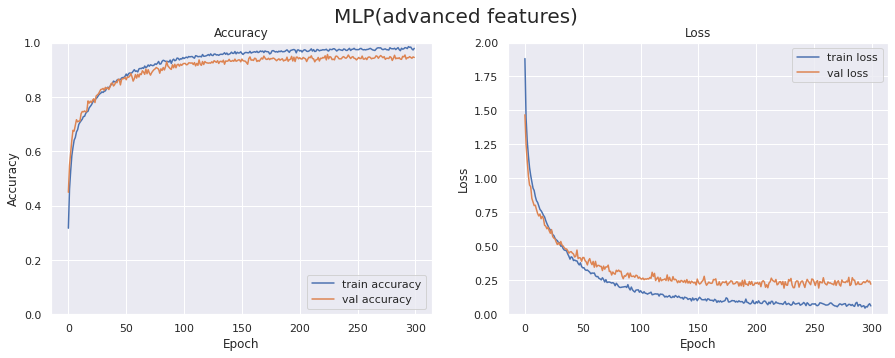

In [ ]:
plot_history(history,'MLP(advanced features)','mlp_advanced_features.png')

32/32 [==============================] - 0s 2ms/step
MLP Val Accuracy: 0.945


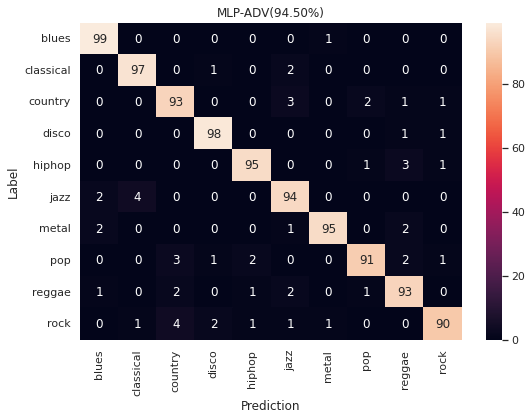

In [ ]:
mlp_pred = tf.argmax(model_mlp.predict(x_val),axis=-1)
mlp_acc = round(accuracy_score(y_val, mlp_pred), 5)
print(f'MLP Val Accuracy: {mlp_acc}')
plot_confusion_matrix(y_val,mlp_pred,mapping_table,f'MLP-ADV({mlp_acc:.2%})','music_genre_mlp_adv_confusion.png')

## 9.3.7 LightGBM
-  Light Gradient-Boosting Machine

In [ ]:
import lightgbm as lgb

In [ ]:
lgb_classifier = lgb.LGBMClassifier(n_estimators=1000, learning_rate=0.1,random_state=123)
lgb_classifier.fit(x_train, y_train)

LGBMClassifier(n_estimators=1000, random_state=123)

In [ ]:
lgb_classifier.score(x_val,y_val)

0.977

LightGBM Val Accuracy: 0.977


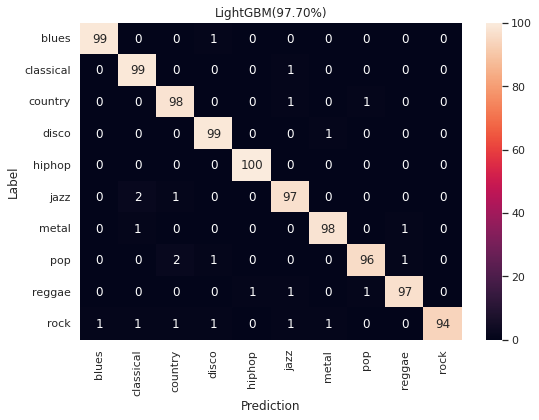

In [ ]:
lgb_preds = lgb_classifier.predict(x_val)
lgb_acc = round(accuracy_score(y_val, lgb_preds), 5) # lgb_classifier.score(x_val,y_val)
print(f'LightGBM Val Accuracy: {lgb_acc}')
plot_confusion_matrix(y_val,lgb_preds,mapping_table,f'LightGBM({lgb_acc:.2%})','music_genre_lgb_confusion.png')

# 9.4 Torchaudio
- torchaudio.info()
- torchaudio.laod() 파일 고유의 sampling rate

In [ ]:
import torch
import torchaudio
import librosa
import matplotlib.pyplot as plt

In [ ]:
def plot_waveform(waveform, sample_rate):
    # https://pytorch.org/audio/stable/tutorials/audio_io_tutorial.html
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f"Channel {c+1}")
    figure.suptitle("waveform")
    plt.show()

AudioMetaData(sample_rate=44100, num_frames=155520, num_channels=2, bits_per_sample=16, encoding=PCM_S)


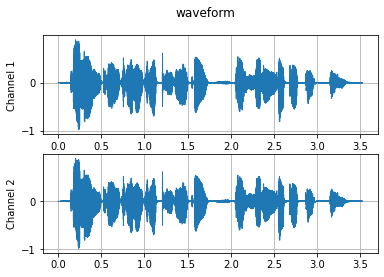

In [ ]:
audio_filename = "kss_1_0000.wav"  #"LJ001-0001.wav", "kss_1_0000.wav"
metadata = torchaudio.info(audio_filename)
print(metadata)

waveform, sample_rate = torchaudio.load(audio_filename) # --> torch.float32, [-1,1], (n_channels,, xxx)
plot_waveform(waveform, sample_rate)

## 9.4.1 Spectrogram & Mel Spectrogram
- librosa와 거의 유사한 결과를 얻을 수 있다.
- https://pytorch.org/audio/stable/tutorials/audio_feature_extractions_tutorial.html#audio-feature-extractions

In [ ]:
import torchaudio
import torchaudio.transforms as T
import torch
import matplotlib.pyplot as plt
import librosa

In [ ]:
sr=22050; n_fft=2048; hop_length=512;
win_length = n_fft
n_mels = 90

audio_filename = "kss_1_0000.wav"  #"LJ001-0001.wav", "kss_1_0000.wav"
waveform, sample_rate = torchaudio.load(audio_filename)   # (ch,length)
waveform_mono = torch.mean(waveform, dim=0) # no channel

In [ ]:
# Define transforms
# 1. resample --> sampling rate change
resample = T.Resample(orig_freq = sample_rate, new_freq= sr)


# 2. spectrogram(waveform 입력)
# (T) --> (n_fft/2+1,n_frame), (ch,T) --> (ch,n_fft/2+1,n_frame)
spectrogram = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
)

# 3. mel spectrogram(waveform 입력)
mel_spectrogram = T.MelSpectrogram(
    sample_rate=sr,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm="slaney",
    onesided=True,
    n_mels=n_mels,
    mel_scale="slaney",
)

power_to_db = T.AmplitudeToDB(stype="power", top_db=80)

In [ ]:
y = resample(waveform_mono)
spec = spectrogram(y)  # (n_fft/2+1, frame_length)
mel_spec = mel_spectrogram(y) #(n_mels,frame_length)

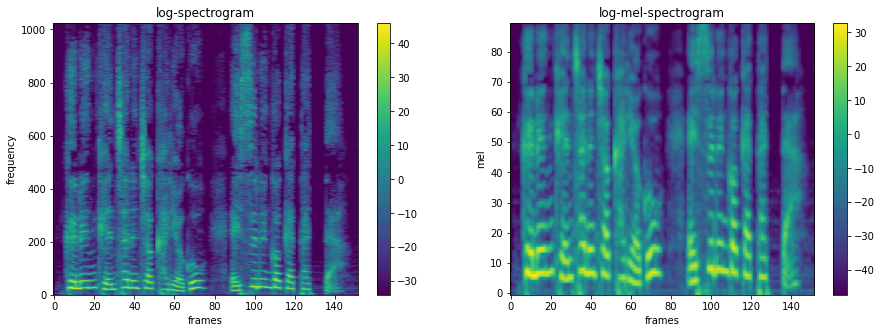

In [ ]:
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.imshow(librosa.power_to_db(spec), origin="lower", aspect="auto")
plt.colorbar()
plt.xlabel('frames')
plt.ylabel('frequency')
plt.title('log-spectrogram')

plt.subplot(122)
plt.imshow(librosa.power_to_db(mel_spec), origin="lower", aspect="auto")
plt.colorbar()
plt.xlabel('frames')
plt.ylabel('mel')
plt.title('log-mel-spectrogram')
plt.savefig('torchaudio-spectrogram.png')
plt.show()

Text(0.5, 1.0, 'log-spectrogram')

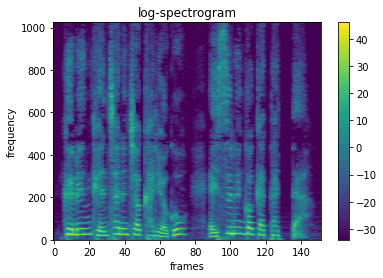

In [ ]:
plt.imshow(power_to_db(spec), origin="lower", aspect="auto")
plt.colorbar()
plt.xlabel('frames')
plt.ylabel('frequency')
plt.title('log-spectrogram')

In [ ]:
# batch 처리도 가능하다.
xx = torch.stack([waveform,waveform,waveform])
yy = spectrogram(xx)
xx.shape, yy.shape

(torch.Size([3, 2, 155520]), torch.Size([3, 2, 1025, 304]))

torch.stft

In [ ]:
# waveform (ch,length) 또는 (N,length)
torch.stft(waveform,n_fft=1024,return_complex=True).shape

torch.Size([2, 513, 608])

## 9.4.2 torchaudio mel filter bank

- 9.1.6에 관련 코드 있음.

## 9.4.3 Audio Data Augmentation

### Sox로 pitch 변환

In [ ]:
import torch
import torchaudio
import librosa
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import glob
import torch.nn.functional as F
import random
import os

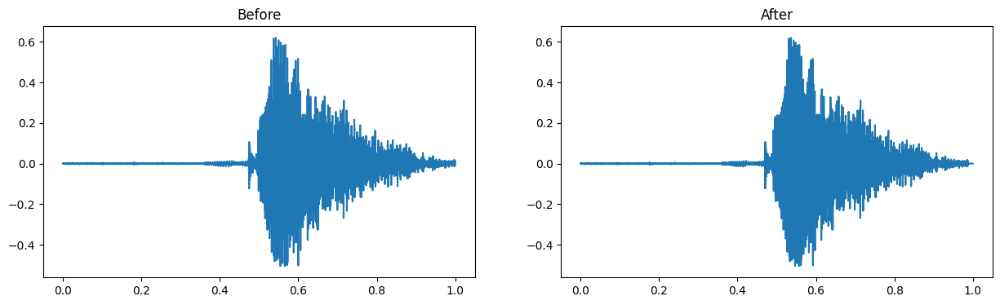

In [ ]:
# Load the data
waveform1, sample_rate1 = torchaudio.load('go.wav')
plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
t = np.arange(waveform1.shape[-1])/sample_rate1
plt.plot(t,waveform1[0])
plt.title('Before')

effects = [
    ['pitch', '200'],  # 200 cent pitch shift
]

# Apply effects
waveform2, sample_rate2 = torchaudio.sox_effects.apply_effects_tensor(waveform1, sample_rate1, effects) # sampling rate이 변경된다.
plt.subplot(1,2,2)
t = np.arange(waveform2.shape[-1])/sample_rate2
plt.plot(t,waveform2[0])
plt.title('After')
plt.show()

ipd.display(ipd.Audio(waveform1,rate=sample_rate1))
ipd.display(ipd.Audio(waveform2,rate=sample_rate2))

In [ ]:
sample_rate1,sample_rate2, waveform1.shape, waveform2.shape

(16000, 19027, torch.Size([1, 16000]), torch.Size([1, 19027]))

### Background Noise 추가
 - https://www.kaggle.com/competitions/tensorflow-speech-recognition-challenge/data
 - 이곳에서 train.7z를 받아 받아보면, 그 속에 "_background_noise_" 디렉토리가 있다.
 - 디렉토리 아래에 sr=16,000인 6개의 noise 파일이 있다.

In [ ]:
background_path = '_background_noise_'
background_noise_files = glob.glob(os.path.join(background_path,"*.wav"))
Sampling_Rate = 16000

backgound_noise_waveforms = []
for noise_file in background_noise_files:
    w,sr = torchaudio.load(noise_file)
    backgound_noise_waveforms.append(w.mean(0)/w.max()) # mono waveform
    assert Sampling_Rate == sr

In [ ]:
# waveform과 background noise의 sampling rate이 동일해야 한다.
def add_noise(waveform,time_shift=True, noise_prob=0.5, max_noise=0.8):
    # waveform: 1d Pytorch Tensor
    Max_Time_Shift = 0.1 * 16000

    length = len(waveform)
    if time_shift:
        shift_amount = np.random.randint(-Max_Time_Shift, Max_Time_Shift)
        if shift_amount>=0:
            waveform = F.pad(waveform,[shift_amount,0])[:length]
        else:
            waveform = F.pad(waveform,[0,-shift_amount])[-length:]


    if np.random.rand() < noise_prob:
        selected_backgound_noise = random.choice(backgound_noise_waveforms)
        noise_length = len(selected_backgound_noise)
        noise_point = np.random.randint(noise_length-length)
        noise_ratio = max_noise * np.random.rand()
        waveform = waveform + noise_ratio*selected_backgound_noise[noise_point: noise_point + length]
        waveform = waveform / waveform.max()  # normalization
    return waveform

torch.Size([1, 16000]) 16000


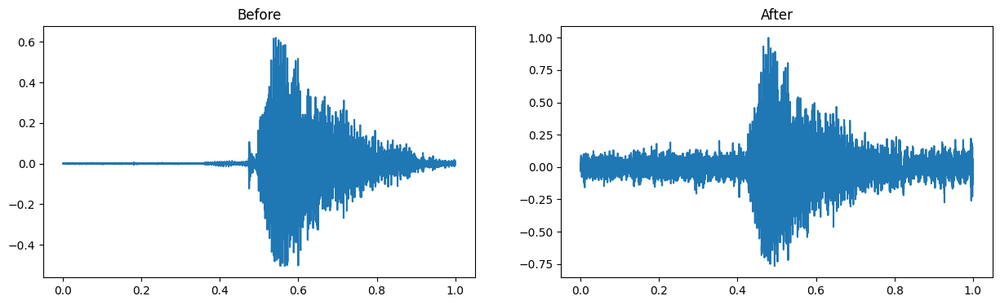

In [ ]:
waveform, sr = torchaudio.load('go.wav')
print(waveform.shape, sr)

ipd.display(ipd.Audio(waveform,rate=sr))
waveform_mono = torch.mean(waveform, dim=0)
t = np.arange(waveform.shape[-1])/sr
plt.figure(figsize=(15,4))
plt.subplot(1,2,1)
plt.plot(t, waveform_mono.numpy())
plt.title('Before')

noised_waveform = add_noise(waveform_mono)
ipd.display(ipd.Audio(noised_waveform,rate=sr))
plt.subplot(1,2,2)
plt.plot(t, noised_waveform.numpy())
plt.title('After')
plt.savefig('audio_aug.png')

## 9.4.4 Time Stretch

In [ ]:
import torch
import torchaudio
import torchaudio.transforms as T
import matplotlib.pyplot as plt
import librosa
import numpy as np

In [ ]:
audio_filename = 'kss_1_0000.wav'  # 16-bit
y, sr = librosa.load(audio_filename,sr=22050, mono=True) # sr=22050(default), mono=True(default)
y_fast = librosa.effects.time_stretch(y, rate=1.5)
print(y.shape, y_fast.shape) # (77760,) (51840,)

ipd.display(ipd.Audio(y,rate=sr))
ipd.display(ipd.Audio(y_fast,rate=sr))

(77760,) (51840,)


## 9.4.5 SpecAugment

### TIMEMASKING
- time_mask_param: masking할 최대 길이. 이보다 작게 random하게 선택
- p=1: masking할 최대 비율. 예로 p=0.5이면 최대 50%까지만 masking
- time_mask_param, p가 결합하여 최대 masking 길이를 결정한다.

In [ ]:
n_fft=2048; hop_length=512; win_length = n_fft

spectrogram = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
)

audio_filename = "kss_1_0000.wav"
waveform, sample_rate = torchaudio.load(audio_filename)   # (ch,length)
waveform = torch.mean(waveform, dim=0,keepdim=True)

original = spectrogram(waveform)  # (ch,n_fft/2+1,n_frames)

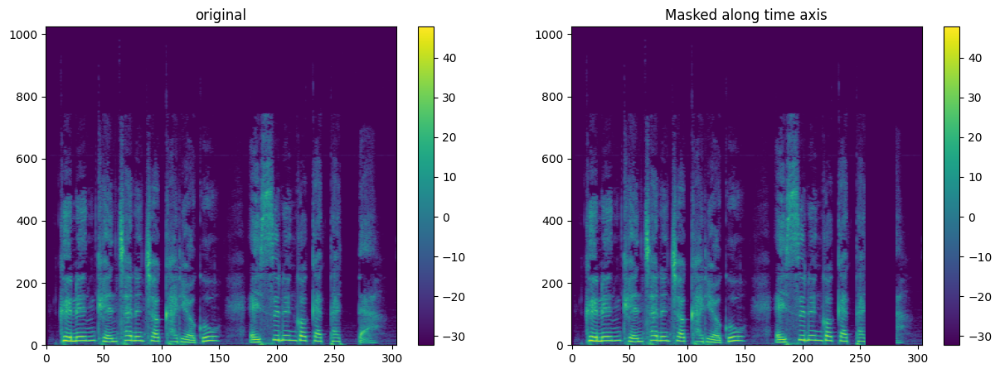

In [ ]:
time_masking = T.TimeMasking(time_mask_param=80)

masked = time_masking(original)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(librosa.power_to_db(original[0]), origin="lower", aspect="auto")
plt.colorbar()
plt.title('original')

plt.subplot(1,2,2)
plt.imshow(librosa.power_to_db(masked[0]), origin="lower", aspect="auto")
plt.colorbar()
plt.title('Masked along time axis')
plt.savefig('time_mask.png')

### FREQUENCYMASKING

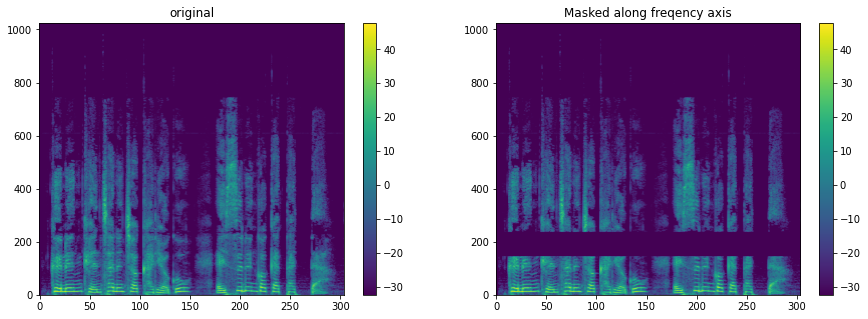

In [ ]:
freq_masking = torchaudio.transforms.FrequencyMasking(freq_mask_param=160)

masked = freq_masking(original)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(librosa.power_to_db(original[0]), origin="lower", aspect="auto")
plt.colorbar()
plt.title('original')

plt.subplot(1,2,2)
plt.imshow(librosa.power_to_db(masked[0]), origin="lower", aspect="auto")
plt.colorbar()
plt.title('Masked along freqency axis')
plt.savefig('freq_mask.png')

### TIMESTRETCH

### Time Stretch(Speed Change)
- librosa.effects.time_stretch()
- phase vocoder를 이용한다. stft로 변환후 길이를 조절하고 다시 istft로 되돌린다.

In [ ]:
audio_filename = 'kss_1_0000.wav'  # 16-bit
y, sr = librosa.load(audio_filename,sr=22050, mono=True) # sr=22050(default), mono=True(default)
ipd.display(ipd.Audio(y,rate=sr))

y_fast = librosa.effects.time_stretch(y, rate=1.5)
y_slow = librosa.effects.time_stretch(y, rate=0.85)
print(y.shape, y_fast.shape, y_slow.shape) # (77760,) (51840,) (91482,)
ipd.display(ipd.Audio(y_fast,rate=sr))
ipd.display(ipd.Audio(y_slow,rate=sr))

(77760,) (51840,) (91482,)


음원을 단순히 짧게하면 pitch가 변한다.

In [ ]:
ipd.Audio(y,rate=sr*1.5)

In [ ]:
ipd.Audio(y,rate=sr/1.15)

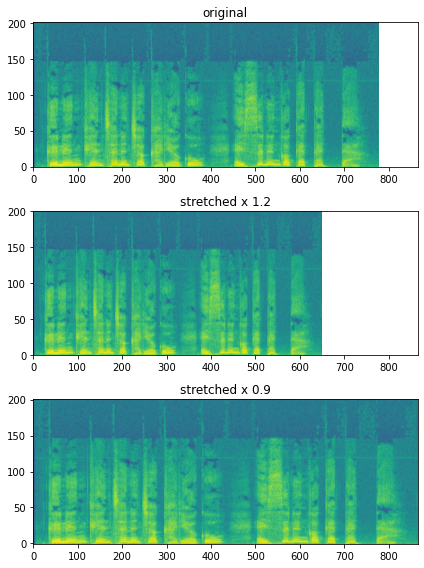

In [ ]:
spectrogram = torchaudio.transforms.Spectrogram(power=None)
stretch = torchaudio.transforms.TimeStretch()

original = spectrogram(waveform)
streched_1_2 = stretch(original, overriding_rate=1.2) # overriding_rate > 1 --> 길이가 짧아진다.
streched_0_9 = stretch(original, overriding_rate=0.9) # overriding_rate < 1 --> 길이가 길어진다.

plt.figure(figsize=(6,8))
plt.subplot(3,1,1)
plt.imshow(librosa.power_to_db(original[0].abs()), origin="lower", aspect="auto")
plt.xlim([0,865])
plt.title('original')

plt.subplot(3,1,2)
plt.imshow(librosa.power_to_db(streched_1_2[0].abs()), origin="lower", aspect="auto")
plt.xlim([0,865])
plt.title('stretched x 1.2')

plt.subplot(3,1,3)
plt.imshow(librosa.power_to_db(streched_0_9[0].abs()), origin="lower", aspect="auto")
plt.xlim([0,865])
plt.title('stretched x 0.9')
plt.tight_layout()
plt.savefig('time_stretch.png')

In [ ]:
original.shape, streched_0_9.shape, streched_1_2.shape

(torch.Size([1, 201, 778]),
 torch.Size([1, 201, 865]),
 torch.Size([1, 201, 649]))

# 9.5 Speech Command 분류 - Pytorch
- https://www.kaggle.com/c/tensorflow-speech-recognition-challenge
- 30개 단어에 대한 wav 파일들로 구성되어 있다.
- 이중 10개 단어(yes, no, up, down, left, right, on, off, stop, go)에 대한 분류 문제.
- 나머지 20개 단어는 unknown으로 처리
- 10개 단어 + unknown + silence  --> 12개 class로 분류

==============
- 데이터에는 noise 파일이 포함되어 있다. `train/audio/_background_noise_`  --> 6개 파일이 있다.
- white noise, pink noise, 설거지 소리, 운동용 자전거 소리 등.

==============
- 'validation_list.txt', 'testing_list.txt' 파일이 있어, train/audio 디렉토리 아래에 있는 파일 일부를 validataion, test set으로 나누고 있다.
- 화자를 기준으로 나누어져 있기 때문에, validation, test에 포함된 화자는 train set에 포함되지 않는다.

Pytroch SPEECHCOMMANDS
- kaggle에서 직접 다운로드 받는 방법 외에 torchaudio에서 제공하는 SPEECHCOMMANDS가 있다.
- torchaudio에서 제공하는 SPEECHCOMMANDS를 이용해서 Dataset을 만들 수도 있다.

In [ ]:
from torchaudio.datasets import SPEECHCOMMANDS
import IPython.display as ipd
import matplotlib.pyplot as plt

In [ ]:
train_set = SPEECHCOMMANDS(subset="training",download=True,root='./')  # url = "speech_commands_v0.02"(default)
len(train_set)

  0%|          | 0.00/2.26G [00:00<?, ?B/s]

84843

In [ ]:
test_set = SPEECHCOMMANDS(subset="testing",download=True,root='./')
validation_set = SPEECHCOMMANDS(subset="validation",download=True,root='./')
len(test_set), len(validation_set)

(11005, 9981)

In [ ]:
waveform, sample_rate, label, speaker_id, utterance_number = train_set[13000]

waveform.shape, sample_rate, label, speaker_id, utterance_number

(torch.Size([1, 16000]), 16000, 'eight', 'a16013b7', 4)

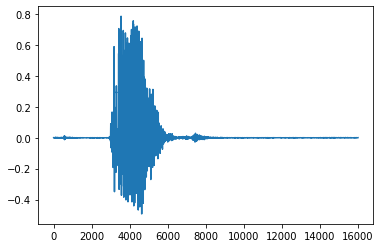

In [ ]:
plt.plot(waveform[0])

ipd.Audio(waveform[0],rate=sample_rate)

In [ ]:
train_set._walker[:5]

['SpeechCommands/speech_commands_v0.02/backward/0165e0e8_nohash_0.wav',
 'SpeechCommands/speech_commands_v0.02/backward/017c4098_nohash_0.wav',
 'SpeechCommands/speech_commands_v0.02/backward/017c4098_nohash_1.wav',
 'SpeechCommands/speech_commands_v0.02/backward/017c4098_nohash_2.wav',
 'SpeechCommands/speech_commands_v0.02/backward/017c4098_nohash_3.wav']

In [ ]:
train_set = SPEECHCOMMANDS(subset="training",download=True,root='./',url="speech_commands_v0.01")
test_set = SPEECHCOMMANDS(subset="testing",download=True,root='./',url="speech_commands_v0.01")
validation_set = SPEECHCOMMANDS(subset="validation",download=True,root='./',url="speech_commands_v0.01")
len(train_set),len(test_set), len(validation_set)

(51088, 6835, 6798)

## 9.5.1 Kaggle Speech Command Dataset
- 다운로드는 Tensorflow 사이트에서 직접 받을 수도 있다. v0.02가 더 많은 파일을 가지고 있다.
    * !wget "http://download.tensorflow.org/data/speech_commands_v0.01.tar.gz"
    * !wget "http://download.tensorflow.org/data/speech_commands_v0.02.tar.gz"                  <-- 데이터가 더 많다.
    * tar.gz 파일에는 kaggle submission용 test data가 없다.
- 여기서는 torchaudio의 SPEECHCOMMANDS나 Tensorflow 사이트에서 다운로드 받는 대신, Kaggle 데이터를 colab에서 다운받는 방법으로 접근해보자.
    * 이런 방식으로 데이터를 직접 다루어 보는 것이 교육적인 측면에서 도움이 된다.
    * https://www.kaggle.com/competitions/tensorflow-speech-recognition-challenge/data
    * train.7z, test.7z가 있다.
    * train.7z 속에 validation_list.txt, testing_list.txt가 있어, 데이터를 나누어주고 있다.
    * test.7z 속에는 미분류 wav 파일들이 있다.  --> 모델로 예측하여 Kaggle submission을 하면 된다.
    * 각 단어별로 1초보다 짧은 데이터들이 200~300개 정도 포함되어 있다.
    * 예: yes/004ae714_nohash_1.wav -> 14861/16000=0.9288초

kaggle.json 다운받아 C:\Users\<Windows-username> \\.kaggle\kaggle.json

username, key를 확인한다.

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# kggle.json 파일에 있는 key를 사용하면 된다.
!mkdir /root/.kaggle
!echo '{"username":"my_id","key":"XXXXXX"}' > /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
# 생성 여부 확인
!cat /root/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c tensorflow-speech-recognition-challenge

100% 3.50G/3.50G [00:38<00:00, 69.7MB/s]
100% 3.50G/3.50G [00:38<00:00, 96.7MB/s]


In [ ]:
!unzip tensorflow-speech-recognition-challenge.zip

Archive:  tensorflow-speech-recognition-challenge.zip
  inflating: link_to_gcp_credits_form.txt  
  inflating: sample_submission.7z    
  inflating: test.7z                 
  inflating: train.7z                


In [ ]:
!7z x train.7z


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 1121103842 bytes (1070 MiB)

Extracting archive: train.7z
--
Path = train.7z
Type = 7z
Physical Size = 1121103842
Headers Size = 389133
Method = Delta LZMA2:24
Solid = +
Blocks = 2

  0%      0% 38 - train/audio/_background_noise_/doing_the_dishes.wav                                                               0% 40 - train/audio/_background_noise_/exercise_bike.wav                                                            0% 42 - train/audio/_background_noise_/running_ta

In [ ]:
# 다루기 쉽게 파일을 옮긴다.
!mv ./train/*.txt ./train/audio/

### Speech Command 데이터 살펴보기
- 데이터를 개략적으로 살펴보는 과정를 EDA(Exploratory Data Analysis)라고 한다.

In [ ]:
import os
import glob
import numpy as np
import librosa
import matplotlib.pyplot as plt
import torchaudio
import IPython.display as ipd

bed 	 1713
three 	 2356
bird 	 1731
off 	 2357
sheila 	 1734
eight 	 2352
two 	 2373
nine 	 2364
seven 	 2377
go 	 2372
four 	 2372
five 	 2357
cat 	 1733
zero 	 2376
right 	 2367
_background_noise_ 	 6
one 	 2370
up 	 2375
no 	 2375
down 	 2359
marvin 	 1746
on 	 2367
stop 	 2380
left 	 2353
wow 	 1745
tree 	 1733
happy 	 1742
yes 	 2377
six 	 2369
house 	 1750
dog 	 1746
# of files: 64727


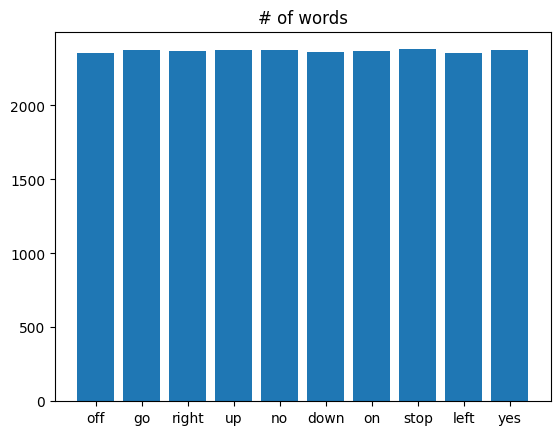

In [ ]:
dir_path = r"./train/audio"

target_words = ['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']
word_list  = [x[0] for x in os.walk(dir_path) if x[0] != dir_path]
word_count = []
words = []
file_count_sum = 0
for directory in os.walk(dir_path):
    if directory[0] != dir_path:
        word = os.path.basename(directory[0])
        file_count = len(glob.glob(os.path.join(directory[0],"*.wav")))
        file_count_sum += file_count
        print(word, "\t" , file_count)
        if word in target_words:
            word_count.append(file_count)
            words.append(word)
print(f'# of files: {file_count_sum}')

x = np.arange(len(words))
plt.bar(x, word_count)
plt.xticks(x, words)
plt.title('# of words')
plt.savefig('word_distribution.png')
plt.show()

길이 체크

In [ ]:
dict.fromkeys(target_words, 0)

{'down': 0,
 'go': 0,
 'left': 0,
 'no': 0,
 'off': 0,
 'on': 0,
 'right': 0,
 'stop': 0,
 'up': 0,
 'yes': 0}

In [ ]:
# 1초 보다 짧거나 긴 wav file check   ---> 9분 정도 소요
data_path = r"./train/audio"
target_words = ['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']

num_of_shorter = dict.fromkeys(target_words, 0) # {'down': 0, 'go': 0, 'left': 0, 'no': 0, 'off': 0, 'on': 0, 'right': 0, 'stop': 0, 'up': 0, 'yes': 0}
num_of_longer = dict.fromkeys(target_words, 0)

for dir in target_words:
    print(dir,'...', end='\t')
    waves = [f for f in os.listdir(os.path.join(data_path, dir)) if f.endswith('.wav')]  # ['004ae714_nohash_0.wav', '004ae714_nohash_1.wav', ...]
    for wav in waves:
        samples, sample_rate = librosa.load(os.path.join(data_path, dir, wav))
        if samples.shape[0] < sample_rate:
            num_of_shorter[dir] += 1
        elif samples.shape[0] > sample_rate:
            num_of_longer[dir] += 1
print()
print('Number of samples shorter than 1 second: ', num_of_shorter)
print('Number of samples longer than 1 second: ', num_of_longer)

down ...	go ...	left ...	no ...	off ...	on ...	right ...	stop ...	up ...	yes ...	
Number of samples shorter than 1 second:  {'down': 207, 'go': 271, 'left': 188, 'no': 277, 'off': 214, 'on': 262, 'right': 212, 'stop': 206, 'up': 313, 'yes': 220}
Number of samples longer than 1 second:  {'down': 0, 'go': 0, 'left': 0, 'no': 0, 'off': 0, 'on': 0, 'right': 0, 'stop': 0, 'up': 0, 'yes': 0}


문제가 있는 데이터를 포함하고 있다.

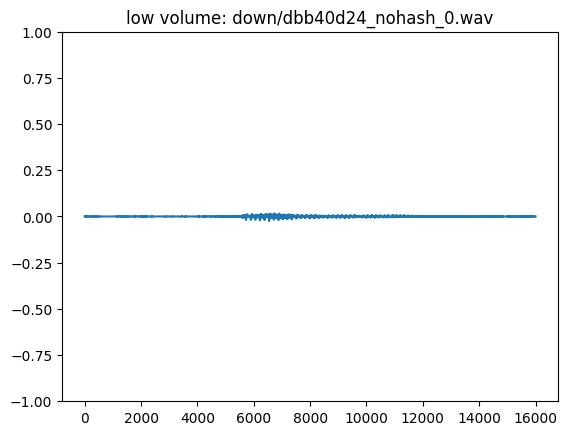

In [ ]:
# volume이 낮아 잘 안 들린다.  --> normalization 하면 들린다.
a,sr=torchaudio.load('train/audio/down/dbb40d24_nohash_0.wav')  # a: (1,16000)
ipd.display(ipd.Audio(a,rate=sr))  # ipd.Audio은 내부에서 normalization이 자동으로 이루어진다.
plt.plot(a[0])
plt.ylim([-1,1])
plt.title('low volume: down/dbb40d24_nohash_0.wav')
plt.savefig('low_volume.png')


ipd.Audio(a/a.max(),rate=sr) # normalization

소리가 없다.

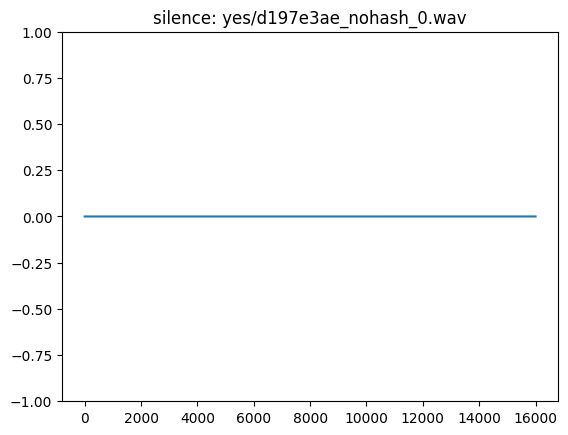

In [ ]:
# 소리가 없다.  --> normalization하면 noise로 들린다.
a,sr=torchaudio.load('train/audio/yes/d197e3ae_nohash_0.wav')

plt.plot(a[0])
plt.ylim([-1,1])
plt.title('silence: yes/d197e3ae_nohash_0.wav')
plt.savefig('silence.png')

ipd.Audio(a/a.max(),rate=16000)

1초보다 짧다.

In [ ]:
# 1초보다 짧은 것
a,sr=torchaudio.load('train/audio/yes/004ae714_nohash_1.wav')
a.shape

torch.Size([1, 14861])

값이 모두 0보다 작은 음수로 되어 있다.

max: -0.137420654296875


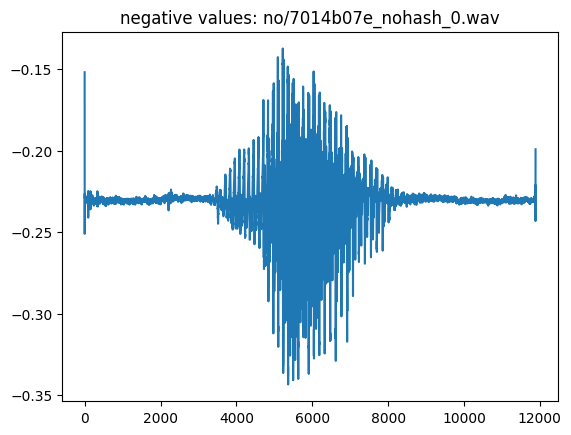

In [ ]:
a,sr=torchaudio.load('train/audio/no/7014b07e_nohash_0.wav')
print(f'max: {a.max()}')
plt.plot(a[0])
plt.title('negative values: no/7014b07e_nohash_0.wav')
plt.savefig('negative_values.png')

ipd.Audio(a/a.max(),rate=16000)

## 9.5.2 Speech Command Pytorch Dataset 만들기
- SPEECHCOMMANDS를 사용하지 않고, 직접 Dataset을 만들어 보자.
- mel-spectrogram, stft 2가지 feature를 선택할 수 있게 구현해보자.

In [ ]:
import torch
import torchaudio
import torchaudio.transforms as T
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import numpy as np
import os
import random
import glob
import IPython.display as ipd
import matplotlib.pyplot as plt

In [ ]:
target_words = ['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']

- subset == "validation": validation_list.txt에 있는 파일들로 Dataset을 만든다.
- subset == "testing": testing_list.txt에 있는 파일들로 Dataset을 만든다.
- subset == "training": validation_list.txt, testing_list.txt에 없는 wav 파일들로 Dataset이 만들어진다.
- subset==None: test 디렉토리에 label이 없는 데이터를 만든다. kaggle submission에 필요한 Dataset을 만든다.

In [ ]:
class SpeechCommandDataset(Dataset):
    def __init__(self,hp, target_words, data_path, subset='training', add_noise_flag=False, add_silence_flag=False, unknown_muliplier=1.0, silence_ratio=0.1):
        # subset: training, validation, testing
        self.hp = hp
        self.path = data_path
        self.target_words = target_words

        if subset in ['training', 'validation', 'testing']:
            self.label_flag = True
            if subset == "validation":
                self.filenames = self.load_list("validation_list.txt")

            elif subset == "testing":
                self.filenames = self.load_list("testing_list.txt")

            elif subset == "training":
                exclude = self.load_list("validation_list.txt", "testing_list.txt")

                exclude = [self.get_label_path(p) for p in exclude]

                all_files = glob.glob(os.path.join(self.path,'*/*.wav'))
                self.filenames = [x for x in all_files if self.get_label_path(x) not in exclude and '_background_noise_' not in x]

            unknown = [x for x in self.filenames if os.path.split(os.path.dirname(x))[-1] not in self.target_words]
            self.filenames = [x for x in self.filenames if os.path.split(os.path.dirname(x))[-1] in self.target_words]

            random.shuffle(unknown)
            self.filenames.extend(unknown[:int(unknown_muliplier*len(self.filenames)//len(self.target_words))])
        else:
            # no label data
            self.label_flag = False
            add_noise_flag = False # 강제 조정.
            self.filenames = glob.glob(os.path.join(self.path,'*.wav'))

        self.add_noise_flag=add_noise_flag
        self.background_noise_files = glob.glob(os.path.join(self.path, '_background_noise_','*.wav'))

        # silence
        self.add_silence_flag = add_silence_flag
        if self.add_silence_flag:
            self.n_silence = int(len(self.filenames)*silence_ratio)
        else: self.n_silence = 0

        self.word_to_ind={}
        self.ind_to_word={}

        for i, word in enumerate( ['silence'] + self.target_words + ['unknown']):
            self.ind_to_word[i] = word
            self.word_to_ind[word] = i

        if self.label_flag:
            self.gen_labels() # self.labels 생성

        self.load_backgound_noise_waveforms() # background noise file 로드

        if hp['feature'] == 'stft':
            self.transform = T.Spectrogram(
                n_fft=hp['n_fft'],
                win_length=hp['win_length'],
                hop_length=hp['hop_length'],
                center=True,
                pad_mode="reflect",
                power=2.0,
            )
        elif hp['feature'] == 'mel':
            self.transform = T.MelSpectrogram(
                sample_rate=hp['sr'],
                n_fft=hp['n_fft'],
                win_length=hp['win_length'],
                hop_length=hp['hop_length'],
                center=True,
                pad_mode="reflect",
                power=2.0,
                norm="slaney",
                onesided=True,
                n_mels=hp['n_mels'],
                mel_scale="slaney",
            )
        else:
            print(f'check preprocessing: {hp["feature"]}')
            exit()

        self.power_to_db = T.AmplitudeToDB(stype="power", top_db=80)

    def load_list(self,*filenames):
        output = []
        for filename in filenames:
            filepath = os.path.join(self.path, filename)
            with open(filepath) as f:
                for line in f.readlines():
                    output.append(os.path.normpath(os.path.join(self.path, line.strip())))

        return output

    def get_label_path(self,full_filename):
        # './train/audio/four/638685f2_nohash_0.wav'  -->  'four/638685f2_nohash_0.wav'
        return os.path.join(os.path.basename(os.path.dirname(full_filename)), os.path.basename(full_filename))

    def gen_labels(self):
        # self.labels 생성
        self.labels = []
        for file in self.filenames:
            word = os.path.split(os.path.dirname(file))[-1]
            if word in self.target_words:
                self.labels.append(self.word_to_ind[word])
            else:
                self.labels.append(self.word_to_ind['unknown'])

    def load_backgound_noise_waveforms(self):
        self.background_noise_files = glob.glob(os.path.join(self.path, '_background_noise_','*.wav'))
        self.backgound_noise_waveforms = []
        for noise_file in self.background_noise_files:
            w,sr = torchaudio.load(noise_file)
            self.backgound_noise_waveforms.append(w/w.max())

    def add_noise(self, waveform, noise_prob):
        # waveform: 2d Pytorch Tensor (1,16000)
        time_shift = self.hp['max_time_shift'] * self.hp['sr']

        length = waveform.shape[-1]
        if length != self.hp['sr']:
            waveform = F.pad(waveform,[0, self.hp['sr']-length])[:, :self.hp['sr']]
            length = self.hp['sr']
        if time_shift > 0:
            shift_amount = np.random.randint(-time_shift, time_shift)
            if shift_amount>=0:
                waveform = F.pad(waveform,[shift_amount,0])[:, :length]
            else:
                waveform = F.pad(waveform,[0,-shift_amount])[:, -length:]

        if np.random.rand() < noise_prob:
            selected_backgound_noise = random.choice(self.backgound_noise_waveforms)
            noise_length = selected_backgound_noise.shape[-1]
            noise_point = np.random.randint(noise_length-length)
            noise_ratio = self.hp['max_noise_volume'] * np.random.rand()
            waveform = waveform + noise_ratio*selected_backgound_noise[:, noise_point: noise_point + length]

        waveform = waveform / (waveform.abs().max() + 0.001) # normalization, 0.01을 더해주어야 한다.
        return waveform

    def __len__(self):
        return len(self.filenames) + self.n_silence

    def __getitem__(self,i):
        if i < len(self.filenames):
            waveform, _ = torchaudio.load(self.filenames[i])
            noise_prob = self.hp['noise_prob']  if self.add_noise_flag else 0.0
            waveform = self.add_noise(waveform,noise_prob)
            stft = self.power_to_db(self.transform(waveform))

            self.selected_filename = self.filenames[i]  # 확인용 임시
            if self.label_flag:
                return waveform, stft, self.labels[i]
            else:
                return waveform, stft, os.path.basename(self.filenames[i])
        else: # silence
            waveform = torch.zeros(1,hp['sr'])
            waveform = self.add_noise(waveform, 1.0)
            stft = self.power_to_db(self.transform(waveform))
            self.selected_filename = None
            if self.label_flag:
                return waveform, stft, self.word_to_ind['silence']
            else:
                return waveform, stft, None

In [ ]:
hp = { 'sr': 16000,
        'n_fft': 512,
        'win_length': 480,
        'hop_length': 160,
        'noise_prob': 0.5,
        'max_noise_volume': 0.8,
        'max_time_shift': 0.1, # second
        'n_mels': 80,
        'feature': 'stft', # ['mel','stft]
}

In [ ]:
dataset = SpeechCommandDataset(hp,target_words,'./train/audio',subset='validation',add_noise_flag=True, add_silence_flag=True)
dataloader = DataLoader(dataset, batch_size=128,shuffle=True,drop_last=False)

In [ ]:
waveform, stft, label = dataset[np.random.randint(len(dataset))]
print(waveform.shape, dataset.ind_to_word[label],"==>", dataset.selected_filename)
ipd.Audio(waveform,rate=hp['sr'])

torch.Size([1, 16000]) on ==> train/audio/on/dd086776_nohash_0.wav


In [ ]:
waveforms, stfts, labels = next(iter(dataloader))
waveforms.shape, stfts.shape, labels

(torch.Size([128, 1, 16000]),
 torch.Size([128, 1, 257, 101]),
 tensor([ 2,  3,  6,  8,  9, 10,  7,  1,  1,  0, 10, 10,  4,  6,  7,  0,  7,  9,
          1,  3,  3,  4,  7,  0,  9,  5,  0,  9, 11,  1,  4,  3,  5, 10,  3,  8,
          1,  6,  0,  7, 11, 11,  5,  4,  1,  9, 10, 11,  1,  4,  6,  6,  6,  3,
          4, 11, 11,  3,  0,  2,  9,  1,  6,  1, 10,  9, 10,  2,  2,  4,  4,  3,
          3, 11, 11,  8,  7,  0, 11,  3, 11,  6,  8,  3,  4,  0,  7,  3,  5,  7,
          2, 11,  4, 11,  9,  7,  9,  9,  9,  4,  2,  7,  0,  8,  9,  1,  9,  1,
         10, 10,  4,  0,  2,  6,  0,  2,  7,  1,  4, 11,  8,  5,  6,  2,  6, 10,
          6, 11]))

## 9.5.3 Model - Resnet, Densenet

In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import time

In [ ]:
class Resnet(torch.nn.Module):
    def __init__(self, n_class):
        super(Resnet, self).__init__()
        self.pre_conv = torch.nn.Conv2d(1,3,kernel_size=1, stride=1)
        self.resnet = models.resnet18(weights=None)
        self.resnet.fc = torch.nn.Linear(self.resnet.fc.in_features,n_class)
    def forward(self,x):
        output = self.pre_conv(x)
        logit = self.resnet(output)
        return logit

class Densenet(torch.nn.Module):
    def __init__(self, n_class, size=224):
        super(Densenet, self).__init__()
        self.resize = transforms.Resize((size,size))
        self.pre_conv = torch.nn.Conv2d(1,3,kernel_size=1, stride=1)
        self.densenet = models.densenet121(weights=None)
        self.densenet.classifier = torch.nn.Linear(self.densenet.classifier.in_features,n_class)
    def forward(self,x):
        x = self.resize(x)
        output = self.pre_conv(x)
        logit = self.densenet(output)
        return logit

In [ ]:
# Model Test
model = Resnet(n_class = 12)
waveforms, stfts, labels = next(iter(dataloader))
out = model(stfts)
out.shape

torch.Size([128, 12])

## 9.5.4 Model 훈련

### Resnet Model Train(STFT)

In [ ]:
def train_pytorch_model(model,optimizer,loss_fn,train_dl, valid_dl,n_epochs,device,initial_epoch=0):
    s_time = time.time()
    model.to(device)
    for epoch in range(n_epochs):
        running_loss = []
        acc = 0
        total = 0
        model.train()
        for i, data in enumerate(train_dl):
            _, stfts, labels = data
            stfts = stfts.to(device)
            labels = labels.to(device)

            optimizer.zero_grad() # zero the parameter gradients

            outputs = model(stfts)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()

            _, pred = outputs.max(axis=-1)
            acc  += (pred==labels).float().sum().item()
            total += len(labels)

            running_loss.append(loss.item())
        print(f'[epoch: {initial_epoch+epoch+1}] loss: {np.mean(running_loss):.4f}, train acc: {acc/total:.4f} elapsed: {time.time()-s_time:.2f}sec\t',end='')

        acc = 0
        total=0
        model.eval()
        with torch.no_grad():
            for i, data in enumerate(valid_dl):
                _, stfts, labels = data
                stfts = stfts.to(device)
                outputs = model(stfts)

                _, pred = outputs.max(axis=-1)
                acc  += (pred.cpu()==labels).float().sum().item()
                total += len(labels)
            print(f'validation acc: {acc/total:.4f}')

    print('Finished Training')
def torch_reset_seed(seed=100):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        # torch.backends.cudnn.deterministic = True  # 속도 저하
        # torch.backends.cudnn.benchmark = False     # 속도 저하

Train - Resnet(STFT)

In [ ]:
seed = 100
np.random.seed(seed)
random.seed(seed)
torch_reset_seed(seed)  # 코드 !\ref{code:010}! 참조.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device: ", device)

# hyper parameters
hp = { 'sr': 16000,
        'n_fft': 512,
        'win_length': 480,
        'hop_length': 160,
        'noise_prob': 0.5,
        'max_noise_volume': 0.8,
        'max_time_shift': 0.1, # second
        'n_mels': 80,
        'feature': 'stft', # ['mel','stft]
        }

# Dataset, DataLoader
data_path = r"./train/audio"
train_dataset = SpeechCommandDataset(hp,target_words,data_path,subset='training',
                                     add_noise_flag=True, add_silence_flag=True,unknown_muliplier=1.5, silence_ratio=0.2)
train_dataloader = DataLoader(train_dataset, batch_size=128,shuffle=True,drop_last=False)

val_dataset = SpeechCommandDataset(hp,target_words,data_path,subset='validation',add_noise_flag=False, add_silence_flag=True)
val_dataloader = DataLoader(val_dataset, batch_size=128,shuffle=False,drop_last=False)

device:  cpu


In [ ]:
model = Resnet(n_class = 12)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

n_epochs = 50

In [ ]:
train_pytorch_model(model,optimizer,loss_fn,train_dataloader,val_dataloader,n_epochs,device)

[epoch: 1] loss: 1.6244, train acc: 0.4654 elapsed: 88.35sec	validation acc: 0.6554
[epoch: 2] loss: 0.6625, train acc: 0.7990 elapsed: 166.92sec	validation acc: 0.8120
[epoch: 3] loss: 0.5206, train acc: 0.8479 elapsed: 244.89sec	validation acc: 0.9198
[epoch: 4] loss: 0.4480, train acc: 0.8696 elapsed: 323.32sec	validation acc: 0.9095
[epoch: 5] loss: 0.4224, train acc: 0.8787 elapsed: 401.91sec	validation acc: 0.9076
[epoch: 6] loss: 0.4074, train acc: 0.8833 elapsed: 479.87sec	validation acc: 0.9025
[epoch: 7] loss: 0.3844, train acc: 0.8876 elapsed: 557.91sec	validation acc: 0.9275
[epoch: 8] loss: 0.3693, train acc: 0.8960 elapsed: 636.62sec	validation acc: 0.9047
[epoch: 9] loss: 0.3534, train acc: 0.9001 elapsed: 714.47sec	validation acc: 0.9429
[epoch: 10] loss: 0.3419, train acc: 0.9034 elapsed: 792.48sec	validation acc: 0.9265
[epoch: 11] loss: 0.3320, train acc: 0.9070 elapsed: 870.98sec	validation acc: 0.9086
[epoch: 12] loss: 0.3234, train acc: 0.9088 elapsed: 948.83sec	v

In [ ]:
# 모델 저장.
torch.save(model.state_dict(), f"model_resnet_stft_epoch_{n_epochs}.pt")

Test - Resnet(STFT)
- subset='testing' 데이터로 test

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
seed = 100
np.random.seed(seed); random.seed(seed); torch_reset_seed(seed)
hp_test = hp.copy()
hp_test['max_time_shift'] = 0
test_dataset = SpeechCommandDataset(hp_test,target_words,data_path,subset='testing',add_noise_flag=False, add_silence_flag=True)
test_dataloader = DataLoader(test_dataset, batch_size=128,shuffle=False,drop_last=False)

In [ ]:
# silence가 포함되면, randomness가 있기 때문에, 실행할 때마다 결과가 조금씩 달라진다.
acc = 0; total=0
y_true = []; y_pred = []
model.eval()
with torch.no_grad():
    for i, data in enumerate(test_dataloader):
        _, stfts, labels = data
        stfts = stfts.to(device)
        outputs = model(stfts)

        _, pred = outputs.max(axis=-1)
        acc  += (pred.cpu()==labels).float().sum().item()
        total += len(labels)

        y_true.extend(labels.numpy())
        y_pred.extend(pred.cpu().numpy())
    print(f'test acc: {acc/total:.4f}')

test acc: 0.9636


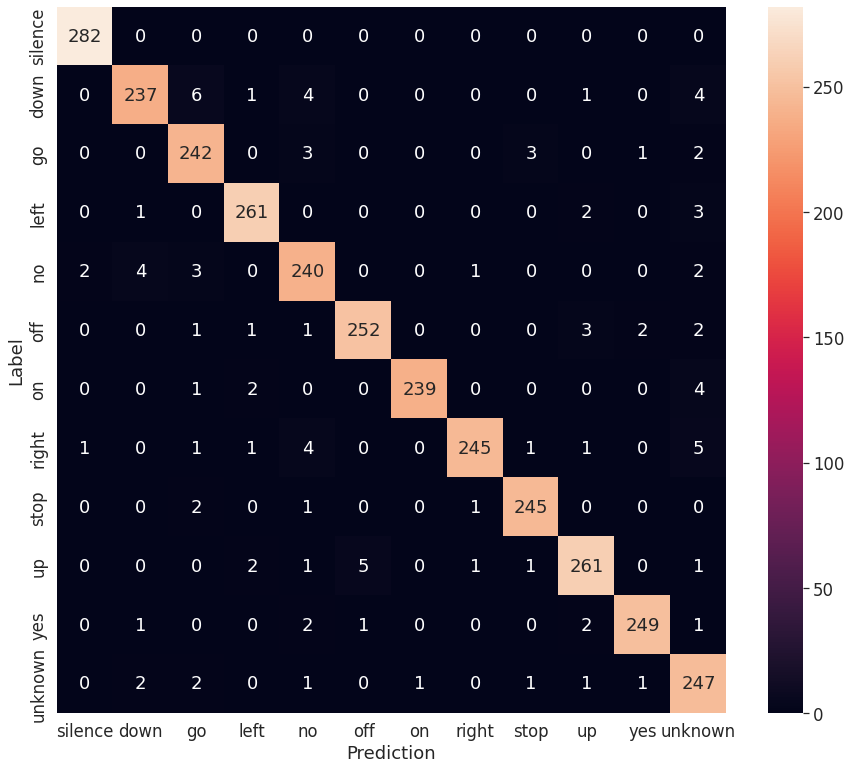

In [ ]:
confusion_mtx = confusion_matrix(y_true, y_pred)
ticklabels = list(test_dataset.word_to_ind.keys())
plt.figure(figsize=(15, 13))
sns.set(font_scale=1.5)
sns.heatmap(confusion_mtx,
            xticklabels=ticklabels,
            yticklabels=ticklabels,
            annot=True, fmt='g')
plt.xlabel('Prediction')
plt.ylabel('Label')
plt.savefig('speech_command_test_data_confusion_matrix.png')
plt.show()

### Resnet Model Train(Mel)

Train - Resnet(Mel)

In [ ]:
seed = 100
np.random.seed(seed)
random.seed(seed)
torch_reset_seed(seed)  # 코드 !\ref{code:010}! 참조.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device: ", device)

# hyper parameters
hp = { 'sr': 16000,
        'n_fft': 512,
        'win_length': 480,
        'hop_length': 160,
        'noise_prob': 0.5,
        'max_noise_volume': 0.8,
        'max_time_shift': 0.1, # second
        'n_mels': 80,
        'feature': 'mel', # ['mel','stft]
        }

# Dataset, DataLoader
data_path = r"./train/audio"
train_dataset = SpeechCommandDataset(hp,target_words,data_path,subset='training',add_noise_flag=True, add_silence_flag=True)
train_dataloader = DataLoader(train_dataset, batch_size=128,shuffle=True,drop_last=False)

val_dataset = SpeechCommandDataset(hp,target_words,data_path,subset='validation',add_noise_flag=False, add_silence_flag=True)
val_dataloader = DataLoader(val_dataset, batch_size=128,shuffle=False,drop_last=False)

device:  cuda


In [ ]:
model = Resnet(n_class = 12)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

n_epochs = 50

In [ ]:
train_pytorch_model(model,optimizer,loss_fn,train_dataloader,val_dataloader,n_epochs,device)

[epoch: 1] loss: 1.0856, train acc: 0.6425 elapsed: 51.27sec	validation acc: 0.8303
[epoch: 2] loss: 0.5635, train acc: 0.8274 elapsed: 94.89sec	validation acc: 0.8345
[epoch: 3] loss: 0.4806, train acc: 0.8540 elapsed: 138.09sec	validation acc: 0.9172
[epoch: 4] loss: 0.4460, train acc: 0.8674 elapsed: 182.01sec	validation acc: 0.9031
[epoch: 5] loss: 0.4199, train acc: 0.8762 elapsed: 225.68sec	validation acc: 0.9038
[epoch: 6] loss: 0.3945, train acc: 0.8827 elapsed: 269.83sec	validation acc: 0.9384
[epoch: 7] loss: 0.3776, train acc: 0.8876 elapsed: 313.78sec	validation acc: 0.9342
[epoch: 8] loss: 0.3608, train acc: 0.8939 elapsed: 358.33sec	validation acc: 0.9394
[epoch: 9] loss: 0.3543, train acc: 0.8955 elapsed: 401.92sec	validation acc: 0.9381
[epoch: 10] loss: 0.3465, train acc: 0.8981 elapsed: 446.22sec	validation acc: 0.9153
[epoch: 11] loss: 0.3439, train acc: 0.8992 elapsed: 489.96sec	validation acc: 0.9464
[epoch: 12] loss: 0.3254, train acc: 0.9053 elapsed: 533.86sec	va

In [ ]:
# 모델 저장.
torch.save(model.state_dict(), f"model_mel_epoch_{n_epochs}.pt")

Test - Resnet(Mel)

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
seed = 100
np.random.seed(seed); random.seed(seed); torch_reset_seed(seed)
hp_test = hp.copy()
hp_test['max_time_shift'] = 0
test_dataset = SpeechCommandDataset(hp_test,target_words,data_path,subset='testing',add_noise_flag=False, add_silence_flag=True)
test_dataloader = DataLoader(test_dataset, batch_size=128,shuffle=False,drop_last=False)

In [ ]:
# silence가 포함되면, randomness가 있기 때문에, 실행할 때마다 결과가 조금씩 달라진다.
acc = 0; total=0
y_true = []; y_pred = []
model.eval()
with torch.no_grad():
    for i, data in enumerate(test_dataloader):
        _, stfts, labels = data
        stfts = stfts.to(device)
        outputs = model(stfts)

        _, pred = outputs.max(axis=-1)
        acc  += (pred.cpu()==labels).float().sum().item()
        total += len(labels)

        y_true.extend(labels.numpy())
        y_pred.extend(pred.cpu().numpy())
    print(f'test acc: {acc/total:.4f}')

test acc: 0.9639


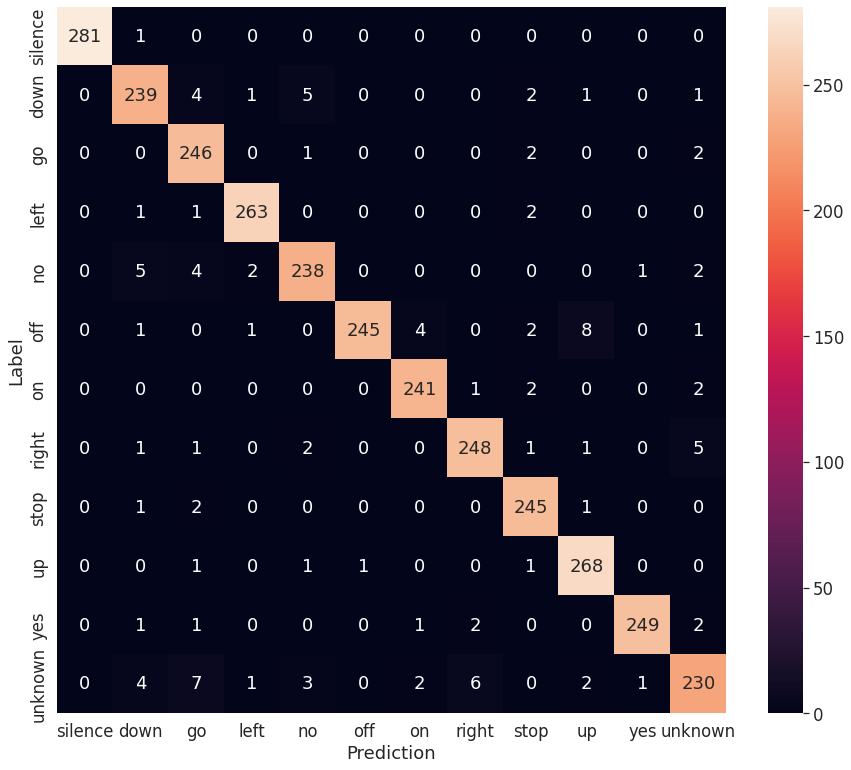

In [ ]:
confusion_mtx = confusion_matrix(y_true, y_pred)
ticklabels = list(test_dataset.word_to_ind.keys())
plt.figure(figsize=(15, 13))
sns.set(font_scale=1.5)
sns.heatmap(confusion_mtx,
            xticklabels=ticklabels,
            yticklabels=ticklabels,
            annot=True, fmt='g')
plt.xlabel('Prediction')
plt.ylabel('Label')
plt.savefig('speech_command_test_data_confusion_matrix.png')
plt.show()

### Densenet Model Train(STFT)

In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import time

In [ ]:
seed = 100
np.random.seed(seed)
random.seed(seed)
torch_reset_seed(seed)  # 코드 !\ref{code:010}! 참조.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device: ", device)

# hyper parameters
hp = { 'sr': 16000,
        'n_fft': 512,
        'win_length': 480,
        'hop_length': 160,
        'noise_prob': 0.5,
        'max_noise_volume': 0.8,
        'max_time_shift': 0.1, # second
        'n_mels': 80,
        'feature': 'stft', # ['mel','stft]
        }

# Dataset, DataLoader
data_path = r"./train/audio"
train_dataset = SpeechCommandDataset(hp,target_words,data_path,subset='training',add_noise_flag=True, add_silence_flag=True)
train_dataloader = DataLoader(train_dataset, batch_size=64,shuffle=True,drop_last=False)

val_dataset = SpeechCommandDataset(hp,target_words,data_path,subset='validation',add_noise_flag=False, add_silence_flag=True)
val_dataloader = DataLoader(val_dataset, batch_size=64,shuffle=False,drop_last=False)

In [ ]:
model = Densenet(n_class = 12,size=224)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

n_epochs = 15

In [ ]:
train_pytorch_model(model,optimizer,loss_fn,train_dataloader,val_dataloader,n_epochs,device)

In [ ]:
# 모델 저장.
torch.save(model.state_dict(), f"model_densenet_stft_epoch_{50}.pt")

## 9.5.5 Kaggle Submission
- test.7z는 158538개의 파일이 압축되어 있다.
- colab에서 압축을 풀어보면, 1시간 이상 소요되어 시스템이 다운된다.
- local PC에서 실행하는 것이 좋다.

In [ ]:
!7z x test.7z  # 1시간 이상 소요 ==> colab 다운  ==> 실패

In [ ]:
# 약 500개 파일만으로 audio.zip 파일을 만들어 테스트해 볼 수 있다.
#!unzip audio.zip -d test/audio/

In [ ]:
import pandas as pd

Resnet  --> kaggle submission 파일 생성하기

In [ ]:
# 저장된 모델 불러오기
model_filename = 'model_resnet_stft_epoch_50.pt'
output_filename = 'resnet_stft_epoch_50.csv'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'device: {device}')

model_resnet = Resnet(n_class = 12)
model_resnet.load_state_dict(torch.load(model_filename,map_location = torch.device(device)))

device: cpu


<All keys matched successfully>

In [ ]:
hp_test = { 'sr': 16000,
        'n_fft': 512,
        'win_length': 480,
        'hop_length': 160,
        'noise_prob': 0.5,
        'max_noise_volume': 0.8,
        'max_time_shift': 0.0, # second
        'n_mels': 80,
        'feature': 'stft', # ['mel','stft]
}

In [ ]:
data_path = r"./test/audio"
dataset = SpeechCommandDataset(hp_test, target_words,data_path,subset=None,add_noise_flag=False,add_silence_flag=False)
dataloader = DataLoader(dataset, batch_size=128,shuffle=False,drop_last=False)

filenames = []; y_pred = []
model_resnet.eval()
s_time = time.time()
with torch.no_grad():
    for i, data in enumerate(dataloader):
        _, stfts, file = data
        stfts = stfts.to(device)
        outputs = model_resnet(stfts)

        _, pred = outputs.max(axis=-1)
        y_pred.extend(pred.cpu().numpy()) # list extend(): 2개 list 결합
        filenames.extend(file)
        if i%100==0:
            print(f'{i}/{len(dataloader)}, {time.time()-s_time}')

pred = [dataset.ind_to_word[x] for x in y_pred]

pd.DataFrame({'fname': filenames, 'label': pred}).to_csv(output_filename, index=False)

0/3, 10.940534353256226


Densent  --> kaggle submission 파일 생성하기


In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import time

In [ ]:
# 저장된 모델 불러오기
model_filename = 'model_densenet_stft_epoch_50.pt'
output_filename = 'densenet_stft_epoch_50.csv'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'device: {device}')

model_densenet = Densenet(n_class = 12,size=224)
model_densenet.load_state_dict(torch.load(model_filename,map_location = torch.device(device)))

device: cpu


<All keys matched successfully>

In [ ]:
hp_test = { 'sr': 16000,
        'n_fft': 512,
        'win_length': 480,
        'hop_length': 160,
        'noise_prob': 0.5,
        'max_noise_volume': 0.8,
        'max_time_shift': 0.0, # second
        'n_mels': 80,
        'feature': 'stft', # ['mel','stft]
}

In [ ]:
data_path = r"./test/audio"
dataset = SpeechCommandDataset(hp_test, target_words,data_path,subset=None,add_noise_flag=False,add_silence_flag=False)
dataloader = DataLoader(dataset, batch_size=128,shuffle=False,drop_last=False)

filenames = []; y_pred = []
model_densenet.eval()
s_time = time.time()
with torch.no_grad():
    for i, data in enumerate(dataloader):
        _, stfts, file = data
        stfts = stfts.to(device)
        outputs = model_densenet(stfts)

        _, pred = outputs.max(axis=-1)
        y_pred.extend(pred.cpu().numpy()) # list extend(): 2개 list 결합
        filenames.extend(file)
        if i%100==0:
            print(f'{i}/{len(dataloader)}, {time.time()-s_time}')

pred = [dataset.ind_to_word[x] for x in y_pred]

pd.DataFrame({'fname': filenames, 'label': pred}).to_csv(output_filename, index=False)

0/3, 31.84156847000122


In [ ]:
filenames = []; y_pred = []
model_densenet.eval()
s_time = time.time()
with torch.no_grad():
    for i, data in enumerate(dataloader):
        _, stfts, file = data
        stfts = stfts.to(device)
        outputs = model_densenet(stfts)

# 9.6 Tensorflow Audio 처리
- pip install tensorflow-io
- tensorflow(2.9.2) + tensorflow-io(0.26)
- tensorflow(2.10) + tensorflow-io(0.27)
- tensorflow(2.13) + tensorflow-io(0.34)
- https://github.com/tensorflow/io#tensorflow-version-compatibility

In [ ]:
!pip install tensorflow-io==0.34
# sox 설치
!apt-get install sox
!pip install sox
!apt install tree

## audio 데이터 다루기 - tensorflow

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import sox
import tensorflow_io as tfio

In [ ]:
tf.__version__, tfio.__version__

('2.13.0', '0.34.0')

In [ ]:
filename = 'LJ001-0001.wav' # 'kss_1_0000.wav', 'LJ001-0001.wav', 'LJ001-0001-8bit.wav'

print(f'sampling rate: {sox.file_info.sample_rate(filename)}') # 22050, 44100, ...
print(f'bit depth: {sox.file_info.bitdepth(filename)}') # 16
print(f'channels: {sox.file_info.channels(filename)}') # 1 ~또는~ 2
print(f'bit rate: {sox.file_info.bitrate(filename)}')

sample, sampling_rate = tf.audio.decode_wav(tf.io.read_file(filename), desired_channels=-1,desired_samples=213000)  # batch 처리는 안된다.
print(sample.shape, sampling_rate)

sampling rate: 44100.0
bit depth: 16
channels: 2
bit rate: 1410000.0
(213000, 2) tf.Tensor(44100, shape=(), dtype=int32)


## 9.6.1 tf.audio API

In [ ]:
if sample.shape[-1]==1:
    x = tf.squeeze(sample)
else:
    x = tf.reduce_mean(sample, axis=-1)
    print(f'sample: {sample.shape}, x: {x.shape}')
    rfft1 = tf.signal.rfft([x,x,x],[1024])
    rfft2 = tf.signal.rfft(x,[1024])

    print('rfft shape: ', rfft1.shape, rfft2.shape)

    stft1 = tf.signal.stft([x,x,x],frame_length=1024,frame_step=256)
    stft2 = tf.signal.stft(x,frame_length=1024,frame_step=256)

    print('stft shape: ', stft1.shape, stft2.shape)

sample: (213000, 2), x: (213000,)
rfft shape:  (3, 513) (513,)
stft shape:  (3, 829, 513) (829, 513)


mel-spectrogram

In [ ]:
def get_spectrogram(waveform,frame_length,frame_step):
    assert waveform.ndim==1
    stft = tf.signal.stft(waveform, frame_length=frame_length, frame_step=frame_step, pad_end=True)

    magnitude_spectrogram = tf.abs(stft)
    return magnitude_spectrogram  # (n_frame,D)

def get_log_spectrogram(waveform,frame_length,frame_step):
    assert waveform.ndim==1
    stft = tf.signal.stft(waveform, frame_length=frame_length, frame_step=frame_step, pad_end=True)

    power_spectrogram = tf.square(tf.abs(stft)) # power spectrogram
    log_spectrogram = tf_power_to_db(power_spectrogram,ref=tf.reduce_max)
    return log_spectrogram  # (n_frame,D)

def tf_power_to_db(S,ref=1.0,amin=1e-10,top_db=80):
    if callable(ref):
        ref_value = ref(S)
    else:
        ref_value = tf.abs(ref)
    log_spectrogram = 10*tf.experimental.numpy.log10(tf.math.maximum(amin, S)/tf.math.maximum(amin, ref_value))
    log_spectrogram = tf.maximum(log_spectrogram, tf.reduce_max(log_spectrogram) - top_db)

    return log_spectrogram

def tf_log_mel_spectrogram(waveform,frame_length,frame_step,sampling_rate,mel_filter=None):
    if mel_filter is None:
        mel_filter = tf.signal.linear_to_mel_weight_matrix(num_mel_bins=nfilt,
                            num_spectrogram_bins=num_spectrogram_bins,
                            sample_rate=sampling_rate,lower_edge_hertz=lower_edge_hertz,
                            upper_edge_hertz = upper_edge_hertz)
    stft = tf.signal.stft(waveform, frame_length=frame_length, frame_step=frame_step, pad_end=True)
    power_spectrogram = tf.square(tf.abs(stft))

    mel_spectrogram = tf.matmul(power_spectrogram,mel_filter)
    log_mel_spectrogram = tf_power_to_db(mel_spectrogram,ref=tf.reduce_max)
    return log_mel_spectrogram

In [ ]:
filename = 'LJ001-0001.wav'  # 'kss_1_0000.wav' 'LJ001-0001.wav'
sample, sampling_rate_origin = tf.audio.decode_wav(tf.io.read_file(filename), desired_channels=1)
sampling_rate_origin = sampling_rate_origin.numpy()
print(sample.shape, sampling_rate_origin)

sampling_rate = 16000
sample2 = tfio.audio.resample(sample, sampling_rate_origin, sampling_rate)
print(sample2.shape)

sample2 = tf.squeeze(sample2)

frame_length = 512; frame_step=256; n_fft = frame_length; nfilt = 80

spectrogram = get_spectrogram(sample2,frame_length,frame_step)
log_spectrogram = get_log_spectrogram(sample2,frame_length,frame_step)
print(spectrogram.shape, log_spectrogram.shape)

num_spectrogram_bins = n_fft//2 + 1
lower_edge_hertz = 0
upper_edge_hertz = sampling_rate/2  # 가장 높은 값
mel_filter = tf.signal.linear_to_mel_weight_matrix(num_mel_bins=nfilt, num_spectrogram_bins=num_spectrogram_bins,
                    sample_rate=sampling_rate,lower_edge_hertz=lower_edge_hertz,upper_edge_hertz = upper_edge_hertz)
print(mel_filter.shape)

log_mel_spectrogram = tf_log_mel_spectrogram(sample2,frame_length,frame_step,sampling_rate,mel_filter)
print(log_mel_spectrogram.shape)

(212893, 1) 22050
(154480, 1)
(604, 257) (604, 257)
(257, 80)
(604, 80)


(604, 257)


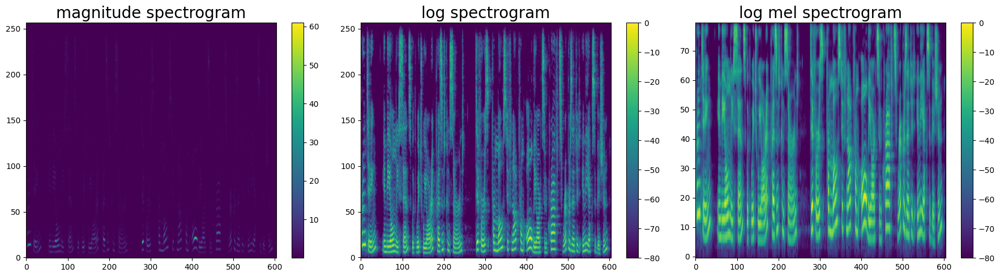

In [ ]:
print(spectrogram.shape)

plt.figure(figsize=(18,5))
plt.subplot(1,3,1)
plt.imshow(spectrogram.numpy().T,origin="lower", aspect="auto")
plt.colorbar()
plt.title('magnitude spectrogram',fontsize=20)

plt.subplot(1,3,2)
plt.imshow(log_spectrogram.numpy().T,origin="lower", aspect="auto")
plt.colorbar()
plt.title('log spectrogram',fontsize=20)

plt.subplot(1,3,3)
plt.imshow(log_mel_spectrogram.numpy().T,origin="lower", aspect="auto")
plt.colorbar()
plt.title('log mel spectrogram',fontsize=20)

plt.tight_layout()
plt.savefig('tf-spectrogram.png')

## 9.6.2 tfio.audio API

(604, 257)


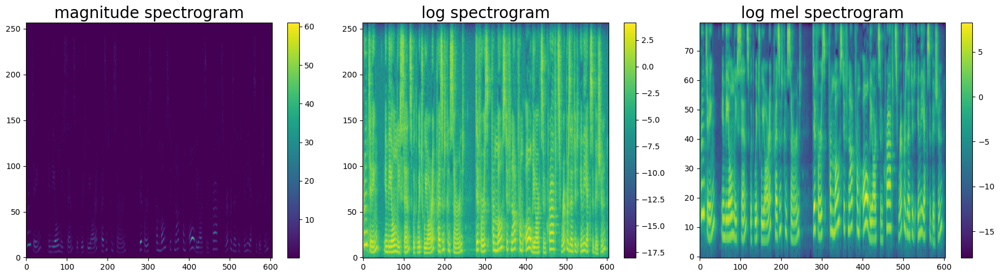

In [ ]:
spectrogram2 = tfio.audio.spectrogram(sample2,n_fft,frame_length,frame_step)  # not power, mangnitude spectrogram
mel_spectrogram2 = tfio.audio.melscale(tf.square(spectrogram2), sampling_rate, nfilt, fmin=0, fmax=sampling_rate/2) # tf.square(spectrogram2)
print(spectrogram2.shape)

plt.figure(figsize=(18,5))
plt.subplot(1,3,1)
plt.imshow(spectrogram2.numpy().T,origin="lower", aspect="auto")
plt.colorbar()
plt.title('magnitude spectrogram',fontsize=20)

plt.subplot(1,3,2)
plt.imshow(np.log(spectrogram2).T,origin="lower", aspect="auto")
plt.colorbar()
plt.title('log spectrogram',fontsize=20)

plt.subplot(1,3,3)
plt.imshow(np.log(mel_spectrogram2).T,origin="lower", aspect="auto")
plt.colorbar()
plt.title('log mel spectrogram',fontsize=20)

plt.tight_layout()
plt.savefig('tfio-spectrogram.png')

# 9.7 Speaker Recognition
Speaker Recognition Dataset은 5명의 정치인들의 음성으로된 데이터이다.
- https://www.kaggle.com/datasets/kongaevans/speaker-recognition-dataset
- https://keras.io/examples/audio/speaker_recognition_using_cnn/

- Benjamin_Netanyau: 0.wav,5.wav,8.wav,9.wav 등이 목소리가 없이 잡음만...

In [ ]:
# kggle.json 파일에 있는 key를 사용하면 된다.
!mkdir /root/.kaggle
!echo '{"username":"my_id","key":"XXXXXX"}' > /root/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d kongaevans/speaker-recognition-dataset

100% 230M/231M [00:13<00:00, 20.7MB/s]
100% 231M/231M [00:13<00:00, 17.9MB/s]


In [ ]:
!unzip -qq speaker-recognition-dataset.zip

In [ ]:
import shutil
import os
import soundfile
import librosa
import glob
import sox
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import IPython.display as ipd
from tensorflow.keras import preprocessing

from tensorflow.keras.layers import experimental
from tensorflow.keras.applications import vgg16
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns

sns.set_theme()

In [ ]:
np.random.seed(123); random.seed(123); tf.random.set_seed(123)

In [ ]:
MODEL_NAME = 'VGG'
#MODEL_NAME = 'SIMPLE-CNN'
#MODEL_NAME = 'RESNET'

if MODEL_NAME == 'VGG':
    NUM_CHANNELS = 3
    LEARNING_RATE = 0.0001
else:
    NUM_CHANNELS = 1
    LEARNING_RATE = 0.001

SAMPLING_RATE = 16000
VALID_SPLIT = 0.1

FRAME_LENGTH = 256
FRAME_STEP = 128

BATCH_SIZE = 64

In [ ]:
# !apt install tree
!tree -d 16000_pcm_speeches

16000_pcm_speeches
├── _background_noise_
├── Benjamin_Netanyau
├── Jens_Stoltenberg
├── Julia_Gillard
├── Magaret_Tarcher
├── Nelson_Mandela
└── other

7 directories


In [ ]:
# https://keras.io/examples/audio/speaker_recognition_using_cnn/
# 다운 받은 디렉토리를 2개의 디렉토리(audio, noise)로 정리해 준다.  ---> 1번만 해주면 된다.
DATASET_ROOT = '16000_pcm_speeches'
AUDIO_SUBFOLDER = 'audio'
NOISE_SUBFOLDER = 'noise'

DATASET_AUDIO_PATH = os.path.join(DATASET_ROOT,AUDIO_SUBFOLDER)
DATASET_NOISE_PATH = os.path.join(DATASET_ROOT,NOISE_SUBFOLDER)

# If folder `audio`, does not exist, create it, otherwise do nothing
os.makedirs(DATASET_AUDIO_PATH,exist_ok=True)

# If folder `noise`, does not exist, create it, otherwise do nothing
os.makedirs(DATASET_NOISE_PATH,exist_ok=True)

counter=0
for folder in os.listdir(DATASET_ROOT): # ~하위 디렉토리와 파일~
    if os.path.isdir(os.path.join(DATASET_ROOT, folder)): # ~파일은 제외~
        if folder in [AUDIO_SUBFOLDER, NOISE_SUBFOLDER]:
            # 'audio', 'noise' ~디렉토리는 제외~
            continue
        elif folder in ["other", "_background_noise_"]:
            # ~noise 파일 옮기기~
            shutil.move(os.path.join(DATASET_ROOT, folder), os.path.join(DATASET_NOISE_PATH, folder))
            counter +=1
        else:
            # ~audio 디렉토리로 옮기기: shutil.move는 overwrite~
            shutil.move(os.path.join(DATASET_ROOT, folder), os.path.join(DATASET_AUDIO_PATH, folder))
            counter +=1

print(f'{counter} directories moved')

7 directories moved


In [ ]:
!tree -d 16000_pcm_speeches

16000_pcm_speeches
├── audio
│   ├── Benjamin_Netanyau
│   ├── Jens_Stoltenberg
│   ├── Julia_Gillard
│   ├── Magaret_Tarcher
│   └── Nelson_Mandela
└── noise
    ├── _background_noise_
    └── other

9 directories


## 9.7.1 noise 파일 sampling rate 변경
- sampling rate 16000으로 변환

In [ ]:
def get_all_noise_files():
    # 모든 noise 파일 path 구하기  --> DATASET_NOISE_PATH 아래에 2개 디렉토리(_background_noise_, other)가 있다.  --> 모두 6개
    noise_paths = glob.glob(os.path.join(DATASET_NOISE_PATH,'*/*.wav'))
    return noise_paths

def convert_sample_rate():
    # 변환전에는 22050,44100이 섞여 있다.
    noise_paths = get_all_noise_files()

    for file in noise_paths:
        print(os.path.basename(file))
        sr = sox.file_info.sample_rate(file)
        print('\t original sr: ',sr)
        if sr != SAMPLING_RATE:
            y,_ = librosa.load(file,sr=SAMPLING_RATE)
            soundfile.write(file, y, SAMPLING_RATE, subtype='PCM_16')

def get_noise_waveforms():
    noise_paths = get_all_noise_files()

    all_waveforms = []
    for file_path in noise_paths:
        audio_binary = tf.io.read_file(file_path) # binary
        waveform,_ = tf.audio.decode_wav(contents=audio_binary,desired_channels=1)
        all_waveforms.append(tf.squeeze(waveform, axis=-1))
    return all_waveforms

In [ ]:
convert_sample_rate()

running_tap.wav
	 original sr:  22050.0
doing_the_dishes.wav
	 original sr:  22050.0
dude_miaowing.wav
	 original sr:  22050.0
10convert.com_Audience-Claps_daSG5fwdA7o.wav
	 original sr:  44100.0
pink_noise.wav
	 original sr:  22050.0
exercise_bike.wav
	 original sr:  22050.0


speaker 정보

In [ ]:
ALL_SPEAKER = sorted(np.array(os.listdir(DATASET_AUDIO_PATH)))  # 이 순서대로 id [0,1,2,3,4]로 변환된다.
ALL_SPEAKER

['Benjamin_Netanyau',
 'Jens_Stoltenberg',
 'Julia_Gillard',
 'Magaret_Tarcher',
 'Nelson_Mandela']

In [ ]:
filenames = glob.glob(os.path.join(DATASET_AUDIO_PATH,'*/*.wav'))
random.shuffle(filenames)
num_samples = len(filenames)
print('Number of total wav files:', num_samples)
for speaker in ALL_SPEAKER:
    print(f'{speaker}: {len(os.listdir(os.path.join(DATASET_AUDIO_PATH,speaker)))}')

Number of total wav files: 7501
Benjamin_Netanyau: 1500
Jens_Stoltenberg: 1500
Julia_Gillard: 1501
Magaret_Tarcher: 1500
Nelson_Mandela: 1500


## 9.7.2 Dataset 생성

In [ ]:
num_val_samples = int(VALID_SPLIT * len(filenames))

train_files = filenames[:-num_val_samples]  # 6751
val_files = filenames[-num_val_samples:]    # 750
print('Training set size', len(train_files))
print('Validation set size', len(val_files))

Training set size 6751
Validation set size 750


In [ ]:
# 6개 noise 파일에서 최대 길이(1522931 = 약 95.18초)로 padding
noise_waveforms = get_noise_waveforms()
noise_waveforms_padded = tf.convert_to_tensor(preprocessing.sequence.pad_sequences(noise_waveforms,dtype='float32',padding='post'))
noise_lengths = tf.constant([len(w) for w in noise_waveforms])
print(noise_waveforms_padded.shape, noise_lengths)

(6, 1522931) tf.Tensor([ 978489 1522931  988892  260686  960000  980063], shape=(6,), dtype=int32)


 - FRAME_STEP = 128   --> n_frame =  1초/FRAME_STEP = sr/FRAME_STEP = 16000/128 = 125
 - FRAME_LENGTH = 256  --> n_fft = 256 --> n_fft/2+1= 129

 (N,125,129,NUM_CHANNELS) 형태의 data가 만들어진다.

In [ ]:
def decode_audio(audio_binary):
    audio, _ = tf.audio.decode_wav(contents=audio_binary,desired_channels=1,desired_samples=SAMPLING_RATE)
    return tf.squeeze(audio, axis=-1)

def get_label(file_path):
    parts = tf.strings.split(input=file_path, sep=os.path.sep)
    return parts[-2]

def get_waveform_and_label_id(file_path):
    label = get_label(file_path)
    audio_binary = tf.io.read_file(file_path) # binary
    waveform = decode_audio(audio_binary)

    label_id = tf.argmax(label == ALL_SPEAKER)

    return waveform, label_id

def add_random_noise(waveform,max_scale=0.8):
    if max_scale > 0:
        num_noise = tf.shape(noise_waveforms_padded)[0]
        random_index = tf.random.uniform((),0,num_noise,dtype=tf.int32)
        sel_noise = noise_waveforms_padded[random_index]
        start = tf.random.uniform(shape=(),minval=0,maxval=noise_lengths[random_index]-SAMPLING_RATE,dtype=tf.int32)
        sel_noise = sel_noise[start:start+SAMPLING_RATE]

        prop = tf.math.reduce_max(waveform) / (tf.math.reduce_max(sel_noise) + 1.0e-6)
        scale = tf.random.uniform(shape=(),minval=0,maxval=max_scale,dtype=tf.float32)
        waveform = waveform + sel_noise * prop * scale

    return waveform

def tf_power_to_db(S,ref=1.0,amin=1e-10,top_db=80):
    if callable(ref):
        ref_value = ref(S)
    else:
        ref_value = tf.abs(ref)
    log_spectrogram = 10*tf.experimental.numpy.log10(tf.math.maximum(amin, S)/tf.math.maximum(amin, ref_value))
    log_spectrogram = tf.maximum(log_spectrogram, tf.reduce_max(log_spectrogram) - top_db)

    return log_spectrogram

def get_log_spectrogram(waveform,frame_length,frame_step):
    stft = tf.signal.stft(waveform, frame_length=frame_length, frame_step=frame_step, pad_end=True)

    power_spectrogram = tf.square(tf.abs(stft)) # power spectrogram
    log_spectrogram = tf_power_to_db(power_spectrogram,ref=tf.reduce_max)
    return log_spectrogram  # (n_frame,D)

def preprocess_dataset(waveform, frame_length, frame_step, num_channel=1):
    spectrogram = get_log_spectrogram(waveform,frame_length, frame_step)

    spectrogram = tf.expand_dims(spectrogram, -1)  # (n_frame,n_fft/2+1) ===> (n_frame,n_fft/2+1,1)
    spectrogram = tf.tile(spectrogram,[1,1,num_channel])

    return spectrogram

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = tf.data.Dataset.from_tensor_slices(train_files)
val_ds = tf.data.Dataset.from_tensor_slices(val_files)

train_ds = train_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (add_random_noise(waveform,0.8),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,NUM_CHANNELS),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(2000).batch(BATCH_SIZE).prefetch(5)

val_ds_waveform = val_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
val_ds = val_ds_waveform.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,NUM_CHANNELS),label), num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(5)

input_shape = list(train_ds.element_spec[0].shape)
num_labels = len(ALL_SPEAKER)
print(f'Input shape: {input_shape}, num labels: {num_labels}')

Input shape: [None, 125, 129, 3], num labels: 5


(64, 125, 129, 3) tf.Tensor(
[2 3 4 0 0 0 1 3 4 0 1 3 2 4 4 1 4 2 2 4 4 3 3 3 2 0 1 0 0 0 4 4 0 4 1 1 0
 2 3 1 1 4 0 0 1 1 0 1 1 1 4 4 1 4 3 4 2 1 0 2 3 1 2 1], shape=(64,), dtype=int64)
(64, 125, 129, 3) tf.Tensor(
[4 1 0 0 3 3 2 3 0 2 2 4 3 1 2 1 1 0 1 3 1 1 3 3 4 1 2 2 2 4 1 3 2 3 1 3 1
 3 1 1 1 3 0 1 0 0 0 3 0 3 3 3 0 0 4 0 0 1 2 4 4 0 3 3], shape=(64,), dtype=int64)


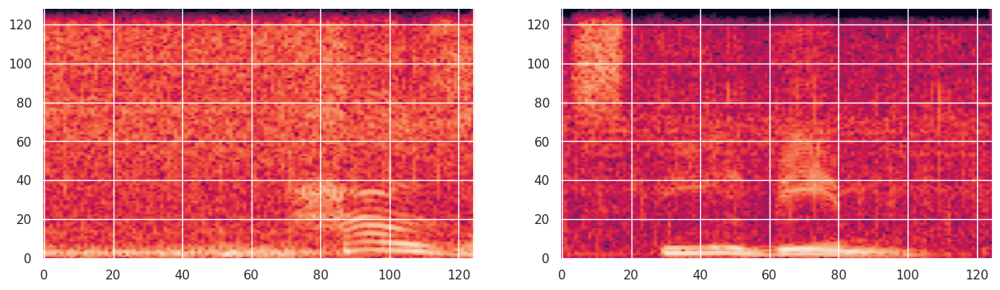

In [ ]:
for a,b in train_ds.take(2):
    print(a.shape, b)

plt.figure(figsize=(15,4))
for i in range(2):
    plt.subplot(1,2,i+1)
    plt.imshow(a[i][:,:,0].numpy().T,origin="lower", aspect="auto")

## 9.7.3 Model 정의, 훈련, 결과
-VGG, Simple-CNN, Resent 3가지 모델을 구현.

### Model-VGG

In [ ]:
assert  MODEL_NAME == 'VGG'

model_vgg = tf.keras.Sequential([
    tf.keras.layers.Input(shape=input_shape[1:]),
    experimental.preprocessing.Resizing(128, 128),
    vgg16.VGG16(weights=None,include_top=False),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_labels),  # logits
])

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)  # VGG에서 0.001이면 안된다.

model_vgg.compile(optimizer = optimizer,
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics = ['accuracy'])

model_filename = "Epoch-{epoch:03d}-{val_accuracy:.4f}" # val_accuracy~(이름이 중요)~
checkpoint_path = os.path.join(f'model-{MODEL_NAME}', model_filename)
cp_cb = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,
							verbose=1,mode='auto',save_best_only=True,monitor='val_accuracy',
                            initial_value_threshold=0.95)

es_cb = tf.keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [ ]:
model_vgg.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_1 (Resizing)       (None, 128, 128, 3)       0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 global_average_pooling2d_1  (None, 512)               0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 5)                 1285      
                                                      

In [ ]:
print(f'model name: {MODEL_NAME}')
print(tf.config.list_physical_devices('GPU'))

EPOCHS = 100
history_vgg = model_vgg.fit(train_ds, epochs=EPOCHS,verbose=1,validation_data=val_ds,validation_freq=1,callbacks=[cp_cb,es_cb])

model name: VGG
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Epoch 1/100
106/106 [==============================] - ETA: 0s - loss: 1.5207 - accuracy: 0.2739
Epoch 1: val_accuracy did not improve from 0.95000
106/106 [==============================] - 39s 284ms/step - loss: 1.5207 - accuracy: 0.2739 - val_loss: 1.2589 - val_accuracy: 0.4280
Epoch 2/100
106/106 [==============================] - ETA: 0s - loss: 0.9918 - accuracy: 0.5541
Epoch 2: val_accuracy did not improve from 0.95000
106/106 [==============================] - 33s 279ms/step - loss: 0.9918 - accuracy: 0.5541 - val_loss: 0.6677 - val_accuracy: 0.7147
Epoch 3/100
106/106 [==============================] - ETA: 0s - loss: 0.7878 - accuracy: 0.6615
Epoch 3: val_accuracy did not improve from 0.95000
106/106 [==============================] - 34s 278ms/step - loss: 0.7878 - accuracy: 0.6615 - val_loss: 0.5896 - val_accuracy: 0.7693
Epoch 4/100
106/106 [==============================] - ETA: 0s - loss: 

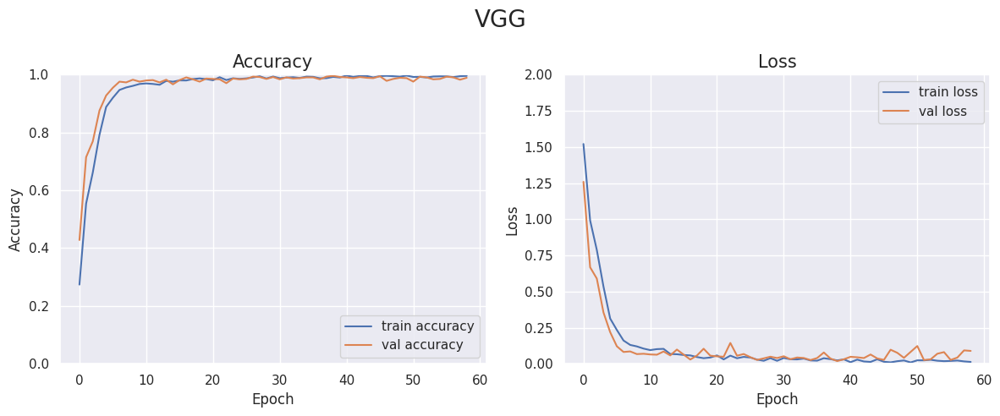

In [ ]:
plot_history(history_vgg,'VGG','speaker_recognition_vgg_loss_acc.png')  # plot_history() 9.3.2에 정의되어 있다.

Confusion Matrix

In [ ]:
# (파일 크기가 약 160M로, 저자가 별도로 공유한) 모델 파일을 다운로드 받을 수 있다.
!gdown 1WqK0Pm436_MjnTnd6NKEPuevxQU9-PfD
!unzip model-VGG.zip -d model-VGG

Downloading...
From: https://drive.google.com/uc?id=1WqK0Pm436_MjnTnd6NKEPuevxQU9-PfD
To: /content/model-VGG.zip
100% 166M/166M [00:06<00:00, 27.4MB/s]


In [ ]:
MODEL_NAME = 'VGG'
NUM_CHANNELS = 3
LEARNING_RATE = 0.0001

model_vgg = tf.keras.Sequential([
    tf.keras.layers.Input(shape=input_shape[1:]),
    experimental.preprocessing.Resizing(128, 128),
    vgg16.VGG16(weights=None,include_top=False),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_labels),  # logits
])
optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)  # VGG에서 0.001이면 안된다.

model_vgg.compile(optimizer = optimizer,
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics = ['accuracy'])

In [ ]:
model_vgg.load_weights(tf.train.latest_checkpoint('model-VGG'))  # model-VGG 디렉토리 아래에 checkpoint 파일이 있어야 한다.

In [ ]:
model_vgg.evaluate(val_ds)

12/12 [==============================] - 2s 83ms/step - loss: 0.0188 - accuracy: 0.9960


[0.018765607848763466, 0.9959999918937683]

2/2 [==============================] - 0s 35ms/step
VGG Val Accuracy: 0.996


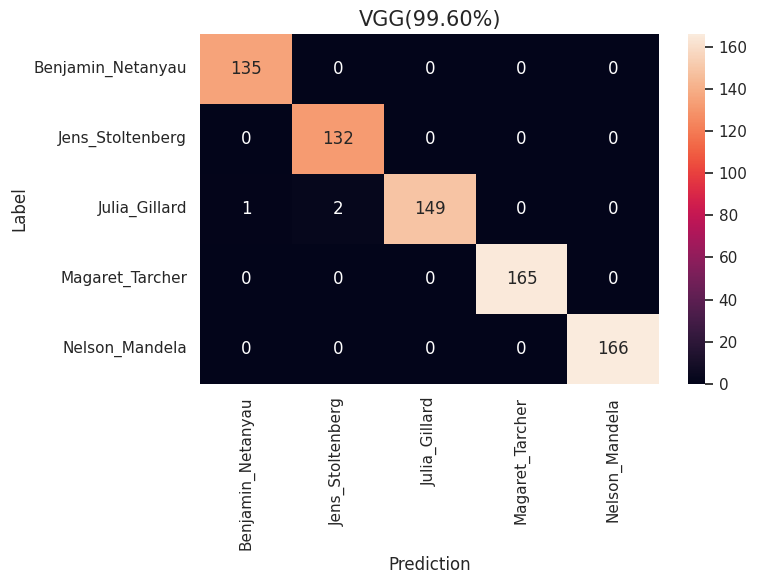

In [ ]:
val_pred = []
val_gt = []
for data in val_ds:
    pred = tf.argmax(model_vgg.predict(data[0]),-1)
    val_pred.append(pred.numpy())
    val_gt.append(data[1].numpy())
val_pred = np.concatenate(val_pred)
val_gt = np.concatenate(val_gt)

vgg_acc = round(accuracy_score(val_gt, val_pred), 5)
print(f'VGG Val Accuracy: {vgg_acc}')
plot_confusion_matrix(val_gt,val_pred,ALL_SPEAKER,f'VGG({vgg_acc:.2%})','speaker_recognition_vgg_confusion.png')  # plot_confusion_matrix() 9.3.2에 정의되어 있다.

### 잘못 예측된 waveform

In [ ]:
val_ds_waveform_batch= val_ds_waveform.batch(BATCH_SIZE).prefetch(5)
val_ds_zip = tf.data.Dataset.zip((val_ds_waveform_batch, val_ds))

In [ ]:
fallacy_prediction_waveforms = []
fallacy_prediction_gt = []
fallacy_prediction = []
fallacy_probability = []
for i, data in enumerate(val_ds_zip):
    logit = model_vgg.predict(data[1][0])
    pred = tf.argmax(logit,-1)
    ind = tf.reshape(tf.where(pred != data[1][1]),-1)
    if len(ind) > 0:
        fallacy_prediction_waveforms.append(tf.gather(data[0][0], ind))
        fallacy_prediction_gt.append(tf.gather(data[0][1], ind))
        fallacy_prediction.append(tf.gather(pred, ind))
        fallacy_probability.append(tf.nn.softmax(tf.gather(logit, ind),axis=-1))

fallacy_prediction_waveforms = tf.concat(fallacy_prediction_waveforms,axis=0).numpy()
fallacy_prediction_gt = tf.concat(fallacy_prediction_gt,axis=0).numpy()
fallacy_prediction = tf.concat(fallacy_prediction,axis=0).numpy()
fallacy_probability = tf.concat(fallacy_probability,axis=0).numpy()

print(f'# of fallacies of predictions: {len(fallacy_prediction_gt)}')

2/2 [==============================] - 0s 33ms/step
# of fallacies of predictions: 3


In [ ]:
print(ALL_SPEAKER)
for w,gt,pred, prob in zip(fallacy_prediction_waveforms,fallacy_prediction_gt,fallacy_prediction,fallacy_probability):
    prob = [(ALL_SPEAKER[i], f'{p:.2%}') for i,p in enumerate(prob)]
    print(f'ground truth: {ALL_SPEAKER[gt]}, model prediction: {ALL_SPEAKER[pred]}')
    print(f'prob: {prob}')
    ipd.display(ipd.Audio(w, rate=SAMPLING_RATE))

['Benjamin_Netanyau', 'Jens_Stoltenberg', 'Julia_Gillard', 'Magaret_Tarcher', 'Nelson_Mandela']
ground truth: Julia_Gillard, model prediction: Jens_Stoltenberg
prob: [('Benjamin_Netanyau', '0.12%'), ('Jens_Stoltenberg', '39.36%'), ('Julia_Gillard', '37.19%'), ('Magaret_Tarcher', '2.06%'), ('Nelson_Mandela', '21.27%')]


ground truth: Julia_Gillard, model prediction: Benjamin_Netanyau
prob: [('Benjamin_Netanyau', '99.33%'), ('Jens_Stoltenberg', '0.07%'), ('Julia_Gillard', '0.10%'), ('Magaret_Tarcher', '0.50%'), ('Nelson_Mandela', '0.00%')]


ground truth: Julia_Gillard, model prediction: Jens_Stoltenberg
prob: [('Benjamin_Netanyau', '0.39%'), ('Jens_Stoltenberg', '91.28%'), ('Julia_Gillard', '3.02%'), ('Magaret_Tarcher', '0.25%'), ('Nelson_Mandela', '5.06%')]


### Model-Simple-CNN
- class SimpleCNN은 Music "9.3.5"에서 정의했다.

In [ ]:
MODEL_NAME = 'SIMPLE-CNN'
if MODEL_NAME == 'VGG':
    NUM_CHANNELS = 3
    LEARNING_RATE = 0.0001
else:
    NUM_CHANNELS = 1
    LEARNING_RATE = 0.001

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = tf.data.Dataset.from_tensor_slices(train_files)
val_ds = tf.data.Dataset.from_tensor_slices(val_files)

train_ds = train_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (add_random_noise(waveform,0.8),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,NUM_CHANNELS),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(2000).batch(BATCH_SIZE).prefetch(5)

val_ds_waveform = val_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
val_ds = val_ds_waveform.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,NUM_CHANNELS),label), num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(5)

input_shape = list(train_ds.element_spec[0].shape)
num_labels = len(ALL_SPEAKER)
print(f'Input shape: {input_shape}, num labels: {num_labels}')

Input shape: [None, 125, 129, 1], num labels: 5


In [ ]:
assert MODEL_NAME == 'SIMPLE-CNN'

model_cnn = SimpleCNN(num_labels, flatten=False)

optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)
model_cnn.compile(optimizer = optimizer,
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics = ['accuracy'])

model_filename = "Epoch-{epoch:03d}-{val_accuracy:.4f}" # val_accuracy~(이름이 중요)~
checkpoint_path = os.path.join(f'model-{MODEL_NAME}', model_filename)
cp_cb = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,
							verbose=1,mode='auto',save_best_only=True,monitor='val_accuracy',
                            initial_value_threshold=0.95)

es_cb = tf.keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [ ]:
model_cnn.build(input_shape)
model_cnn.summary()

Model: "simple_cnn"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_5 (Sequential)   (None, 62, 64, 32)        320       
                                                                 
 sequential_6 (Sequential)   (None, 31, 32, 64)        18496     
                                                                 
 sequential_7 (Sequential)   (None, 16, 16, 128)       73856     
                                                                 
 sequential_8 (Sequential)   (None, 512)               66048     
                                                                 
 dense_11 (Dense)            multiple                  2565      
                                                                 
Total params: 161285 (630.02 KB)
Trainable params: 161285 (630.02 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
print(f'model name: {MODEL_NAME}')
print(tf.config.list_physical_devices('GPU'))

EPOCHS = 100
history_cnn = model_cnn.fit(train_ds, epochs=EPOCHS,verbose=1,validation_data=val_ds,validation_freq=1,callbacks=[cp_cb,es_cb])

model name: SIMPLE-CNN
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Epoch 1/100
106/106 [==============================] - ETA: 0s - loss: 1.9038 - accuracy: 0.2130
Epoch 1: val_accuracy did not improve from 0.95000
106/106 [==============================] - 20s 125ms/step - loss: 1.9038 - accuracy: 0.2130 - val_loss: 1.6091 - val_accuracy: 0.2213
Epoch 2/100
106/106 [==============================] - ETA: 0s - loss: 1.5032 - accuracy: 0.3050
Epoch 2: val_accuracy did not improve from 0.95000
106/106 [==============================] - 17s 119ms/step - loss: 1.5032 - accuracy: 0.3050 - val_loss: 1.3609 - val_accuracy: 0.3560
Epoch 3/100
105/106 [============================>.] - ETA: 0s - loss: 1.0600 - accuracy: 0.5344
Epoch 3: val_accuracy did not improve from 0.95000
106/106 [==============================] - 16s 125ms/step - loss: 1.0581 - accuracy: 0.5356 - val_loss: 1.2156 - val_accuracy: 0.4787
Epoch 4/100
105/106 [============================>.] - ETA: 0s -

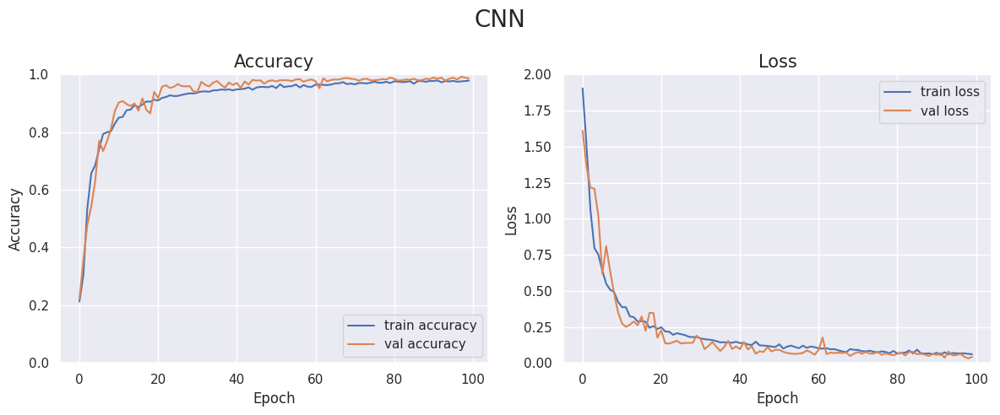

In [ ]:
plot_history(history_cnn,'CNN','speaker_recognition_cnn_loss_acc.png')

confusion matrix

In [ ]:
# (저자가 별도로 공유한) 모델 파일을 다운로드 받을 수 있다.
!gdown 1viE_N676Bz0q10Gqt_IMJW6z0kW-VS41
!unzip model-SIMPLE-CNN.zip -d model-SIMPLE-CNN

In [ ]:
assert MODEL_NAME == 'SIMPLE-CNN'

model_cnn = SimpleCNN(num_labels, flatten=False)

optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)
model_cnn.compile(optimizer = optimizer,
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics = ['accuracy'])

In [ ]:
model_cnn.load_weights(tf.train.latest_checkpoint('model-SIMPLE-CNN'))

In [ ]:
model_cnn.evaluate(val_ds)

12/12 [==============================] - 2s 132ms/step - loss: 0.0434 - accuracy: 0.9920


[0.04341127350926399, 0.9919999837875366]

2/2 [==============================] - 0s 139ms/step
CNN Val Accuracy: 0.992


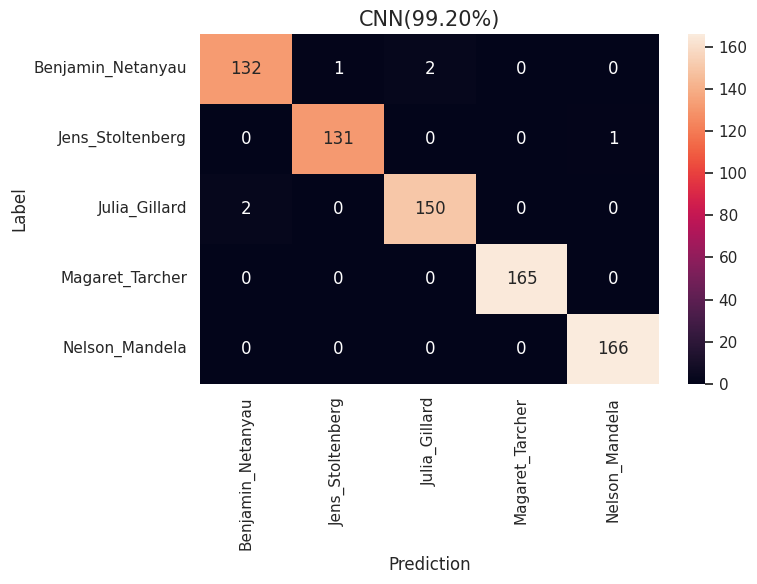

In [ ]:
val_pred = []
val_gt = []
for data in val_ds:
    pred = tf.argmax(model_cnn.predict(data[0]),-1)
    val_pred.append(pred.numpy())
    val_gt.append(data[1].numpy())
val_pred = np.concatenate(val_pred)
val_gt = np.concatenate(val_gt)

vgg_acc = round(accuracy_score(val_gt, val_pred), 5)
print(f'CNN Val Accuracy: {vgg_acc}')
plot_confusion_matrix(val_gt,val_pred,ALL_SPEAKER,f'CNN({vgg_acc:.2%})','speaker_recognition_cnn_confusion.png')

### 잘못 예측된 waveform

In [ ]:
val_ds_waveform_batch= val_ds_waveform.batch(BATCH_SIZE).prefetch(5)
val_ds_zip = tf.data.Dataset.zip((val_ds_waveform_batch, val_ds))

In [ ]:
fallacy_prediction_waveforms = []
fallacy_prediction_gt = []
fallacy_prediction = []
fallacy_probability = []
for i, data in enumerate(val_ds_zip):
    logit = model_cnn.predict(data[1][0])
    pred = tf.argmax(logit,-1)
    ind = tf.reshape(tf.where(pred != data[1][1]),-1)
    if len(ind) > 0:
        fallacy_prediction_waveforms.append(tf.gather(data[0][0], ind))
        fallacy_prediction_gt.append(tf.gather(data[0][1], ind))
        fallacy_prediction.append(tf.gather(pred, ind))
        fallacy_probability.append(tf.nn.softmax(tf.gather(logit, ind),axis=-1))

fallacy_prediction_waveforms = tf.concat(fallacy_prediction_waveforms,axis=0).numpy()
fallacy_prediction_gt = tf.concat(fallacy_prediction_gt,axis=0).numpy()
fallacy_prediction = tf.concat(fallacy_prediction,axis=0).numpy()
fallacy_probability = tf.concat(fallacy_probability,axis=0).numpy()

print(f'# of fallacies of predictions: {len(fallacy_prediction_gt)}')

2/2 [==============================] - 0s 7ms/step
# of fallacies of predictions: 6


In [ ]:
print(ALL_SPEAKER)
for w,gt,pred, prob in zip(fallacy_prediction_waveforms,fallacy_prediction_gt,fallacy_prediction,fallacy_probability):
    prob = [(ALL_SPEAKER[i], f'{p:.2%}') for i,p in enumerate(prob)]
    print(f'ground truth: {ALL_SPEAKER[gt]}, model prediction: {ALL_SPEAKER[pred]}')
    print(f'prob: {prob}')
    ipd.display(ipd.Audio(w, rate=SAMPLING_RATE))

['Benjamin_Netanyau', 'Jens_Stoltenberg', 'Julia_Gillard', 'Magaret_Tarcher', 'Nelson_Mandela']
ground truth: Julia_Gillard, model prediction: Benjamin_Netanyau
prob: [('Benjamin_Netanyau', '48.15%'), ('Jens_Stoltenberg', '20.92%'), ('Julia_Gillard', '30.66%'), ('Magaret_Tarcher', '0.26%'), ('Nelson_Mandela', '0.00%')]


ground truth: Benjamin_Netanyau, model prediction: Julia_Gillard
prob: [('Benjamin_Netanyau', '0.00%'), ('Jens_Stoltenberg', '0.00%'), ('Julia_Gillard', '100.00%'), ('Magaret_Tarcher', '0.00%'), ('Nelson_Mandela', '0.00%')]


ground truth: Julia_Gillard, model prediction: Benjamin_Netanyau
prob: [('Benjamin_Netanyau', '99.87%'), ('Jens_Stoltenberg', '0.08%'), ('Julia_Gillard', '0.02%'), ('Magaret_Tarcher', '0.02%'), ('Nelson_Mandela', '0.00%')]


ground truth: Jens_Stoltenberg, model prediction: Nelson_Mandela
prob: [('Benjamin_Netanyau', '0.00%'), ('Jens_Stoltenberg', '46.66%'), ('Julia_Gillard', '0.01%'), ('Magaret_Tarcher', '0.00%'), ('Nelson_Mandela', '53.32%')]


ground truth: Benjamin_Netanyau, model prediction: Julia_Gillard
prob: [('Benjamin_Netanyau', '21.35%'), ('Jens_Stoltenberg', '0.00%'), ('Julia_Gillard', '78.64%'), ('Magaret_Tarcher', '0.00%'), ('Nelson_Mandela', '0.00%')]


ground truth: Benjamin_Netanyau, model prediction: Jens_Stoltenberg
prob: [('Benjamin_Netanyau', '28.48%'), ('Jens_Stoltenberg', '46.96%'), ('Julia_Gillard', '10.30%'), ('Magaret_Tarcher', '14.26%'), ('Nelson_Mandela', '0.00%')]


### Resnet without BN

In [ ]:
MODEL_NAME = 'RESNET'
if MODEL_NAME == 'VGG':
    NUM_CHANNELS = 3
    LEARNING_RATE = 0.0001
else:
    NUM_CHANNELS = 1
    LEARNING_RATE = 0.001

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = tf.data.Dataset.from_tensor_slices(train_files)
val_ds = tf.data.Dataset.from_tensor_slices(val_files)

train_ds = train_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (add_random_noise(waveform,0.8),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,NUM_CHANNELS),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(2000).batch(BATCH_SIZE).prefetch(5)

val_ds_waveform = val_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
val_ds = val_ds_waveform.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,NUM_CHANNELS),label), num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(5)

input_shape = list(train_ds.element_spec[0].shape)
num_labels = len(ALL_SPEAKER)
print(f'Input shape: {input_shape}, num labels: {num_labels}')

Input shape: [None, 125, 129, 1], num labels: 5


In [ ]:
def residual_block(x, filters, conv_num=3, activation="relu"):
    s = tf.keras.layers.Conv2D(filters, 1, padding="same")(x)
    for i in range(conv_num - 1):
        x = tf.keras.layers.Conv2D(filters, 3, padding="same")(x)
        x = tf.keras.layers.Activation(activation)(x)
    x = tf.keras.layers.Conv2D(filters, 3, padding="same")(x)
    x = tf.keras.layers.Add()([x, s])
    x = tf.keras.layers.Activation(activation)(x)
    return tf.keras.layers.MaxPool2D(pool_size=2, strides=2)(x)

def build_resnet_model(input_shape, num_classes):
    inputs = tf.keras.layers.Input(shape=input_shape, name="input")

    x = residual_block(inputs, 16, 2)
    x = residual_block(x, 32, 2)
    x = residual_block(x, 64, 3)
    x = residual_block(x, 128, 3)
    x = residual_block(x, 128, 3)

    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(256, activation="relu")(x)
    x = tf.keras.layers.Dense(128, activation="relu")(x)

    outputs = tf.keras.layers.Dense(num_classes)(x)

    return tf.keras.models.Model(inputs=inputs, outputs=outputs)

In [ ]:
assert MODEL_NAME == 'RESNET'

model_resnet = build_resnet_model(input_shape[1:], num_labels)
optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

model_resnet.compile(optimizer = optimizer,
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics = ['accuracy'])

model_filename = "Epoch-{epoch:03d}-{val_accuracy:.4f}" # val_accuracy~(이름이 중요)~
checkpoint_path = os.path.join(f'model-{MODEL_NAME}', model_filename)
cp_cb = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True,
							verbose=1,mode='auto',save_best_only=True,monitor='val_accuracy',
                            initial_value_threshold=0.95)

es_cb = tf.keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True)

In [ ]:
model_resnet.summary()  # 1,014,581

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 125, 129, 1)]        0         []                            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 125, 129, 16)         160       ['input[0][0]']               
                                                                                                  
 activation (Activation)     (None, 125, 129, 16)         0         ['conv2d_7[0][0]']            
                                                                                                  
 conv2d_8 (Conv2D)           (None, 125, 129, 16)         2320      ['activation[0][0]']          
                                                                                              

In [ ]:
print(f'model name: {MODEL_NAME}')
print(tf.config.list_physical_devices('GPU'))

EPOCHS = 100
history_resnet = model_resnet.fit(train_ds, epochs=EPOCHS,verbose=1,validation_data=val_ds,validation_freq=1,callbacks=[cp_cb,es_cb])

model name: RESNET
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Epoch 1/100
106/106 [==============================] - ETA: 0s - loss: 1.6241 - accuracy: 0.3168
Epoch 1: val_accuracy did not improve from 0.95000
106/106 [==============================] - 32s 148ms/step - loss: 1.6241 - accuracy: 0.3168 - val_loss: 0.8092 - val_accuracy: 0.6987
Epoch 2/100
105/106 [============================>.] - ETA: 0s - loss: 0.7280 - accuracy: 0.6946
Epoch 2: val_accuracy did not improve from 0.95000
106/106 [==============================] - 17s 133ms/step - loss: 0.7265 - accuracy: 0.6952 - val_loss: 0.7141 - val_accuracy: 0.7600
Epoch 3/100
105/106 [============================>.] - ETA: 0s - loss: 0.4441 - accuracy: 0.8298
Epoch 3: val_accuracy did not improve from 0.95000
106/106 [==============================] - 18s 133ms/step - loss: 0.4433 - accuracy: 0.8301 - val_loss: 0.2111 - val_accuracy: 0.9333
Epoch 4/100
105/106 [============================>.] - ETA: 0s - los

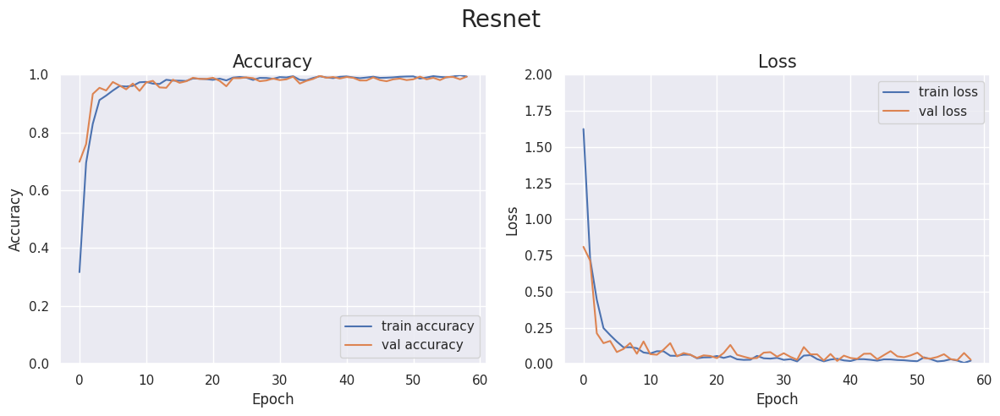

In [ ]:
plot_history(history_resnet,'Resnet','speaker_recognition_resnet_loss_acc.png')

confusion matrix

In [ ]:
assert MODEL_NAME == 'RESNET'

model_resnet = build_resnet_model(input_shape[1:], num_labels)
optimizer = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

model_resnet.compile(optimizer = optimizer,
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics = ['accuracy'])

In [ ]:
model_resnet.load_weights(tf.train.latest_checkpoint('model-RESNET'))

In [ ]:
model_resnet.evaluate(val_ds)

12/12 [==============================] - 2s 122ms/step - loss: 0.0226 - accuracy: 0.9960


[0.022616924718022346, 0.9959999918937683]

2/2 [==============================] - 0s 13ms/step
Resnet Val Accuracy: 0.996


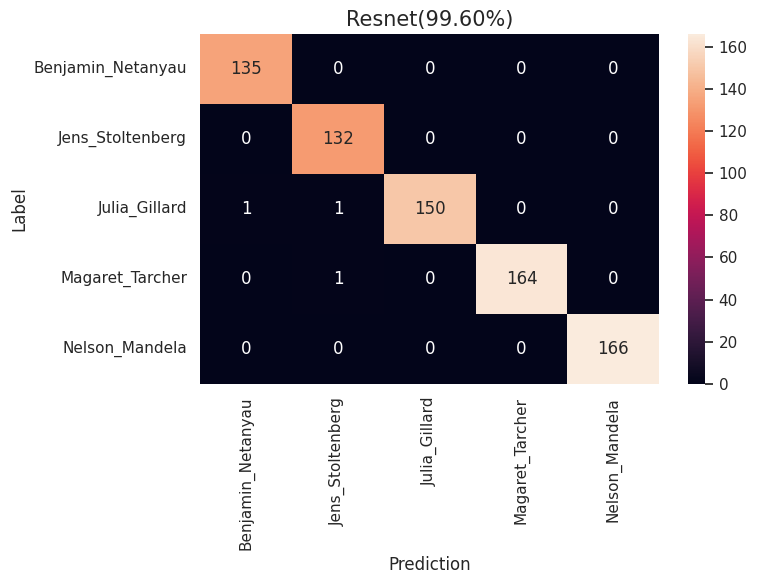

In [ ]:
val_pred = []
val_gt = []
for data in val_ds:
    pred = tf.argmax(model_resnet.predict(data[0]),-1)
    val_pred.append(pred.numpy())
    val_gt.append(data[1].numpy())
val_pred = np.concatenate(val_pred)
val_gt = np.concatenate(val_gt)

vgg_acc = round(accuracy_score(val_gt, val_pred), 5)
print(f'Resnet Val Accuracy: {vgg_acc}')
plot_confusion_matrix(val_gt,val_pred,ALL_SPEAKER,f'Resnet({vgg_acc:.2%})','speaker_recognition_resnet_confusion.png')

### 잘못 예측된 waveform

In [ ]:
val_ds_waveform_batch= val_ds_waveform.batch(BATCH_SIZE).prefetch(5)
val_ds_zip = tf.data.Dataset.zip((val_ds_waveform_batch, val_ds))

In [ ]:
fallacy_prediction_waveforms = []
fallacy_prediction_gt = []
fallacy_prediction = []
fallacy_probability = []
for i, data in enumerate(val_ds_zip):
    logit = model_resnet.predict(data[1][0])
    pred = tf.argmax(logit,-1)
    ind = tf.reshape(tf.where(pred != data[1][1]),-1)
    if len(ind) > 0:
        fallacy_prediction_waveforms.append(tf.gather(data[0][0], ind))
        fallacy_prediction_gt.append(tf.gather(data[0][1], ind))
        fallacy_prediction.append(tf.gather(pred, ind))
        fallacy_probability.append(tf.nn.softmax(tf.gather(logit, ind),axis=-1))

fallacy_prediction_waveforms = tf.concat(fallacy_prediction_waveforms,axis=0).numpy()
fallacy_prediction_gt = tf.concat(fallacy_prediction_gt,axis=0).numpy()
fallacy_prediction = tf.concat(fallacy_prediction,axis=0).numpy()
fallacy_probability = tf.concat(fallacy_probability,axis=0).numpy()

print(f'# of fallacies of predictions: {len(fallacy_prediction_gt)}')

2/2 [==============================] - 0s 17ms/step
# of fallacies of predictions: 3


In [ ]:
print(ALL_SPEAKER)
for w,gt,pred, prob in zip(fallacy_prediction_waveforms,fallacy_prediction_gt,fallacy_prediction,fallacy_probability):
    prob = [(ALL_SPEAKER[i], f'{p:.2%}') for i,p in enumerate(prob)]
    print(f'ground truth: {ALL_SPEAKER[gt]}, model prediction: {ALL_SPEAKER[pred]}')
    print(f'prob: {prob}')
    ipd.display(ipd.Audio(w, rate=SAMPLING_RATE))

['Benjamin_Netanyau', 'Jens_Stoltenberg', 'Julia_Gillard', 'Magaret_Tarcher', 'Nelson_Mandela']
ground truth: Julia_Gillard, model prediction: Benjamin_Netanyau
prob: [('Benjamin_Netanyau', '98.76%'), ('Jens_Stoltenberg', '1.09%'), ('Julia_Gillard', '0.04%'), ('Magaret_Tarcher', '0.11%'), ('Nelson_Mandela', '0.00%')]


ground truth: Magaret_Tarcher, model prediction: Jens_Stoltenberg
prob: [('Benjamin_Netanyau', '0.03%'), ('Jens_Stoltenberg', '54.46%'), ('Julia_Gillard', '0.21%'), ('Magaret_Tarcher', '17.29%'), ('Nelson_Mandela', '28.01%')]


ground truth: Julia_Gillard, model prediction: Jens_Stoltenberg
prob: [('Benjamin_Netanyau', '0.05%'), ('Jens_Stoltenberg', '98.17%'), ('Julia_Gillard', '1.77%'), ('Magaret_Tarcher', '0.00%'), ('Nelson_Mandela', '0.01%')]


# 연습장

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = tf.data.Dataset.from_tensor_slices(train_files)
val_ds = tf.data.Dataset.from_tensor_slices(val_files)

train_ds = train_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (add_random_noise(waveform,0.8),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,1),label), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.shuffle(2000).batch(BATCH_SIZE).prefetch(5)

val_ds_waveform = val_ds.map( map_func=get_waveform_and_label_id, num_parallel_calls=AUTOTUNE)
val_ds = val_ds_waveform.map(lambda waveform, label: (preprocess_dataset(waveform,FRAME_LENGTH,FRAME_STEP,1),label), num_parallel_calls=AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(5)

input_shape = list(train_ds.element_spec[0].shape)
num_labels = len(ALL_SPEAKER)
print(f'Input shape: {input_shape}, num labels: {num_labels}')

Input shape: [None, 125, 129, 1], num labels: 5


In [ ]:
model_vgg = tf.keras.Sequential([
    tf.keras.layers.Input(shape=input_shape[1:]),
    experimental.preprocessing.Resizing(128, 128),
    vgg16.VGG16(weights=None,include_top=False,input_shape=(128,128,1)),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(num_labels),  # logits
])

In [ ]:
for a,b in train_ds.take(1):
    y = model_vgg(a)
    print(a.shape, y.shape)

(64, 125, 129, 1) (64, 5)


In [ ]:
model_vgg.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_3 (Resizing)       (None, 128, 128, 1)       0         
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14713536  
                                                                 
 global_average_pooling2d_2   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 5)                 1285      
                                                      

In [ ]:
ALL_SPEAKER

['Benjamin_Netanyau',
 'Jens_Stoltenberg',
 'Julia_Gillard',
 'Magaret_Tarcher',
 'Nelson_Mandela']

In [ ]:
prob = scipy.special.softmax(np.random.rand(5))
prob

array([0.18585527, 0.27337376, 0.20445798, 0.1399756 , 0.19633738])

In [ ]:
a = [{ALL_SPEAKER[i]: f'{p:.2%}'} for i,p in enumerate(prob)]
print(a)

[{'Benjamin_Netanyau': '18.59%'}, {'Jens_Stoltenberg': '27.34%'}, {'Julia_Gillard': '20.45%'}, {'Magaret_Tarcher': '14.00%'}, {'Nelson_Mandela': '19.63%'}]


In [ ]:
import scipy

In [ ]:
!rm -r model-VGG

In [ ]:
!rm -r model-RESNET